# Bank Marketing Campaign-Predictive Analysis



## Batch 1

## Problem Statement:
There has been a revenue decline for the Portuguese bank and they would like to know what actions to take. After investigation, we found out that the root cause is that their clients are not depositing as frequently as before. Knowing that term deposits allow banks to hold onto a deposit for a specific amount of time, so banks can invest in higher gain financial products to make a profit. In addition, banks also hold better chance to persuade term deposit clients into buying other products such as funds or insurance to further increase their revenues. As a result, the Portuguese bank would like to identify existing clients that have higher chance to subscribe for a term deposit and focus marketing effort on such clients.

# About Dataset:
It is a dataset that describing Portugal bank marketing campaigns results.Conducted campaigns were based mostly on direct phone calls, offering bank client to place a term deposit. If after all marking afforts client had agreed to place deposit - target variable marked 'yes', otherwise 'no'

## Attribute Information:

Input variables:
    
**bank client data**:
    
1 - age (numeric)

2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
    
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
    
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')

5 - default: has credit in default? (categorical: 'no','yes','unknown')
    
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
    
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
    
**related with the last contact of the current campaign**:
    
8 - contact: contact communication type (categorical: 'cellular','telephone')
    
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
    
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
    
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
        
        
**other attributes**:
    
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
    
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
    
14 - previous: number of contacts performed before this campaign and for this client (numeric)
    
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
    
**social and economic context attributes**

16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
    
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
    
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
    
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
    
20 - nr.employed: number of employees - quarterly indicator (numeric)

**Output variable (desired target)**:
    
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')



<a id = "lib"> </a>
### Importing Libraries

In [1]:
# importing libraries

import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

pd.options.display.max_columns = None
pd.options.display.max_rows = None

import warnings
warnings.filterwarnings("ignore")

<a id = "lib"> </a>
### Loading the data 

In [2]:
df = pd.read_csv("bank-additional-full.csv",sep=';')

In [3]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


<a id = "lib"> </a>
### Data Description

In [4]:
# get the unique values of each variable
df.apply(lambda x: len(x.unique())).sort_values(ascending = False)

duration          1544
euribor3m          316
age                 78
campaign            42
pdays               27
cons.conf.idx       26
cons.price.idx      26
job                 12
nr.employed         11
month               10
emp.var.rate        10
previous             8
education            8
day_of_week          5
marital              4
default              3
poutcome             3
loan                 3
housing              3
contact              2
y                    2
dtype: int64

In [5]:
# to find the shape of the dataset
df.shape

(41188, 21)

In [6]:
# To extract the columns
len(df.columns)

21

In [7]:
# to extract the datatypes of each columns using dtype function
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [8]:
# converting numeric into categorical
df = df.astype({'campaign': object, 'pdays': object, 'previous': object})

In [9]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign           object
pdays              object
previous           object
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [10]:
#to extract the information of dataset
# info() method allows us to learn the shape of object types of our data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  object 
 12  pdays           41188 non-null  object 
 13  previous        41188 non-null  object 
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [11]:
# to extract the description of data in  DataFrame 
#The .describe() method gives us summary statistics for numerical columns in our DataFrame.
df.describe()

,age,duration,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [12]:
# to extract the information of object type of variables
df.describe(include = ["object"])

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
count,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188
unique,12,4,8,3,3,3,2,10,5,42,27,8,3,2
top,admin.,married,university.degree,no,yes,no,cellular,may,thu,1,999,0,nonexistent,no
freq,10422,24928,12168,32588,21576,33950,26144,13769,8623,17642,39673,35563,35563,36548


In [13]:
# filter the categorical variables
df_num = df.select_dtypes(include= np.number)

# print frequency of categories
for col in df_num:
    print (df[col].value_counts(), '\n')

31    1947
32    1846
33    1833
36    1780
35    1759
34    1745
30    1714
37    1475
29    1453
39    1432
38    1407
41    1278
40    1161
42    1142
45    1103
43    1055
46    1030
44    1011
28    1001
48     979
47     928
50     875
27     851
49     839
52     779
51     754
53     733
56     704
26     698
54     684
55     648
57     646
25     598
58     576
24     463
59     463
60     283
23     226
22     137
21     102
61      73
20      65
62      62
64      57
66      57
63      55
71      53
70      47
65      44
19      42
76      34
73      34
72      34
69      34
68      33
74      32
80      31
18      28
78      27
67      26
75      24
88      22
77      20
81      20
83      17
82      17
85      15
79      14
86       8
84       7
17       5
92       4
98       2
89       2
91       2
94       1
87       1
95       1
Name: age, dtype: int64 

90      170
85      170
136     168
73      167
124     164
87      162
72      161
104     161
111     160
106     

In [14]:
# filter the categorical variables
df_cat = df.select_dtypes(include=object)

# print frequency of categories
for col in df_cat:
    print (df[col].value_counts(), '\n')

admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: job, dtype: int64 

married     24928
single      11568
divorced     4612
unknown        80
Name: marital, dtype: int64 

university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: education, dtype: int64 

no         32588
unknown     8597
yes            3
Name: default, dtype: int64 

yes        21576
no         18622
unknown      990
Name: housing, dtype: int64 

no         33950
yes         6248
unknown      990
Name: loan, dtype: int64 

cellular     26144
telephone    15044
Name: contact, dtype: int64 

may    13769
jul     717

# Exploratory Data Analysis
### Missing Values

In [15]:
# Checking if there are any null values
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

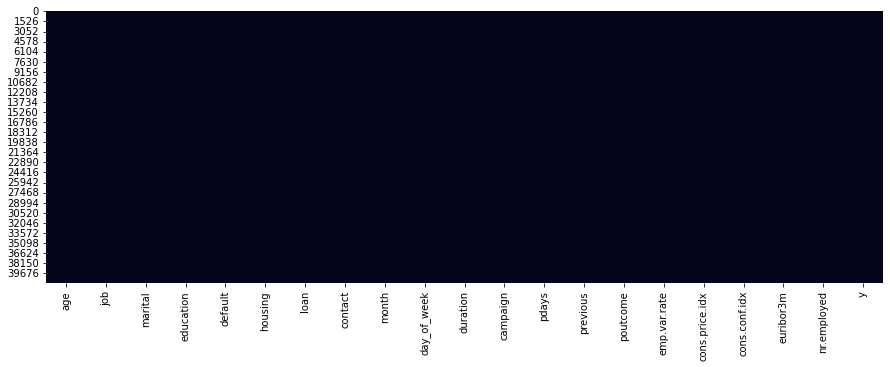

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# let us plot a heatmap of the missing values
# set the figure size
plt.rcParams["figure.figsize"]=[15,5]

# plot a heatmap of the missing values in the data
# cbar: specify whether to display the color index or not
sns.heatmap(df.isnull(), cbar = False)

# display the plot
plt.show()

## Outlier 

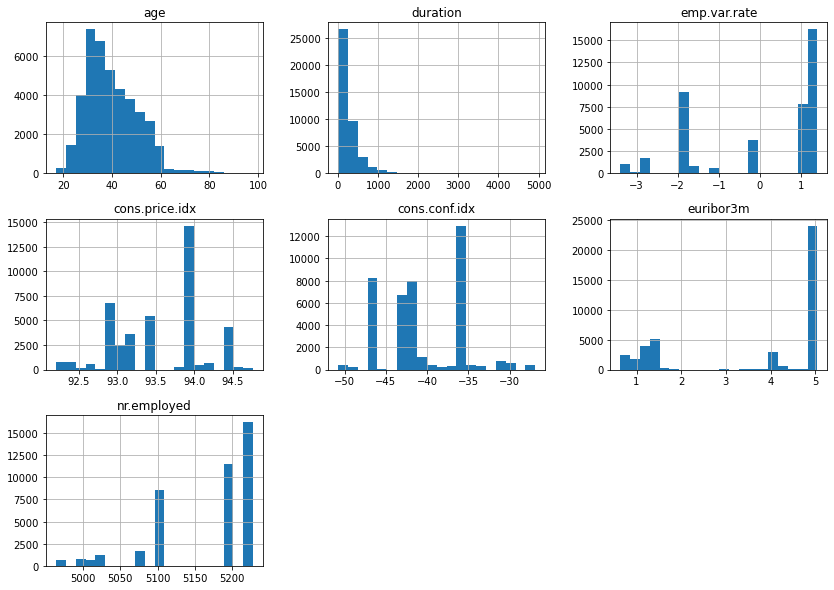

In [17]:
# Lets plot histogram for all the numerical variables
df_num.hist(bins=20, figsize=(14,10))
plt.show()

In [18]:
# to check the skewness of the data
df_num.skew().sort_values(ascending=False)

duration          3.263141
age               0.784697
cons.conf.idx     0.303180
cons.price.idx   -0.230888
euribor3m        -0.709188
emp.var.rate     -0.724096
nr.employed      -1.044262
dtype: float64

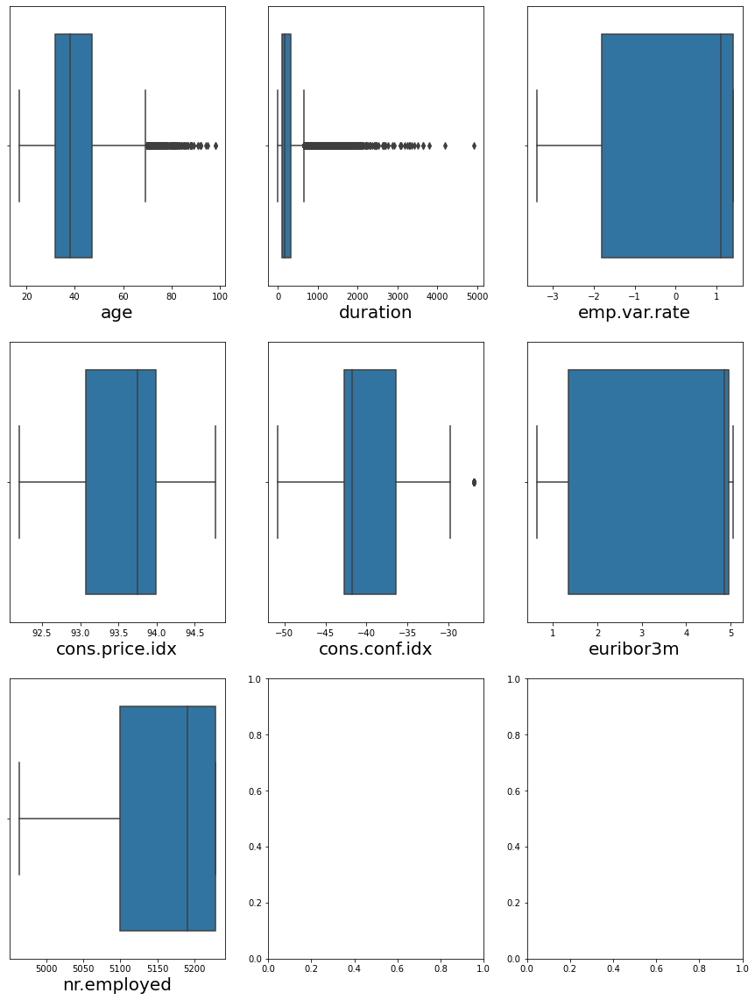

In [19]:
# Lets plot boxplot for all numeric variables to check if the outliers are present.
# filter the numeric variables from the data
df_num = df.select_dtypes(include = np.number)

# plot the boxplot for each variable
fig, ax = plt.subplots(3, 3, figsize=(15, 20))

for variable, subplot in zip(df_num.columns, ax.flatten()):
    z = sns.boxplot(x = df_num[variable], orient = "h",whis=1.5 , ax=subplot)         # plot the boxplot
    z.set_xlabel(variable, fontsize = 20)  

### Univarite analysis

In [20]:

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [21]:
df_num.head()

,age,duration,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,261,1.1,93.994,-36.4,4.857,5191.0
1,57,149,1.1,93.994,-36.4,4.857,5191.0
2,37,226,1.1,93.994,-36.4,4.857,5191.0
3,40,151,1.1,93.994,-36.4,4.857,5191.0
4,56,307,1.1,93.994,-36.4,4.857,5191.0


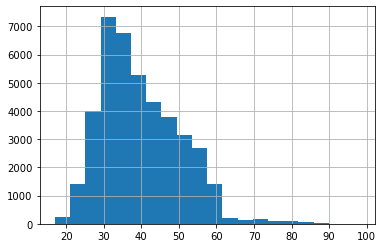

In [22]:
# age
df['age'].hist(bins=20)
plt.show()

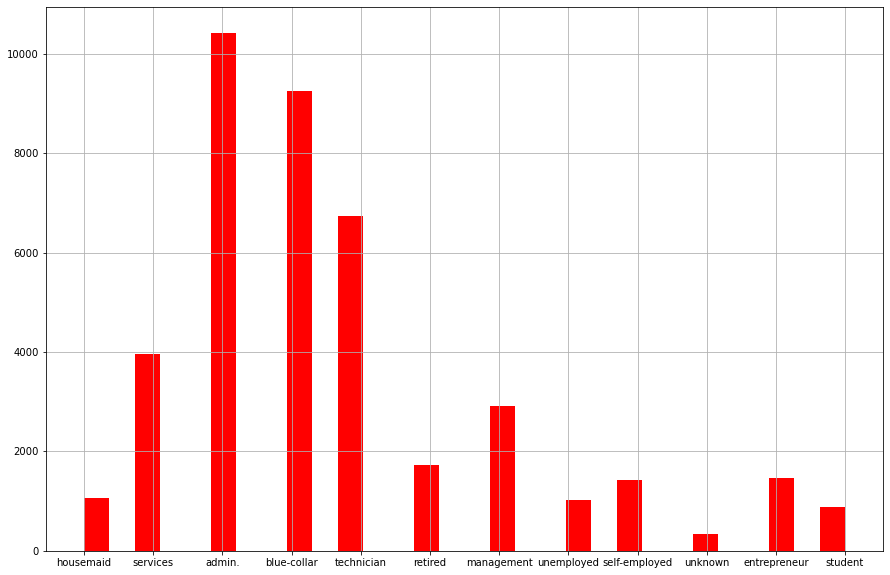

In [23]:
df['job'].hist(color = "r",
        bins = 30,
        figsize = (15, 10))
plt.show()

<AxesSubplot:xlabel='education', ylabel='count'>

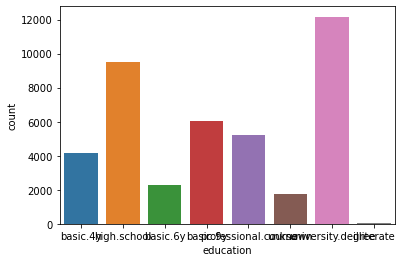

In [24]:
# education
sns.countplot(data=df, x="education" )

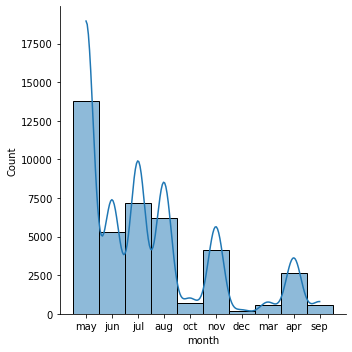

In [25]:
# month
sns.displot(df, x="month", kde = 'True')
plt.show()

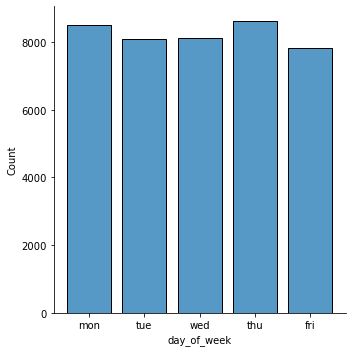

In [26]:
#day_of_week
sns.displot(df, x="day_of_week", shrink=.8)

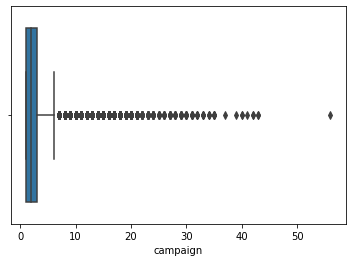

In [27]:
#campaign
sns.boxplot(data = df, x="campaign")
plt.show()

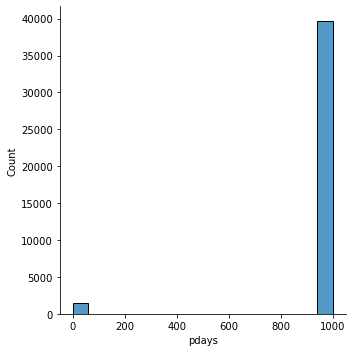

In [28]:
# pdays
sns.displot(data = df, x="pdays")
plt.show()

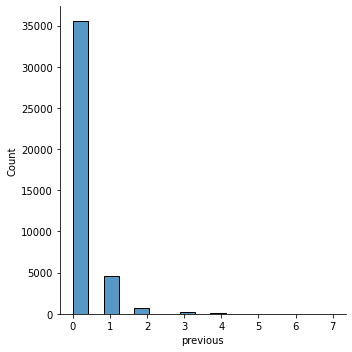

In [29]:
# previous
sns.displot(data = df, x="previous")
plt.show()

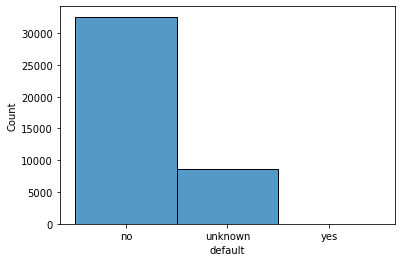

In [30]:
# default
sns.histplot(data=df, x="default")
plt.show()

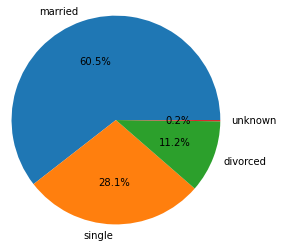

In [31]:
# marital
plt.pie(df.marital.value_counts(), autopct ='%.1f%%', radius = 1.2, labels = ['married','single','divorced','unknown'])
plt.show()

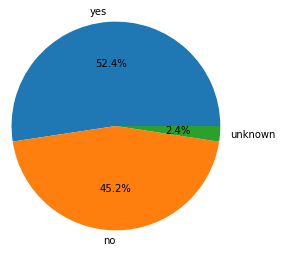

In [32]:
#housing
plt.pie(df.housing.value_counts(), autopct ='%.1f%%', radius = 1.2, labels = ['yes','no','unknown'])
plt.show()

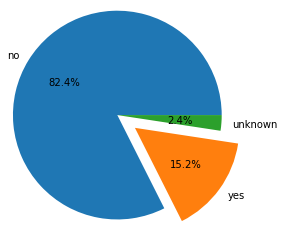

In [33]:
# loan
plt.pie(df.loan.value_counts(), autopct ='%.1f%%', radius = 1.2, labels = ['no','yes','unknown'], explode = [0,0.25,0])
plt.show()

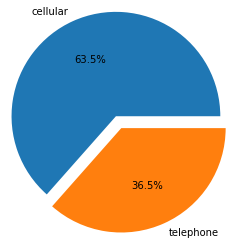

In [34]:
# contact
plt.pie(df.contact.value_counts(), autopct ='%.1f%%', radius = 1.2, labels = ['cellular', 'telephone'], explode = [0,0.15])
plt.show()

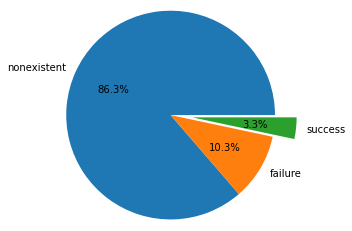

In [35]:
#poutcome
plt.pie(df.poutcome.value_counts(), autopct ='%.1f%%', radius = 1.2, labels = ['nonexistent', 'failure', 'success'], explode = [0,0,0.25])
plt.show()

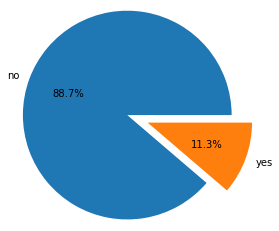

In [36]:
# y
plt.pie(df.y.value_counts(), autopct ='%.1f%%', radius = 1.2, labels = ['no','yes'], explode = [0,0.25])
plt.show()

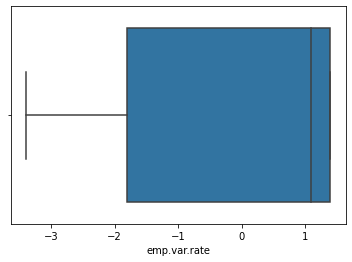

In [37]:
# emp.var.rate
sns.boxplot(df['emp.var.rate'])
plt.show()

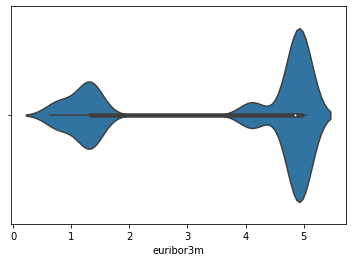

In [38]:
# euribor3m
sns.violinplot(df['euribor3m'])
plt.show()

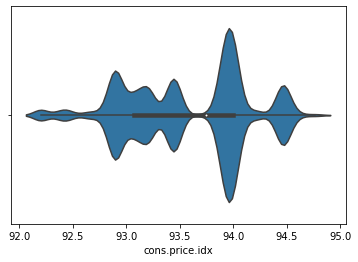

In [39]:
# cons.price.idx
sns.violinplot(df['cons.price.idx'])
plt.show()

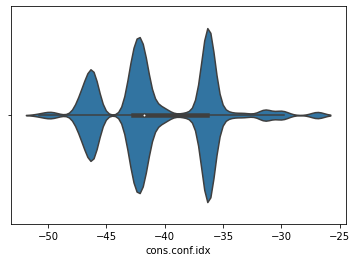

In [40]:
# cons.conf.idx
sns.violinplot(df['cons.conf.idx'])
plt.show()

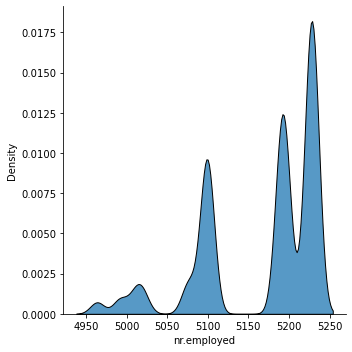

In [41]:
#nr.employed
sns.displot(df, x="nr.employed", kind="kde", multiple="stack")
plt.show()

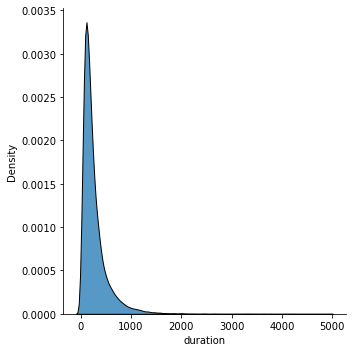

In [42]:
# duration
sns.displot(df, x="duration", kind="kde", multiple="stack")
plt.show()

## Bivariate Analysis
### Numerical v/s numerical

In [43]:
# Bivariate
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


In [44]:
df_num.head()

,age,duration,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,261,1.1,93.994,-36.4,4.857,5191.0
1,57,149,1.1,93.994,-36.4,4.857,5191.0
2,37,226,1.1,93.994,-36.4,4.857,5191.0
3,40,151,1.1,93.994,-36.4,4.857,5191.0
4,56,307,1.1,93.994,-36.4,4.857,5191.0


### age v/s numerical features

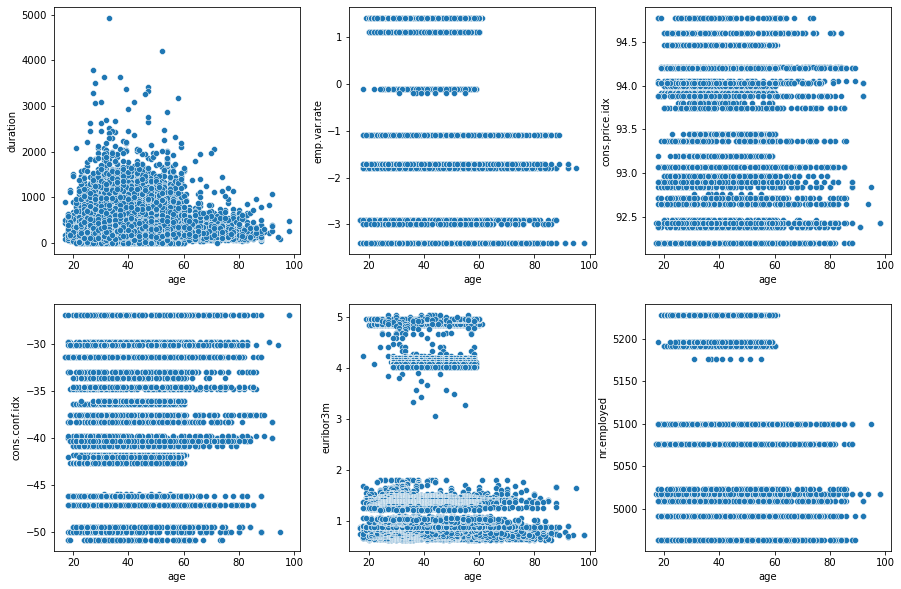

In [45]:
# Numerical
# age
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

#create chart in each subplot
sns.scatterplot(data=df, x='age', y='duration', ax=axes[0,0])
sns.scatterplot(data=df, x='age', y='emp.var.rate', ax=axes[0,1])
sns.scatterplot(data=df, x='age', y='cons.price.idx', ax=axes[0,2])
sns.scatterplot(data=df, x='age', y='cons.conf.idx', ax=axes[1,0])
sns.scatterplot(data=df, x='age', y='euribor3m', ax=axes[1,1])
sns.scatterplot(data=df, x='age', y='nr.employed', ax=axes[1,2])
plt.show()

### duration v/s numerical features

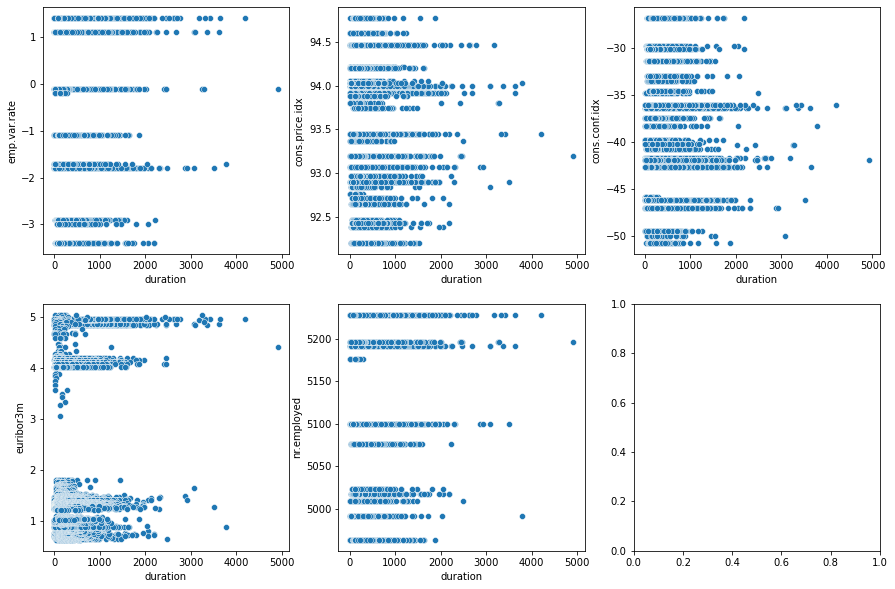

In [46]:
# duration
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

#create chart in each subplot
sns.scatterplot(data=df, x='duration', y='emp.var.rate', ax=axes[0,0])
sns.scatterplot(data=df, x='duration', y='cons.price.idx', ax=axes[0,1])
sns.scatterplot(data=df, x='duration', y='cons.conf.idx', ax=axes[0,2])
sns.scatterplot(data=df, x='duration', y='euribor3m', ax=axes[1,0])
sns.scatterplot(data=df, x='duration', y='nr.employed', ax=axes[1,1])
plt.show()

### emp.var.rate v/s numerical features

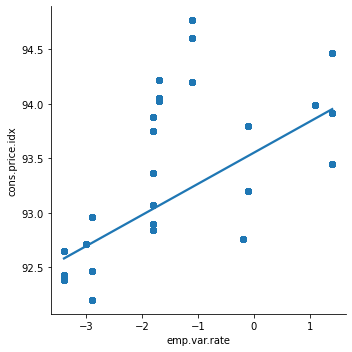

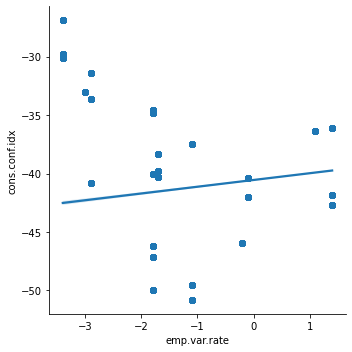

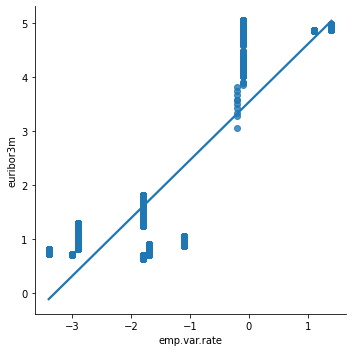

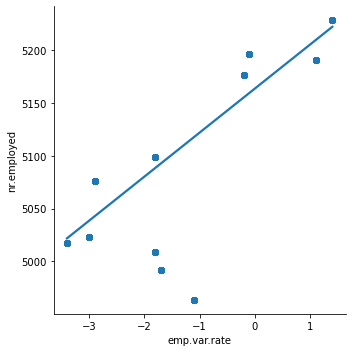

In [47]:
# emp.var.rate
sns.lmplot(data=df, x='emp.var.rate', y='cons.price.idx')
sns.lmplot(data=df, x='emp.var.rate', y='cons.conf.idx')
sns.lmplot(data=df, x='emp.var.rate', y='euribor3m')
sns.lmplot(data=df, x='emp.var.rate', y='nr.employed')
plt.show()

### cons.conf.idx v/s numerical features

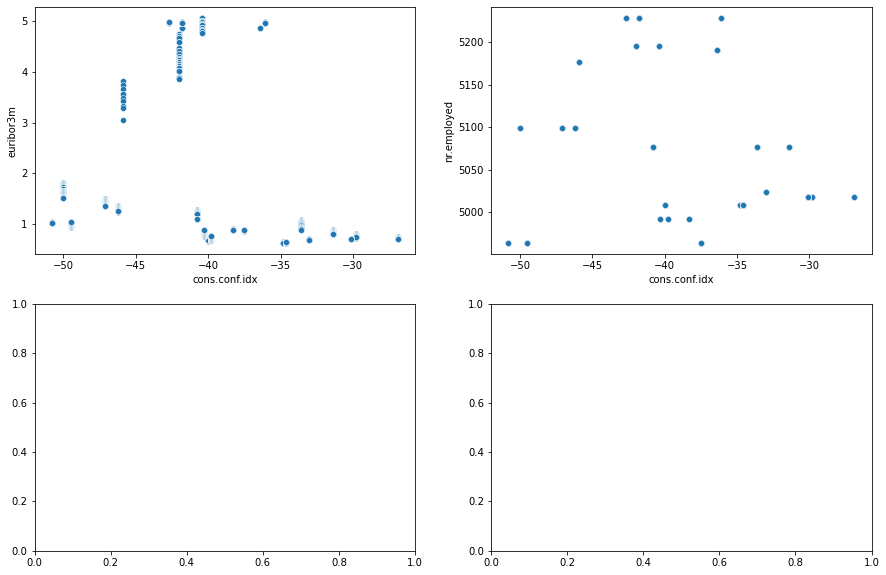

In [48]:
# cons.conf.idx
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.scatterplot(data=df, x='cons.conf.idx', y='euribor3m', ax=axes[0,0])
sns.scatterplot(data=df, x='cons.conf.idx', y='nr.employed', ax=axes[0,1])
plt.show()

### euribor3m v/s nr.employed

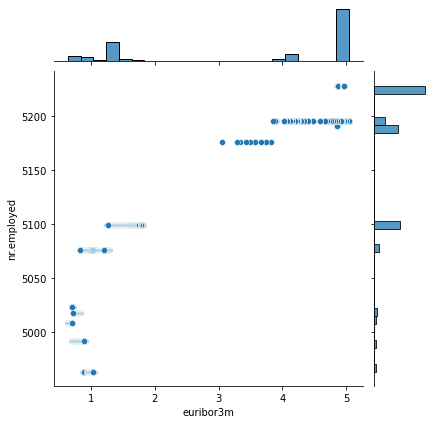

In [49]:
sns.jointplot(data=df, x='euribor3m', y='nr.employed')
plt.show()

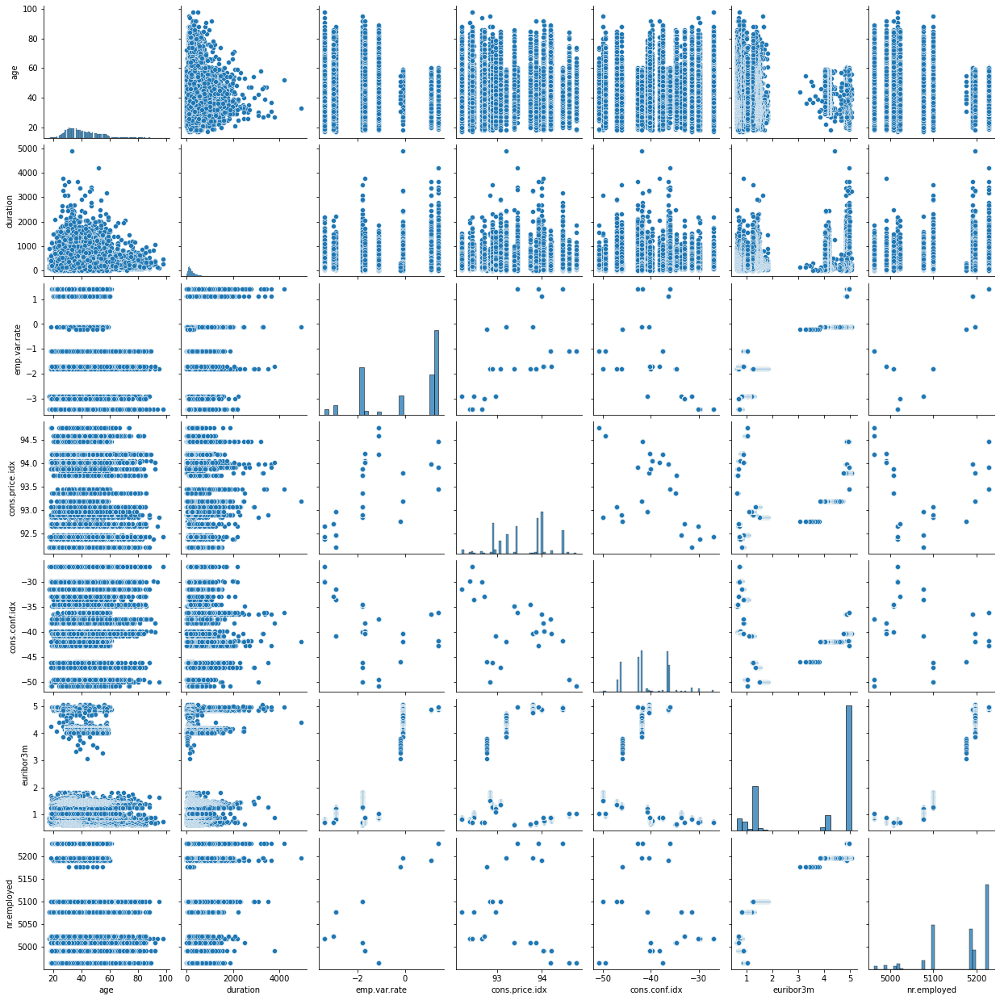

In [50]:
sns.pairplot(df_num)

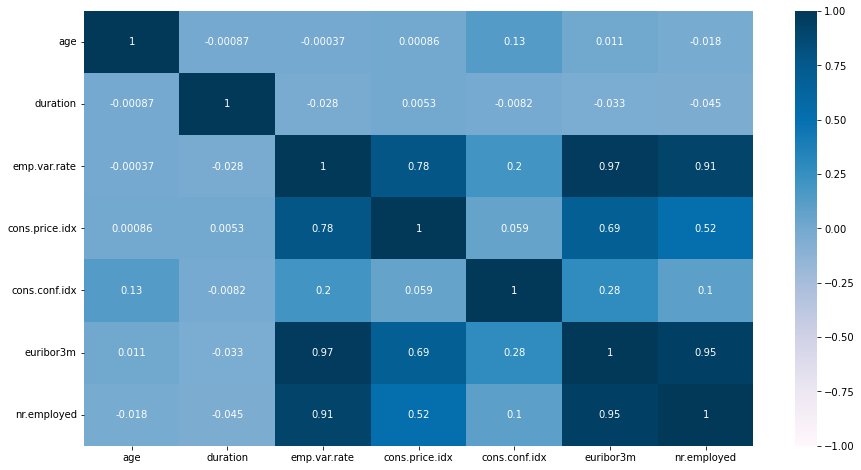

In [51]:
# set the figure size
plt.rcParams["figure.figsize"] = [15,8]

sns.heatmap(df_num.corr(), annot = True, cmap = 'PuBu', vmin=-1, vmax=1)
plt.show()

### Categorical v/s categorical

In [52]:
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


### Target y  v/s attributes

<AxesSubplot:title={'center':'term deposit v/s job'}, xlabel='job'>

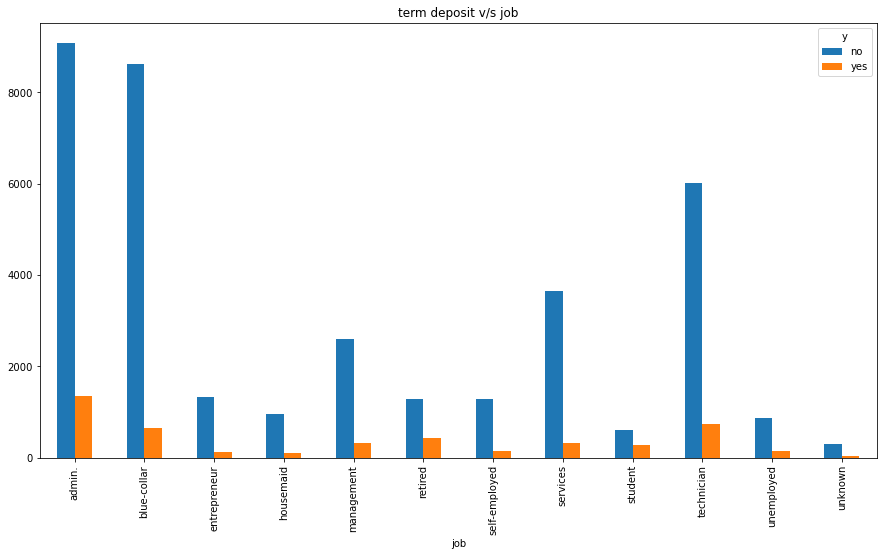

In [53]:
plt.rcParams["figure.figsize"] = [15,8]
stack = pd.crosstab(index=df['job'], columns= df['y'])
stack.plot.bar(title='term deposit v/s job', stacked= False, label='y')

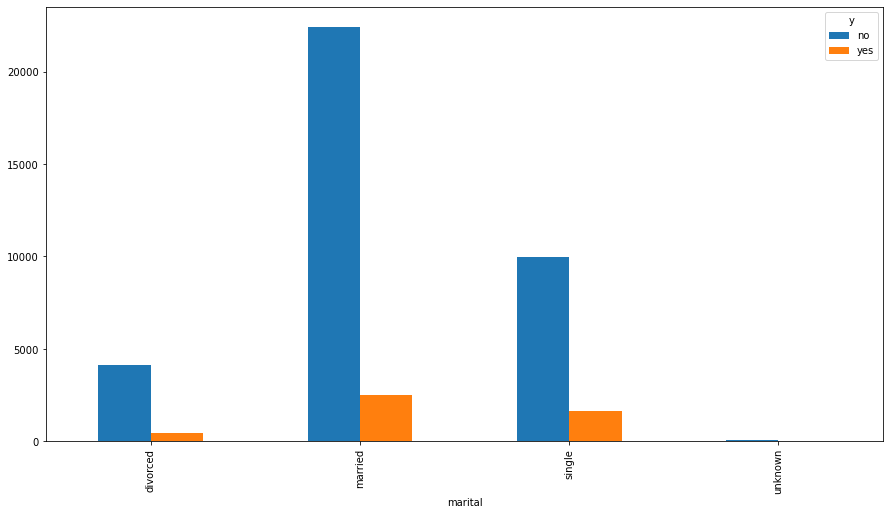

In [54]:
stack = pd.crosstab(index=df['marital'], columns= df['y'])
stack.plot.bar(label='y')
plt.show()

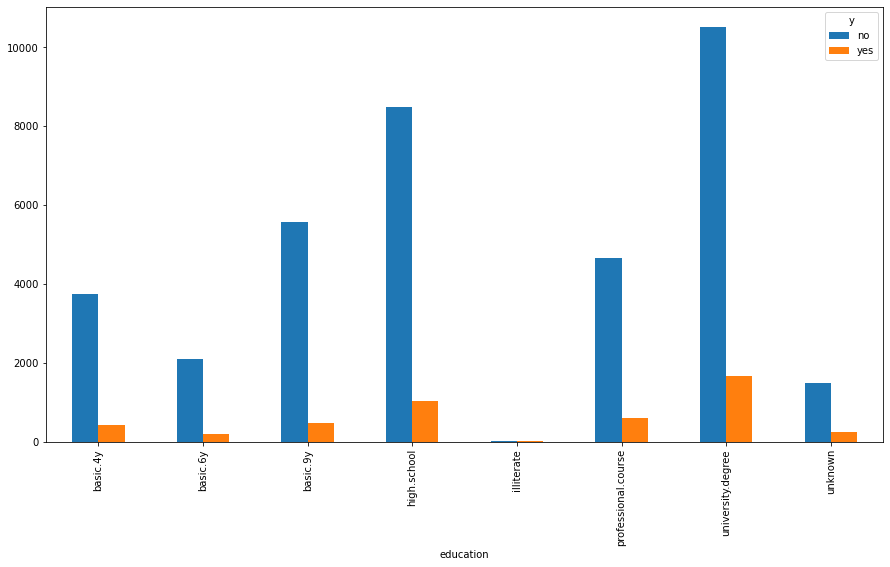

In [55]:
stack = pd.crosstab(index=df['education'], columns= df['y'])
stack.plot.bar(label='y')
plt.show()

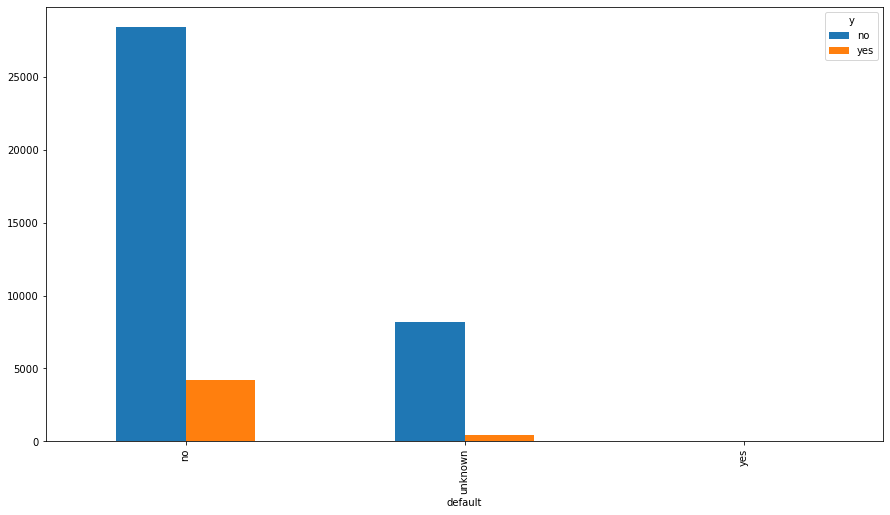

In [56]:
stack = pd.crosstab(index=df['default'], columns= df['y'])
stack.plot.bar( label='y')
plt.show()

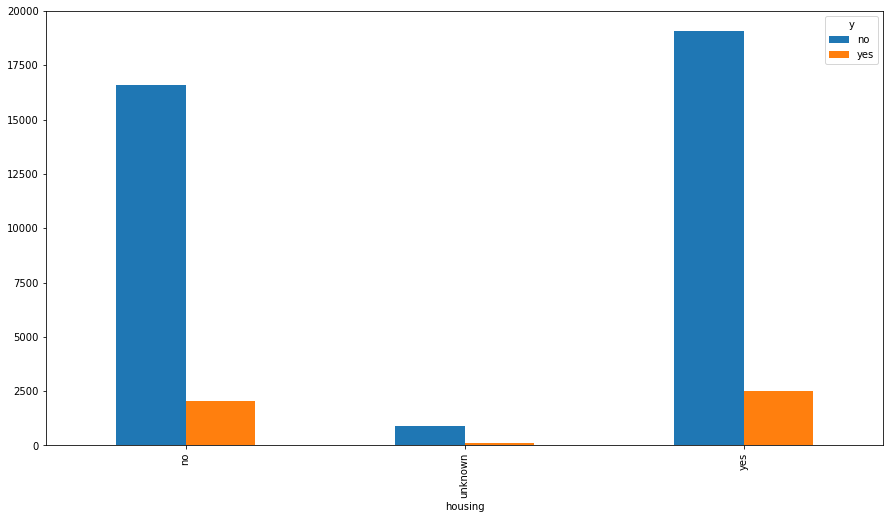

In [57]:
stack = pd.crosstab(index=df['housing'], columns= df['y'])
stack.plot.bar( label='y')
plt.show()

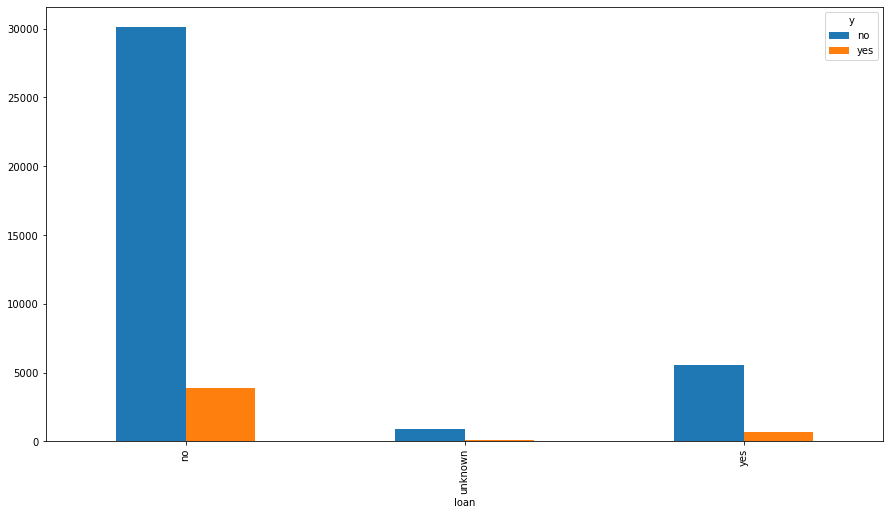

In [58]:
stack = pd.crosstab(index=df['loan'], columns= df['y'])
stack.plot.bar( label='y')
plt.show()

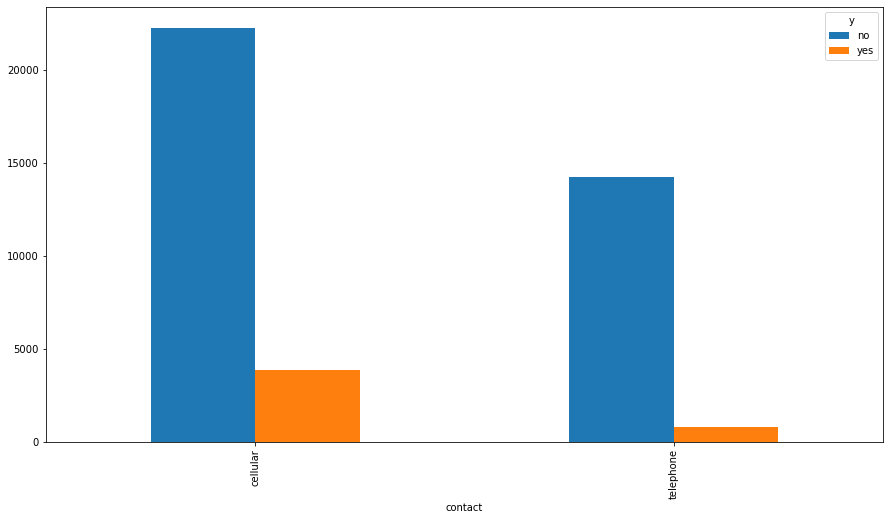

In [59]:
stack = pd.crosstab(index=df['contact'], columns= df['y'])
stack.plot.bar( label='y')
plt.show()

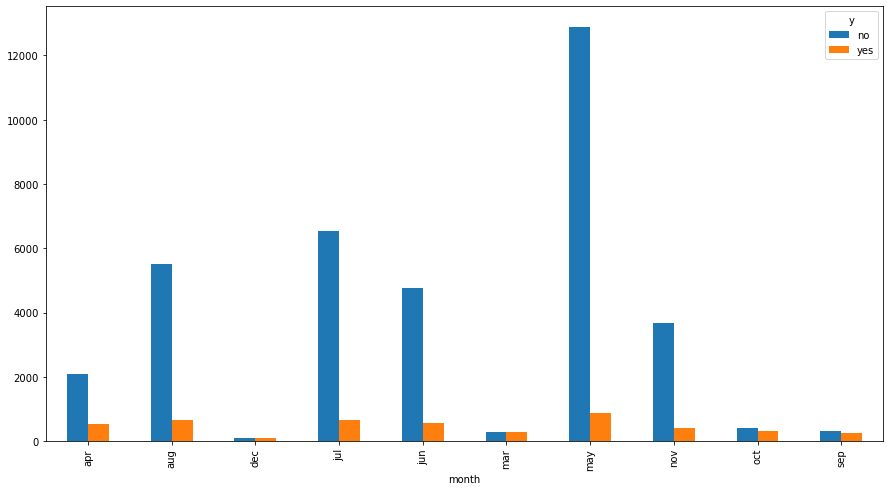

In [60]:
stack = pd.crosstab(index=df['month'], columns= df['y'])
stack.plot.bar(  label='y')
plt.show()

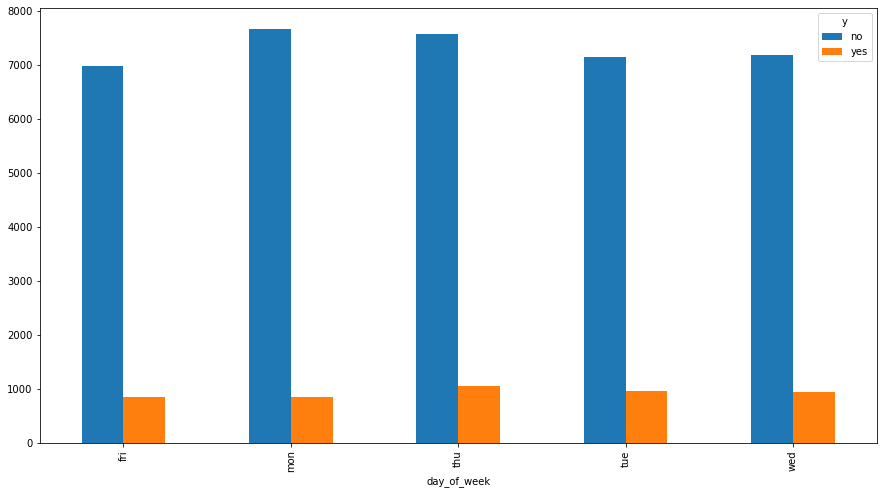

In [61]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['y'])
stack.plot.bar(label='y')
plt.show()

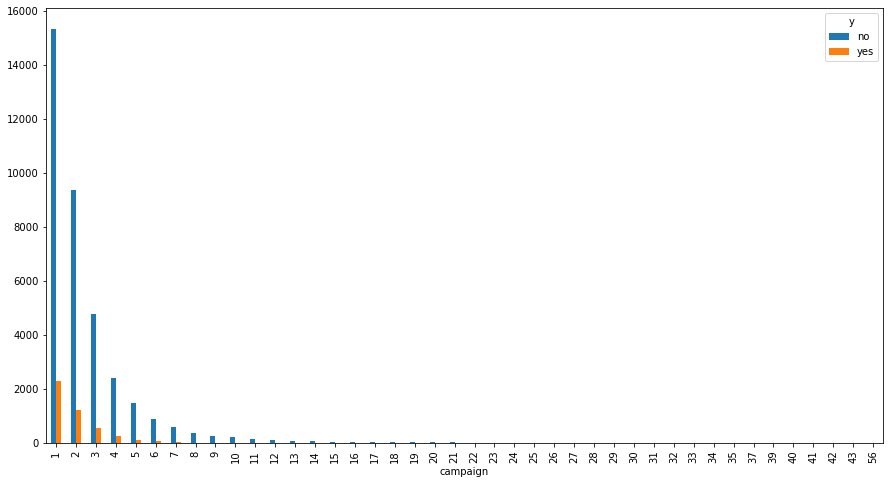

In [62]:
stack = pd.crosstab(index=df['campaign'], columns= df['y'])
stack.plot.bar( label='y')
plt.show()

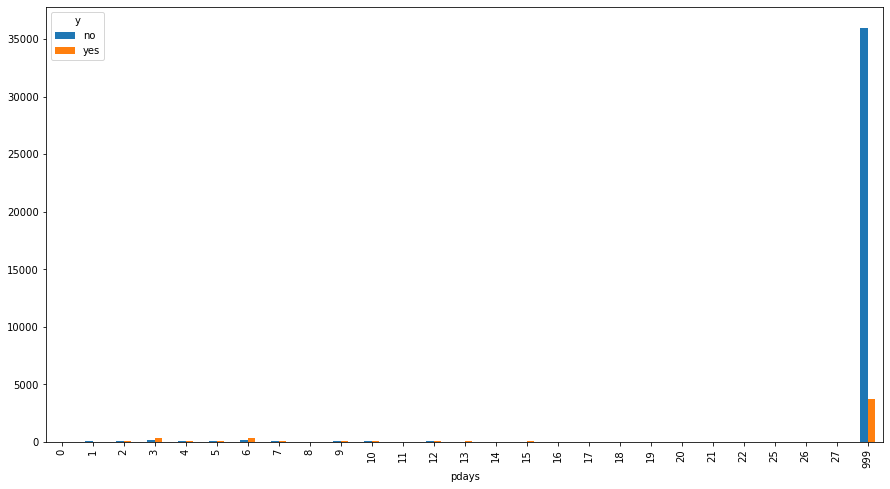

In [63]:
stack = pd.crosstab(index=df['pdays'], columns= df['y'])
stack.plot.bar(  label='y')
plt.show()

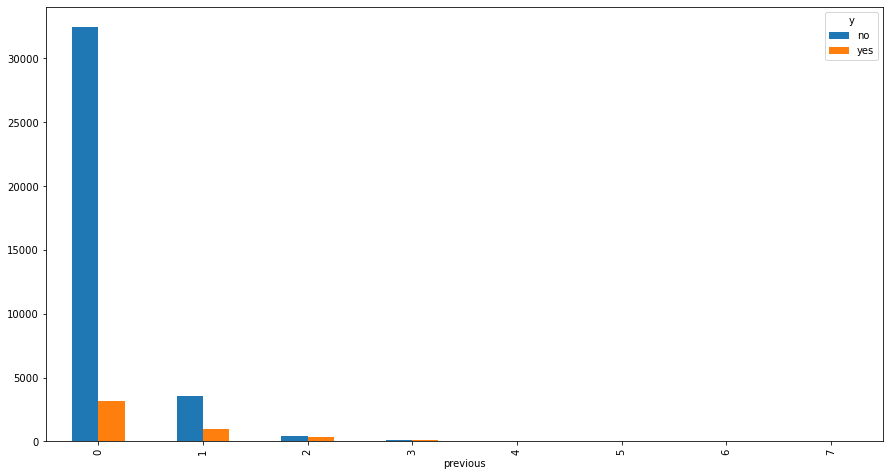

In [64]:
stack = pd.crosstab(index=df['previous'], columns= df['y'])
stack.plot.bar(  label='y')
plt.show()

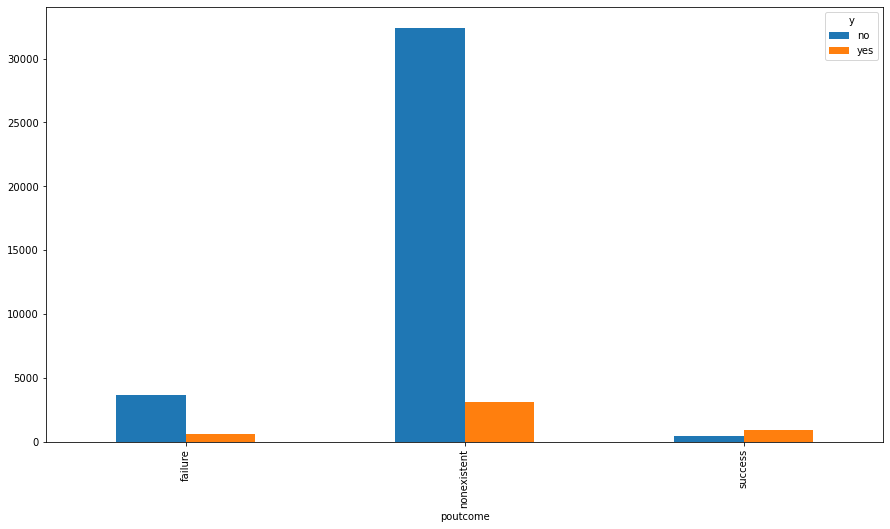

In [65]:
stack = pd.crosstab(index=df['poutcome'], columns= df['y'])
stack.plot.bar( label='y')
plt.show()

### job v/s attribuites

In [66]:
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


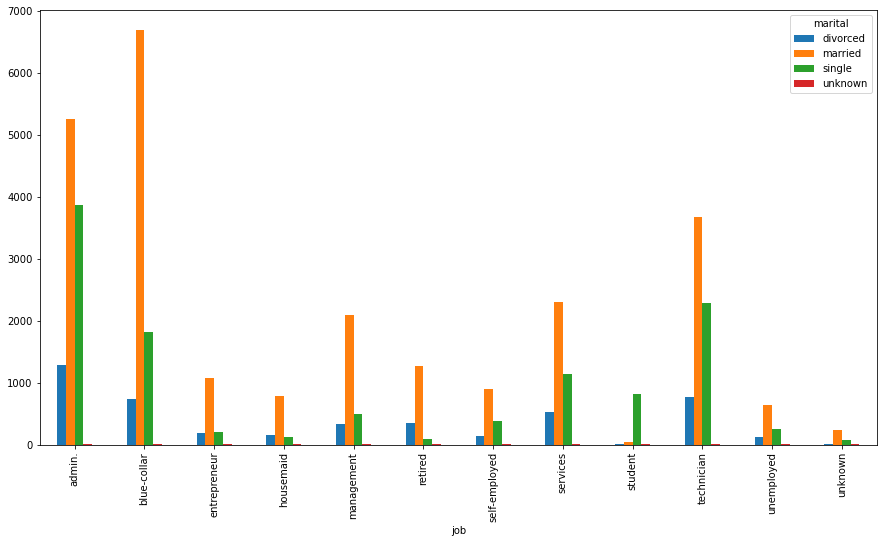

In [67]:
stack = pd.crosstab(index=df['job'], columns= df['marital'])
stack.plot.bar( label='marital')
plt.show()

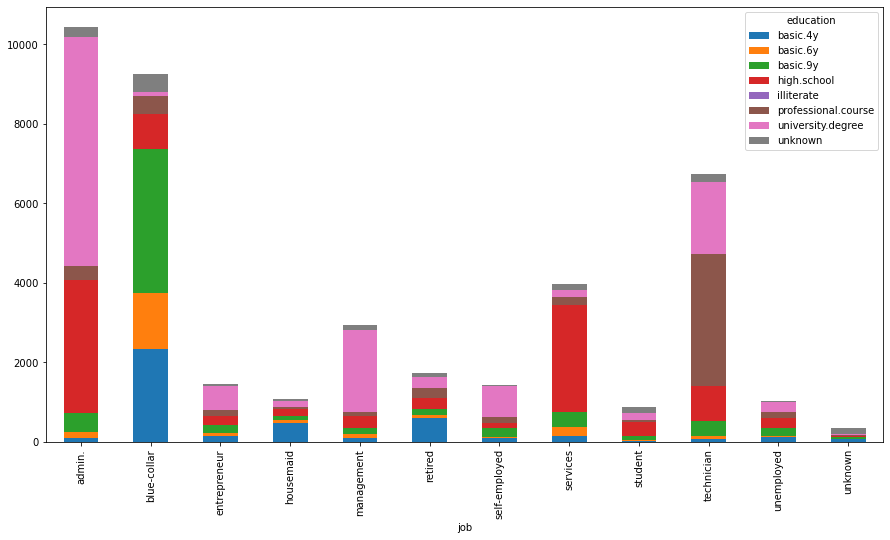

In [68]:
stack = pd.crosstab(index=df['job'], columns= df['education'])
stack.plot.bar( stacked=True, label='education')
plt.show()

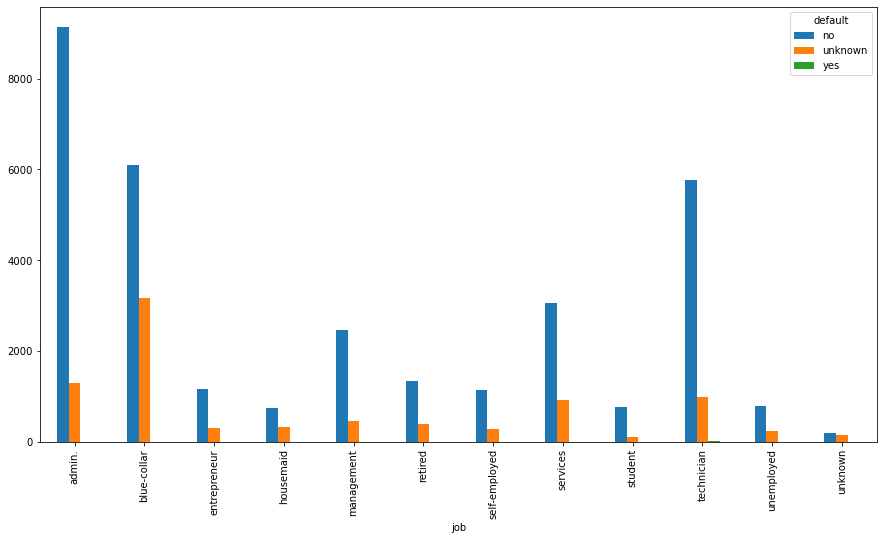

In [69]:
stack = pd.crosstab(index=df['job'], columns= df['default'])
stack.plot.bar(  label='default')
plt.show()

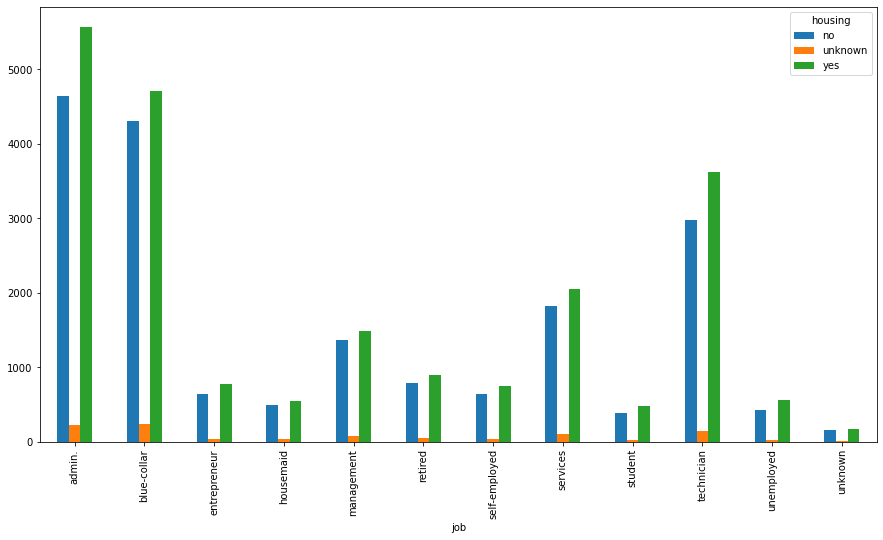

In [70]:
stack = pd.crosstab(index=df['job'], columns= df['housing'])
stack.plot.bar(label='housing')
plt.show()

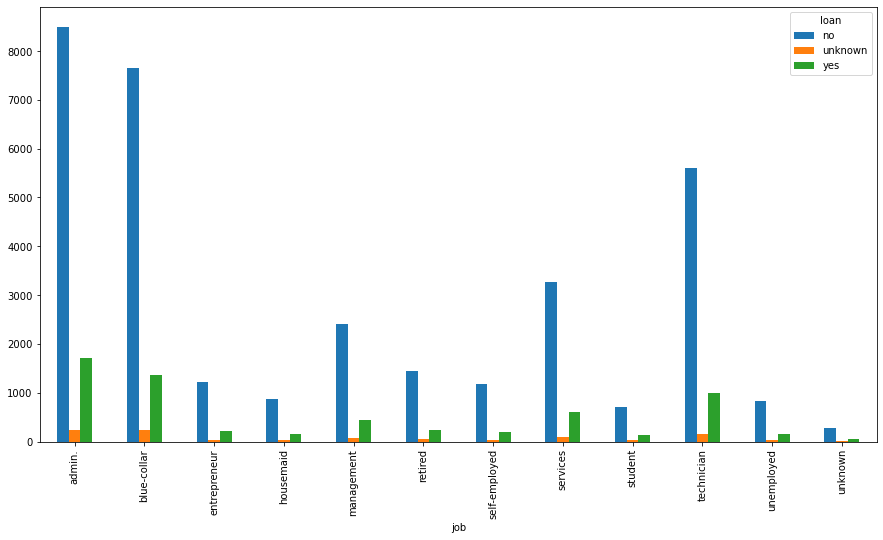

In [71]:
stack = pd.crosstab(index=df['job'], columns= df['loan'])
stack.plot.bar(  label='loan')
plt.show()

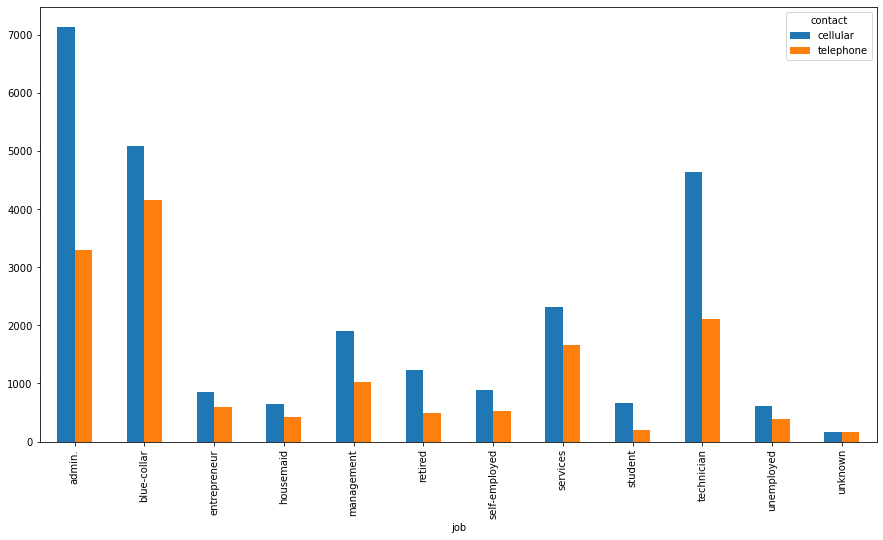

In [72]:
stack = pd.crosstab(index=df['job'], columns= df['contact'])
stack.plot.bar(label='contact')
plt.show()

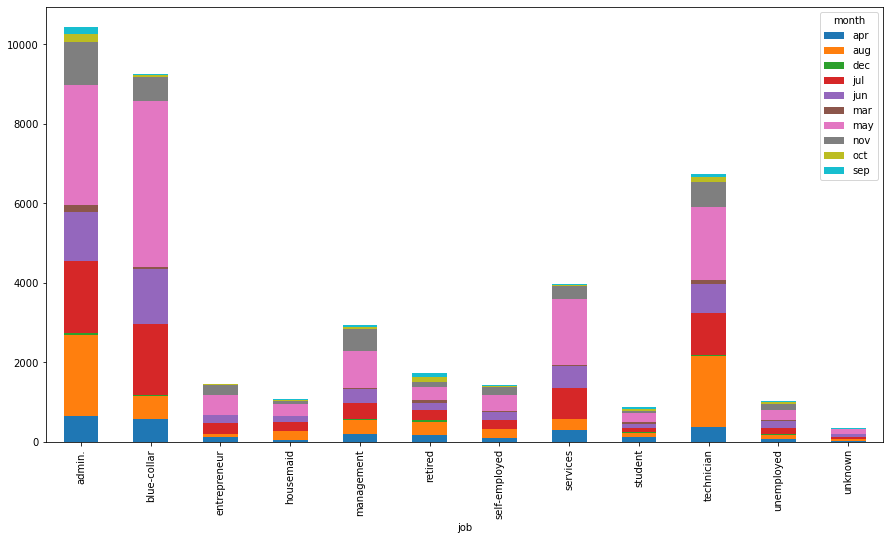

In [73]:
stack = pd.crosstab(index=df['job'], columns= df['month'])
stack.plot.bar( stacked=True, label='month')
plt.show()

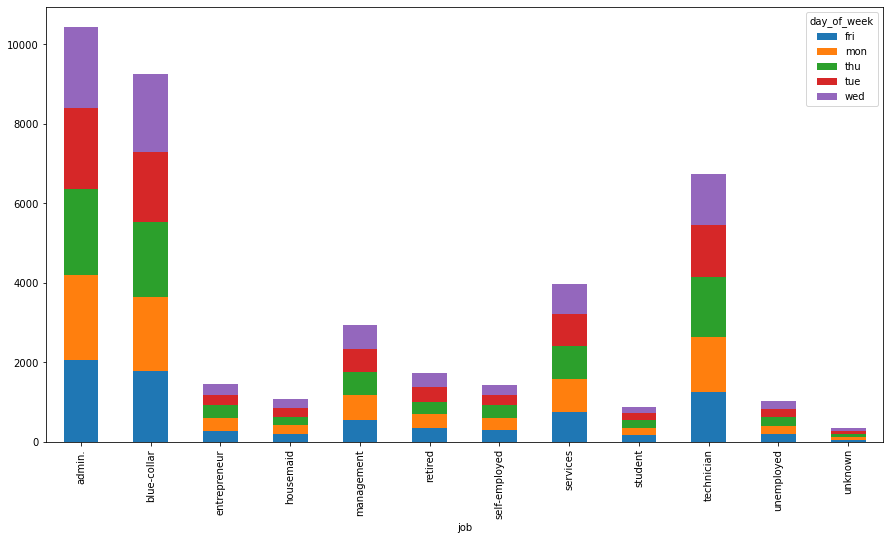

In [74]:
stack = pd.crosstab(index=df['job'], columns= df['day_of_week'])
stack.plot.bar( stacked=True, label='day_of_week')
plt.show()

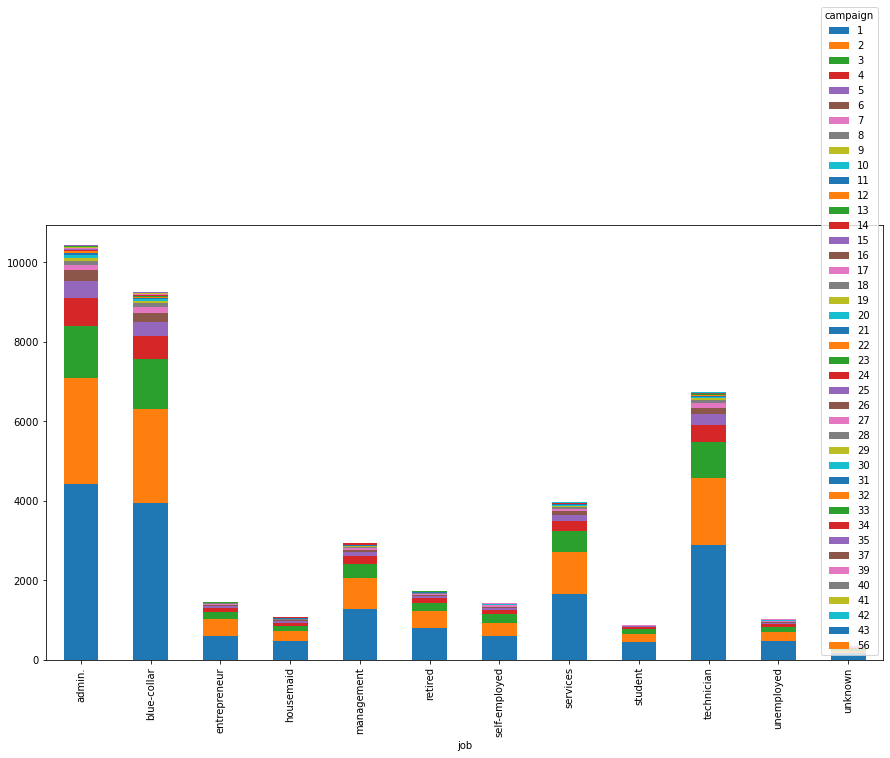

In [75]:
stack = pd.crosstab(index=df['job'], columns= df['campaign'])
stack.plot.bar( stacked=True, label='campaign')
plt.show()

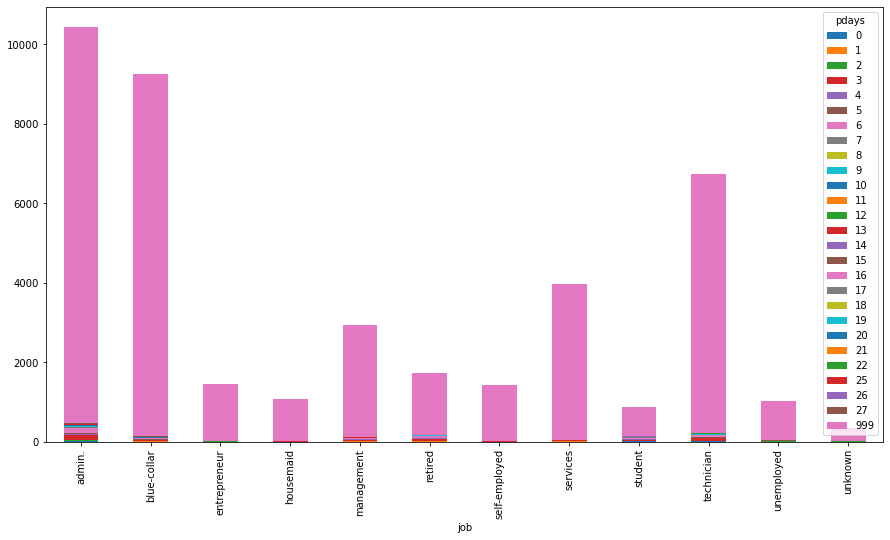

In [76]:
stack = pd.crosstab(index=df['job'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

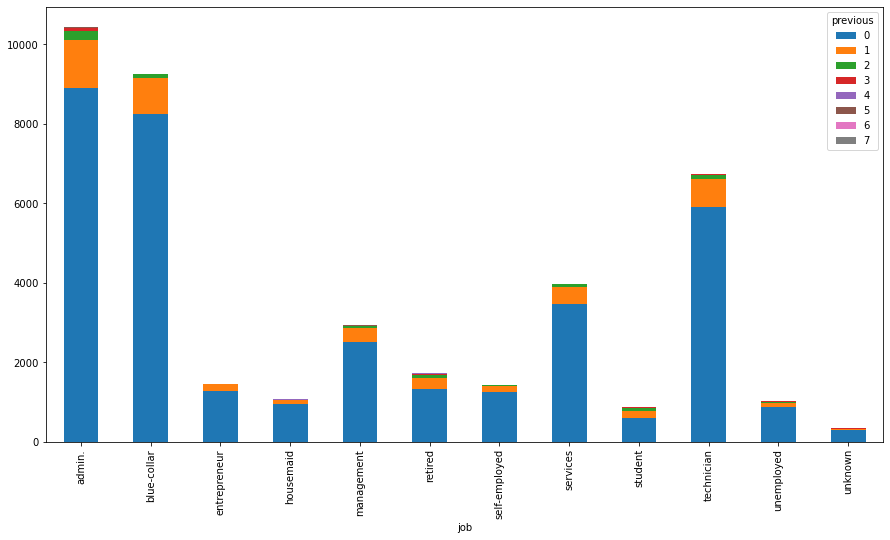

In [77]:
stack = pd.crosstab(index=df['job'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

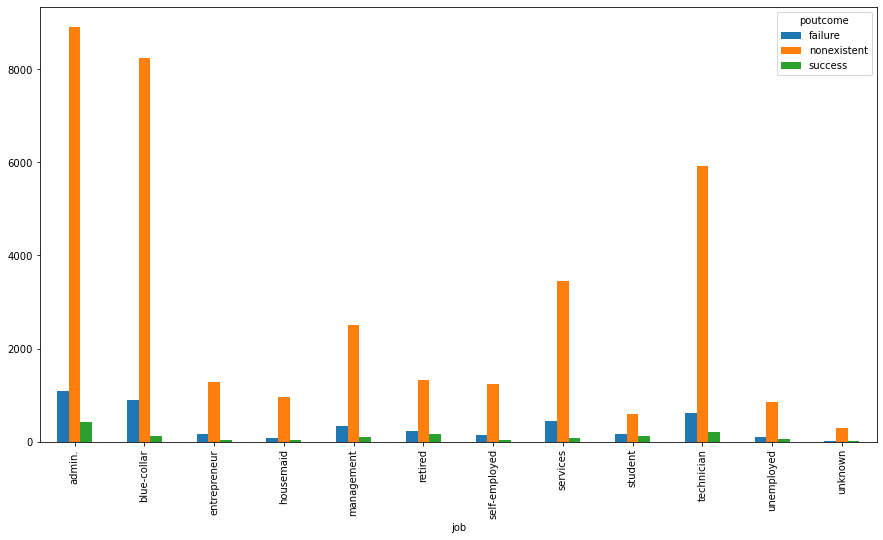

In [78]:
stack = pd.crosstab(index=df['job'], columns= df['poutcome'])
stack.plot.bar( label='poutcome')
plt.show()

### Month v/s attribuites

In [79]:
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


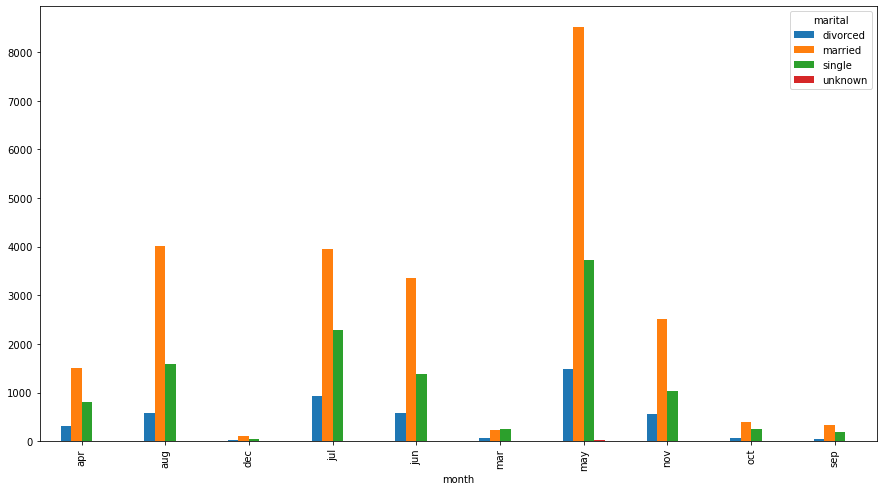

In [80]:
stack = pd.crosstab(index=df['month'], columns= df['marital'])
stack.plot.bar(label='marital')
plt.show()

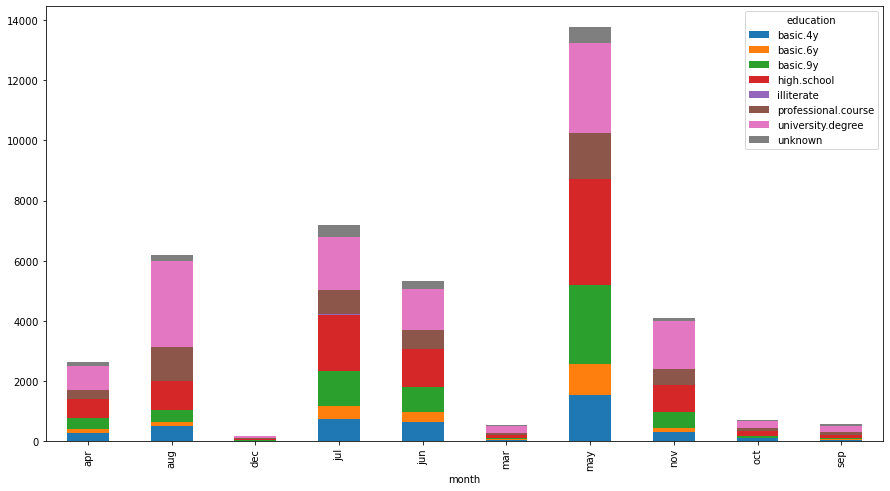

In [81]:
stack = pd.crosstab(index=df['month'], columns= df['education'])
stack.plot.bar( stacked=True, label='education')
plt.show()

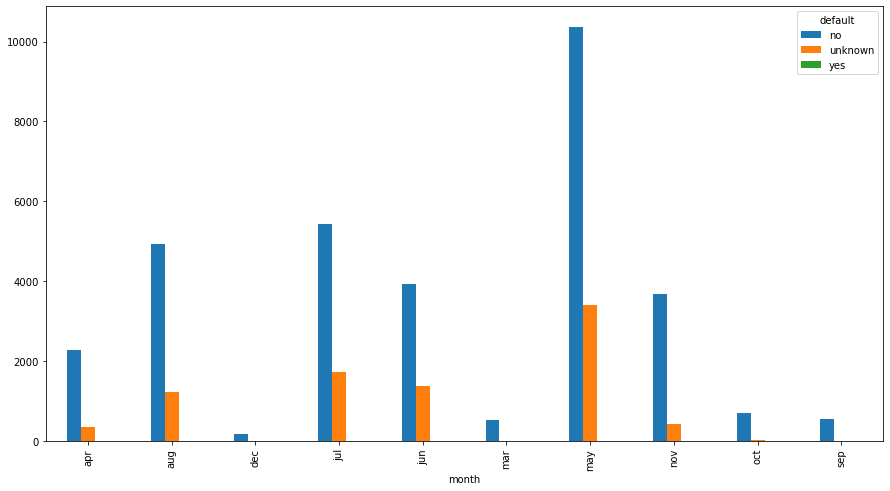

In [82]:
stack = pd.crosstab(index=df['month'], columns= df['default'])
stack.plot.bar( label='default')
plt.show()

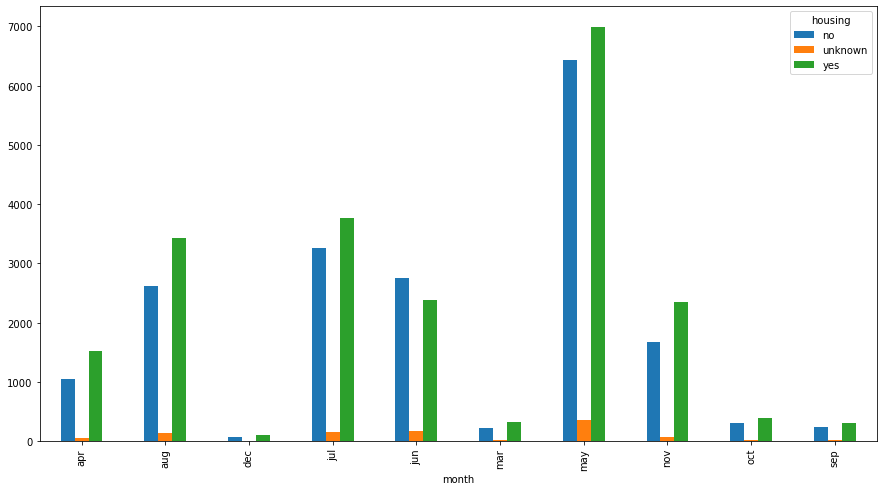

In [83]:
stack = pd.crosstab(index=df['month'], columns= df['housing'])
stack.plot.bar( label='housing')
plt.show()

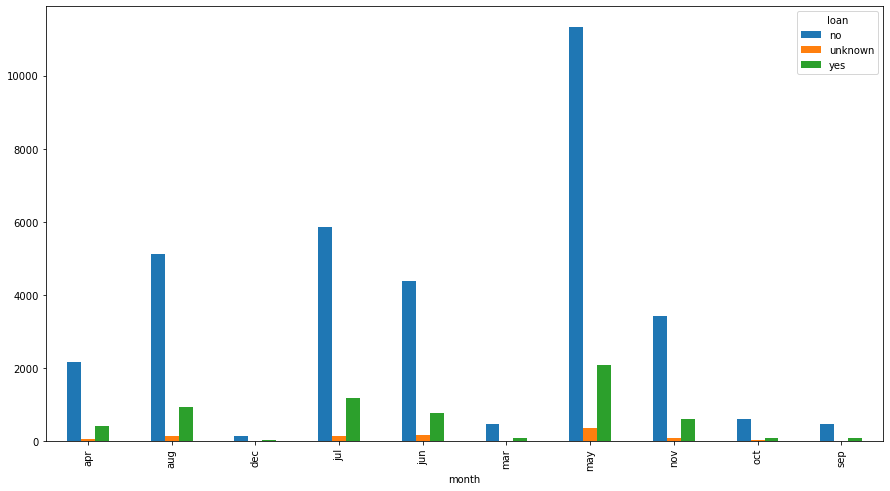

In [84]:
stack = pd.crosstab(index=df['month'], columns= df['loan'])
stack.plot.bar(label='loan')
plt.show()

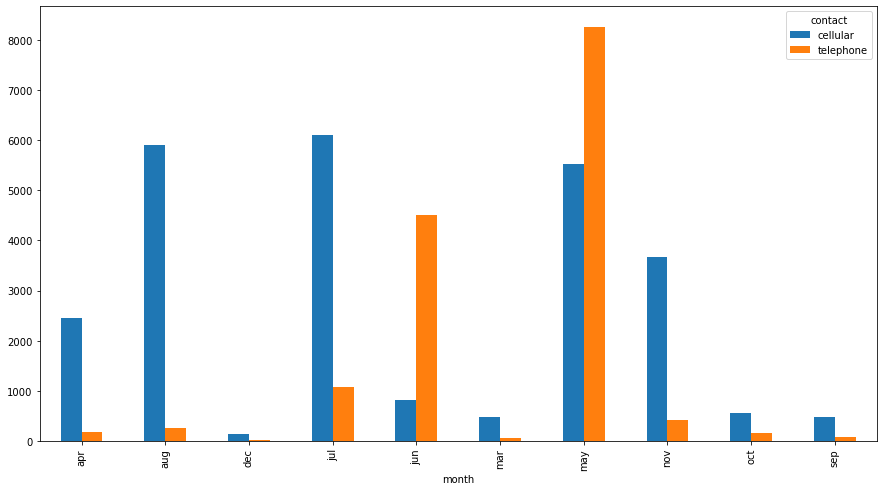

In [85]:
stack = pd.crosstab(index=df['month'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

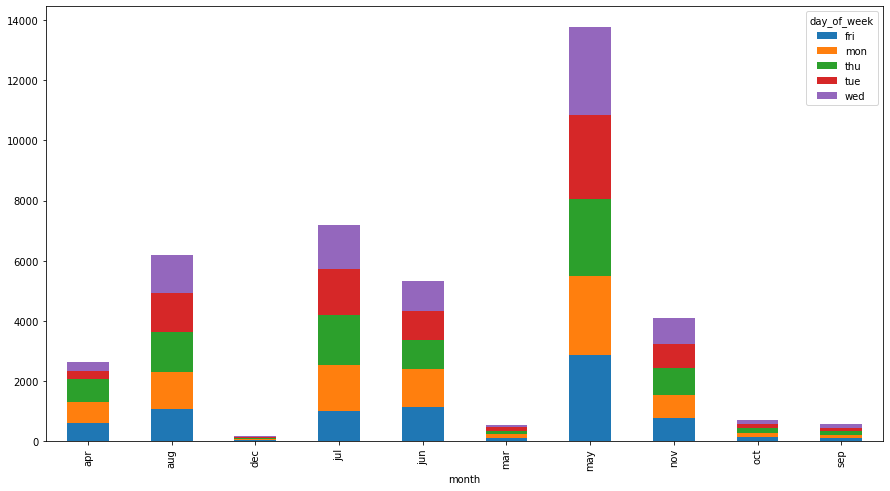

In [86]:
stack = pd.crosstab(index=df['month'], columns= df['day_of_week'])
stack.plot.bar( stacked=True, label='day_of_week')
plt.show()

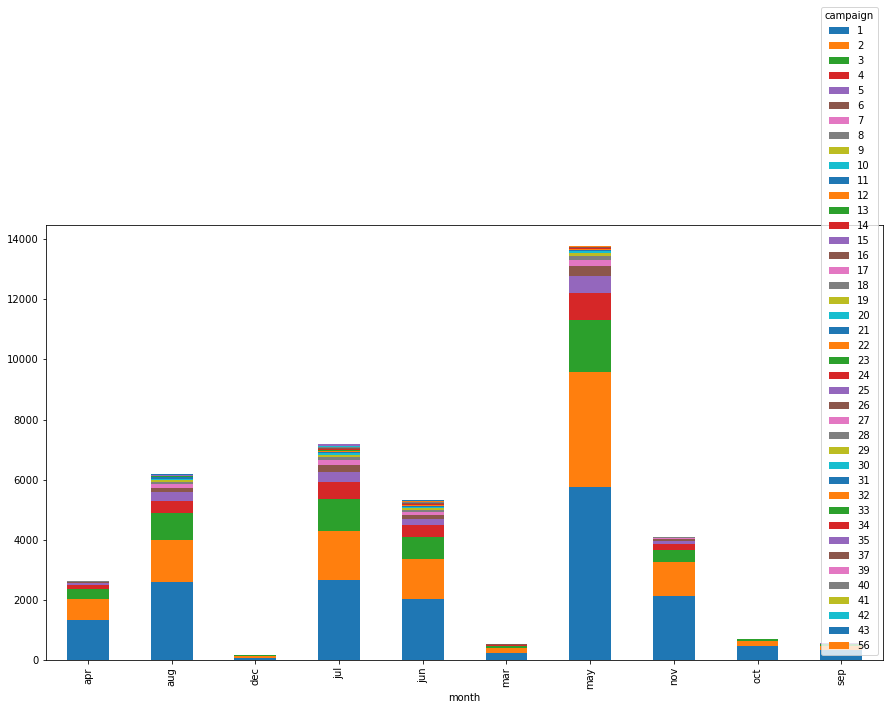

In [87]:
stack = pd.crosstab(index=df['month'], columns= df['campaign'])
stack.plot.bar( stacked=True, label='campaign')
plt.show()

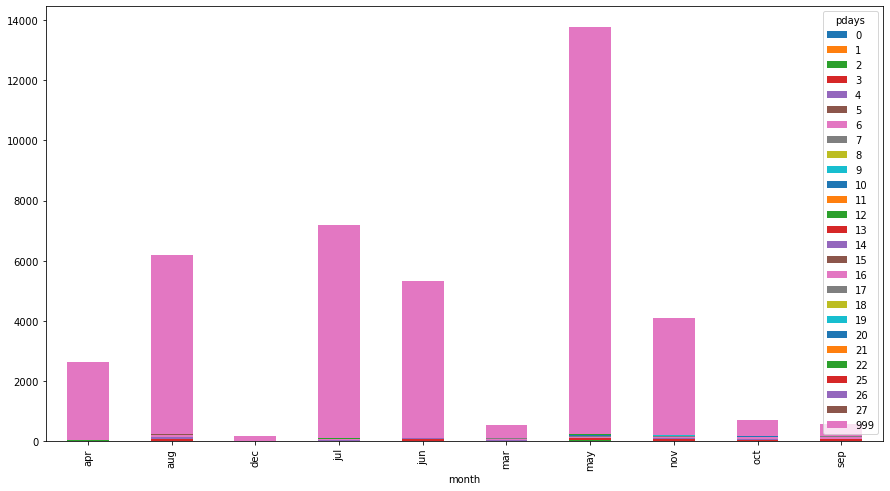

In [88]:
stack = pd.crosstab(index=df['month'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

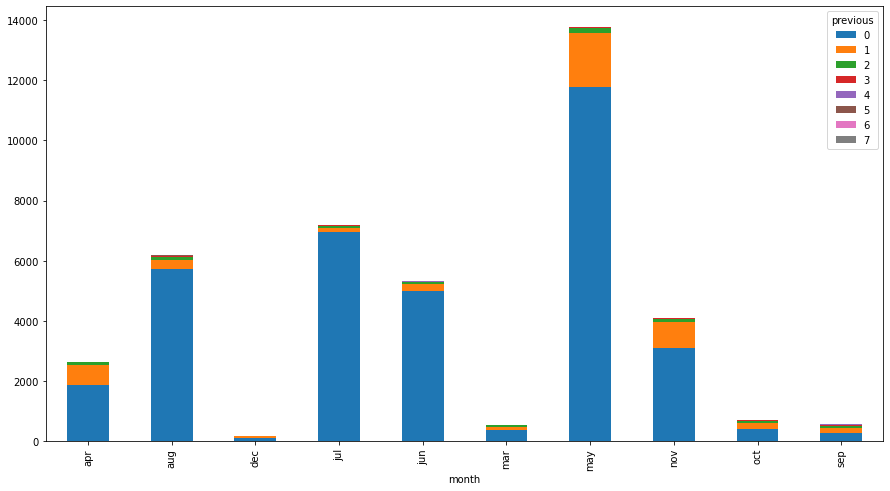

In [89]:
stack = pd.crosstab(index=df['month'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

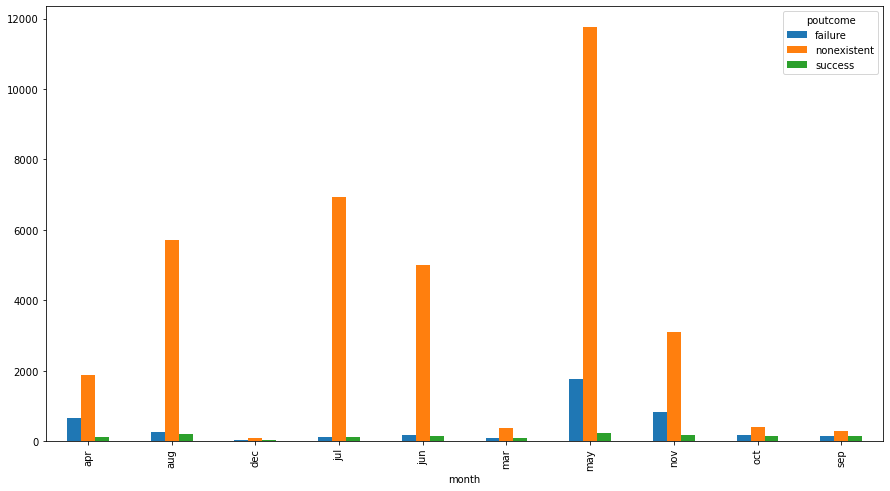

In [90]:
stack = pd.crosstab(index=df['month'], columns= df['poutcome'])
stack.plot.bar(label='poutcome')
plt.show()

### Education v/s attribuites

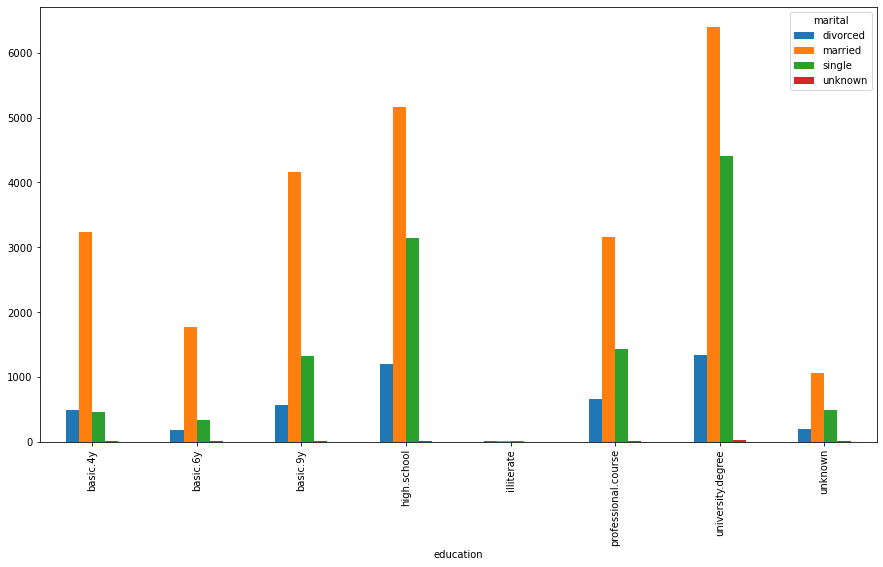

In [91]:
stack = pd.crosstab(index=df['education'], columns= df['marital'])
stack.plot.bar( label='marital')
plt.show()

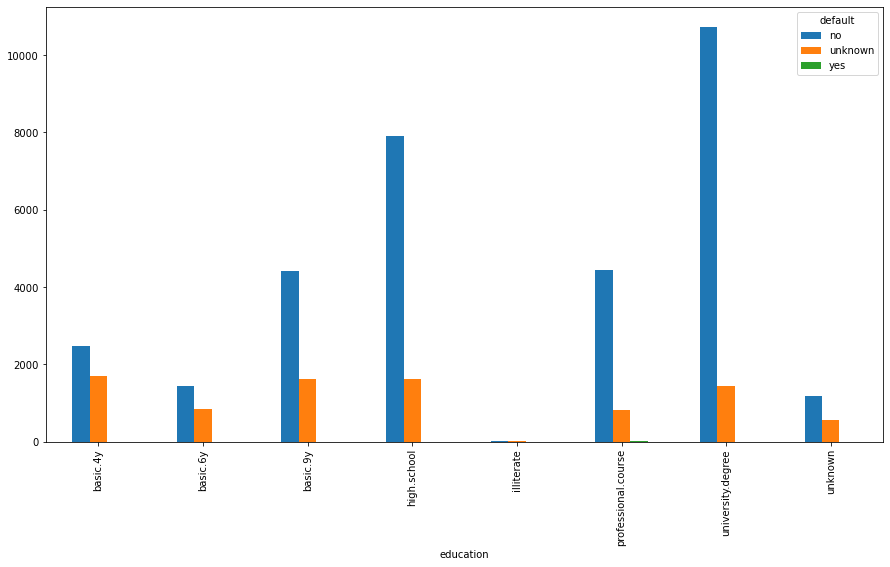

In [92]:
stack = pd.crosstab(index=df['education'], columns= df['default'])
stack.plot.bar( label='default')
plt.show()

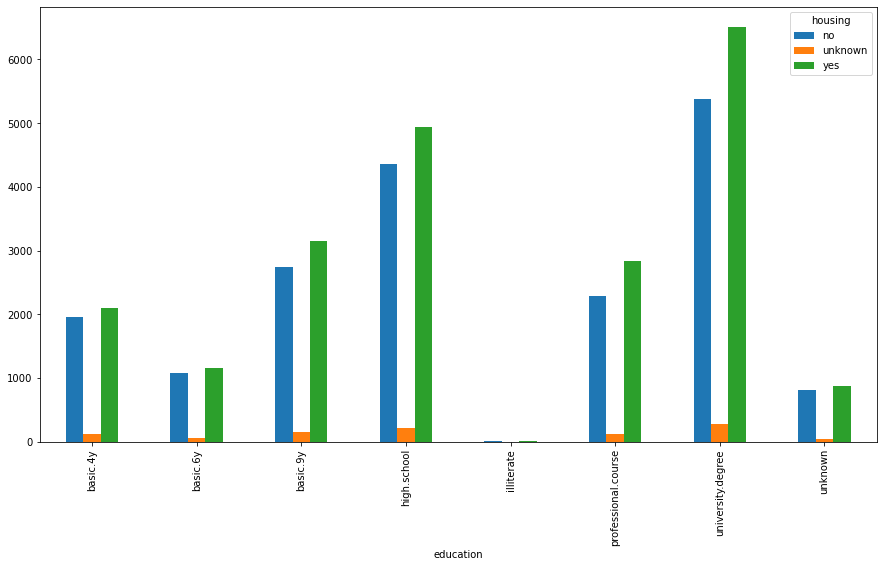

In [93]:
stack = pd.crosstab(index=df['education'], columns= df['housing'])
stack.plot.bar( label='housing')
plt.show()

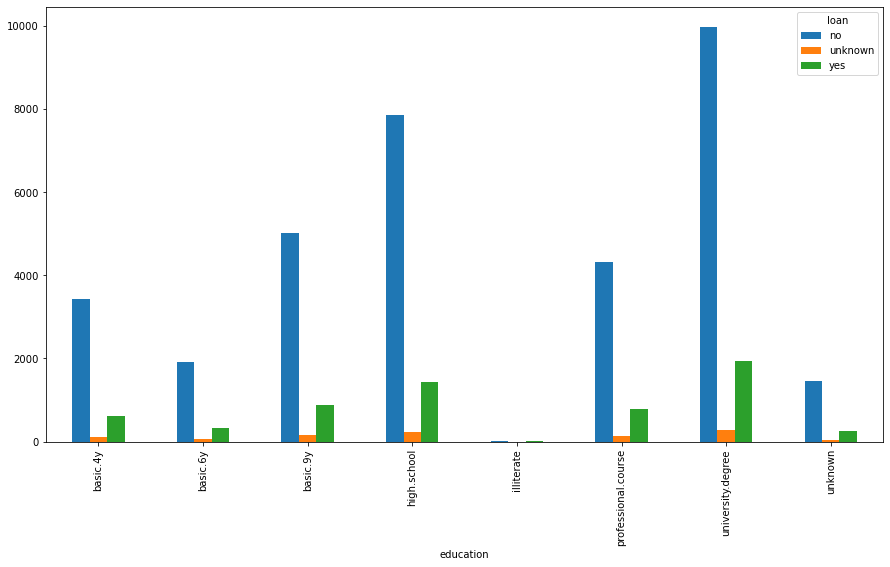

In [94]:
stack = pd.crosstab(index=df['education'], columns= df['loan'])
stack.plot.bar(label='loan')
plt.show()

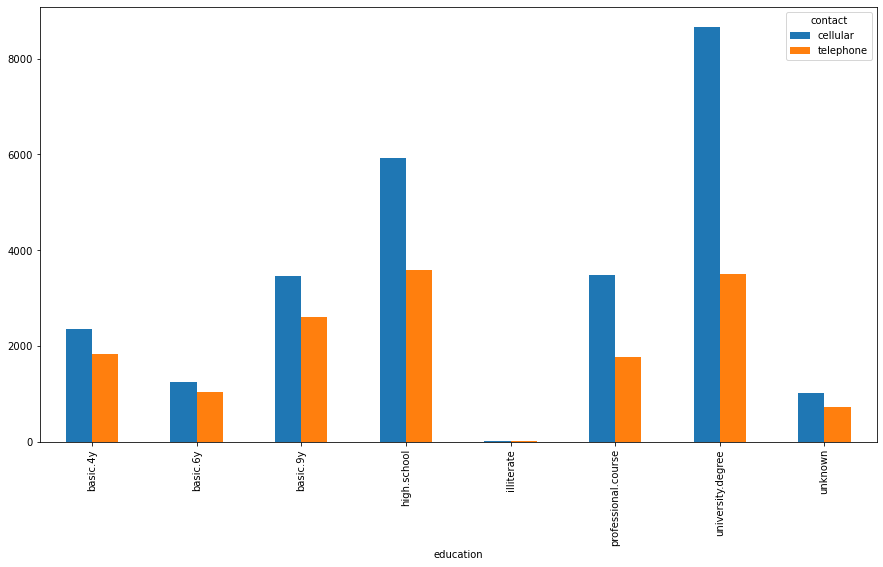

In [95]:
stack = pd.crosstab(index=df['education'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

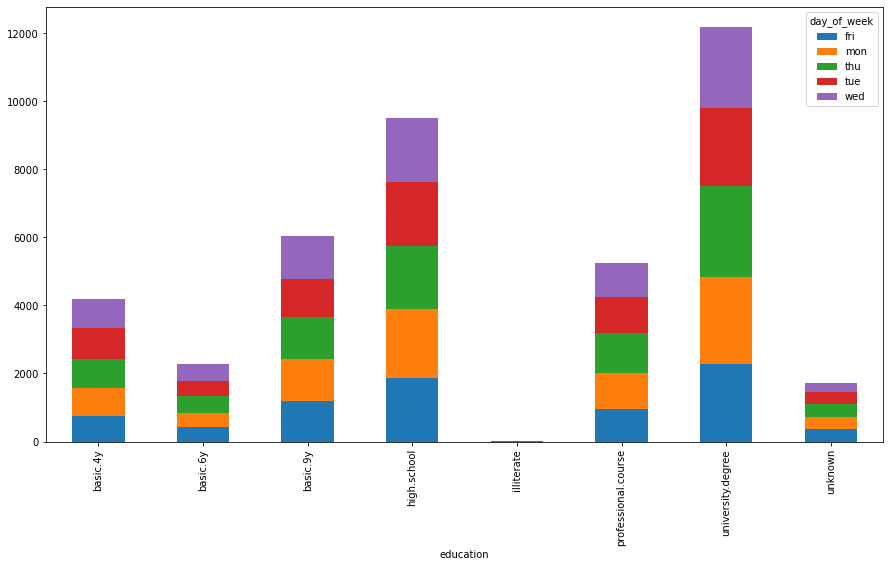

In [96]:
stack = pd.crosstab(index=df['education'], columns= df['day_of_week'])
stack.plot.bar( stacked=True, label='day_of_week')
plt.show()

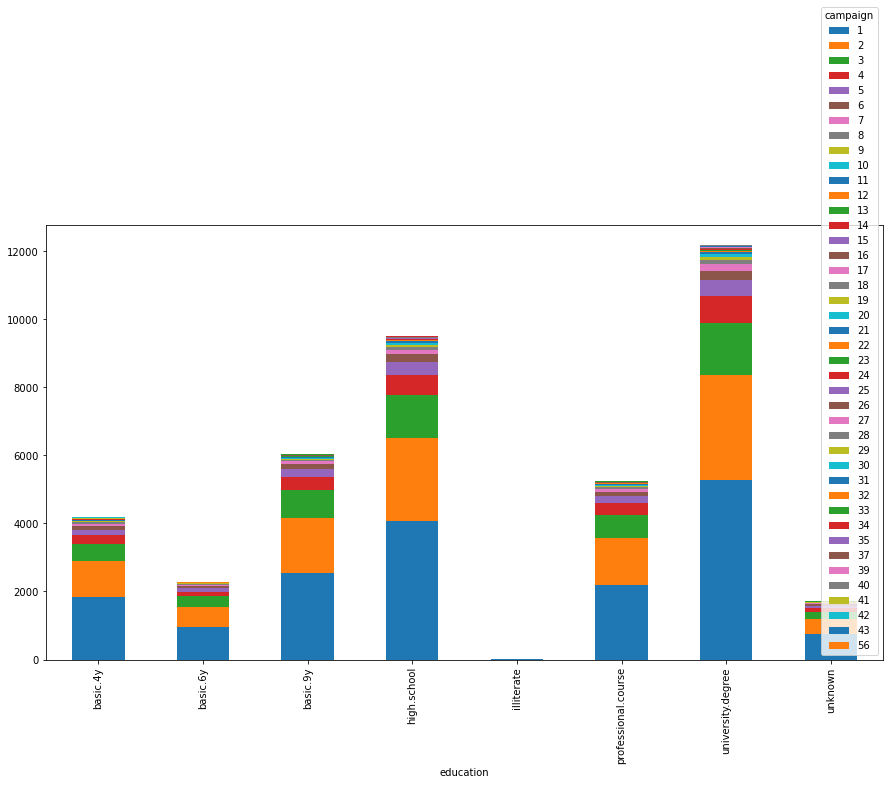

In [97]:
stack = pd.crosstab(index=df['education'], columns= df['campaign'])
stack.plot.bar( stacked=True, label='campaign')
plt.show()

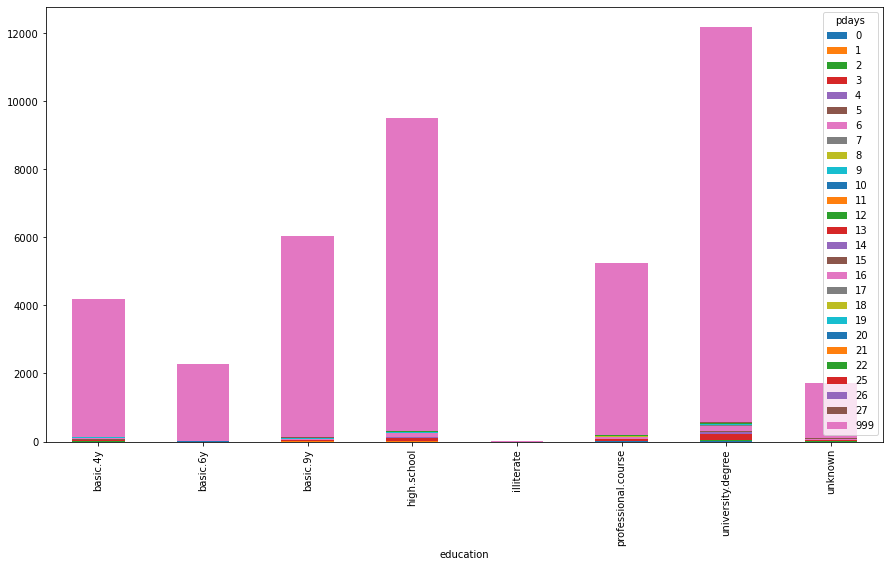

In [98]:
stack = pd.crosstab(index=df['education'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

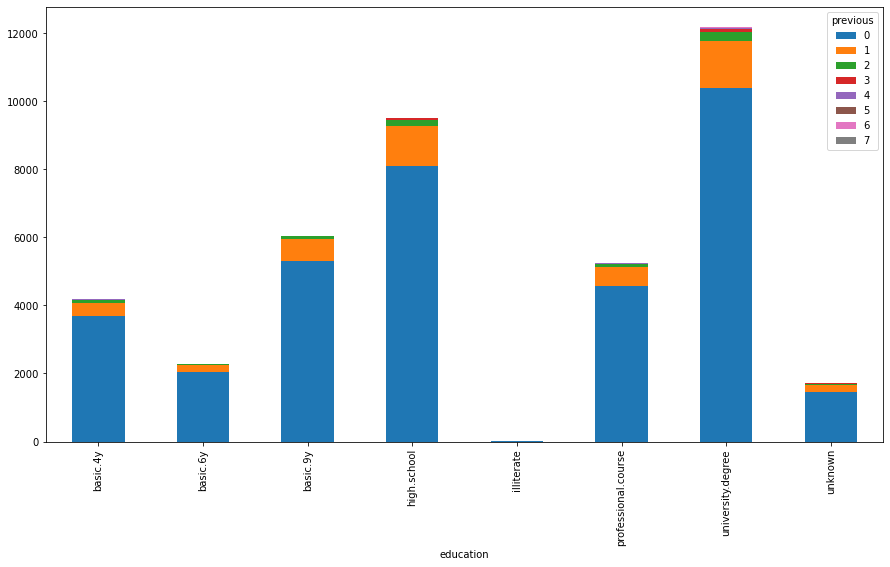

In [99]:
stack = pd.crosstab(index=df['education'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

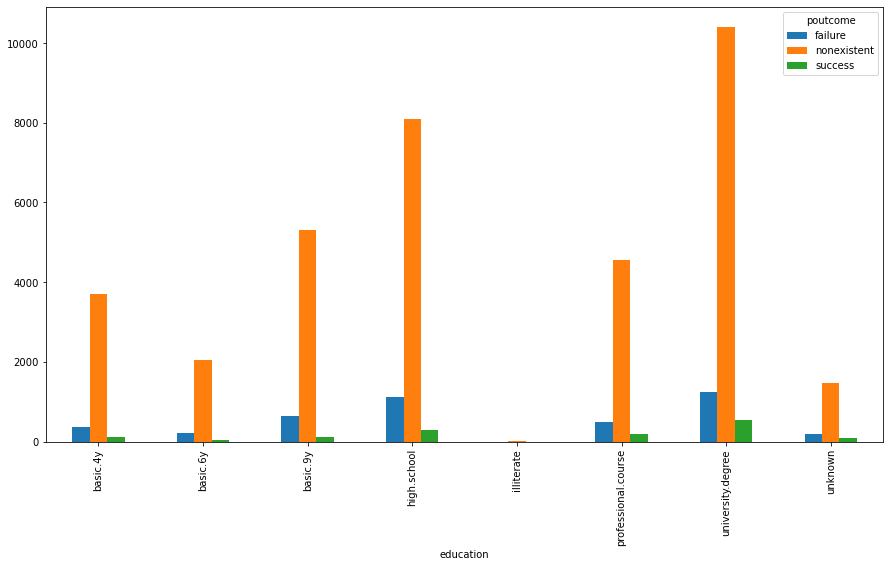

In [100]:
stack = pd.crosstab(index=df['education'], columns= df['poutcome'])
stack.plot.bar( label='poutcome')
plt.show()

### day_of week v/s attributes

In [101]:
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


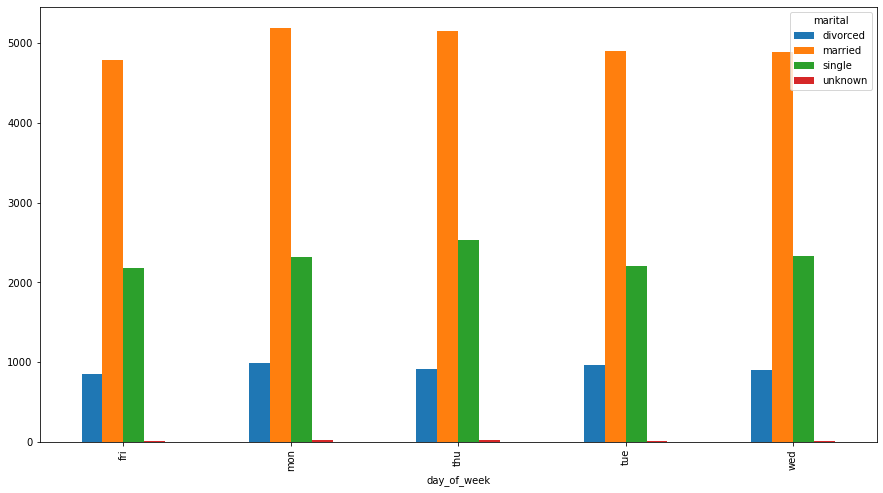

In [102]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['marital'])
stack.plot.bar( label='marital')
plt.show()

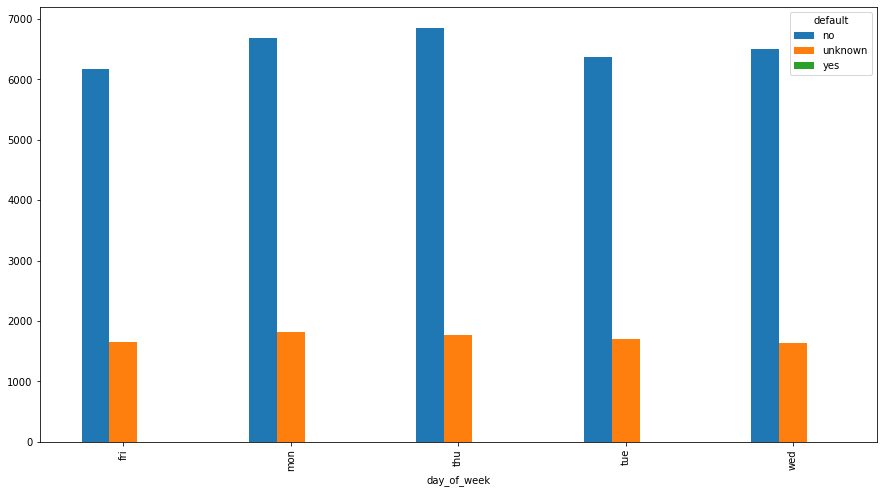

In [103]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['default'])
stack.plot.bar( label='housing')
plt.show()

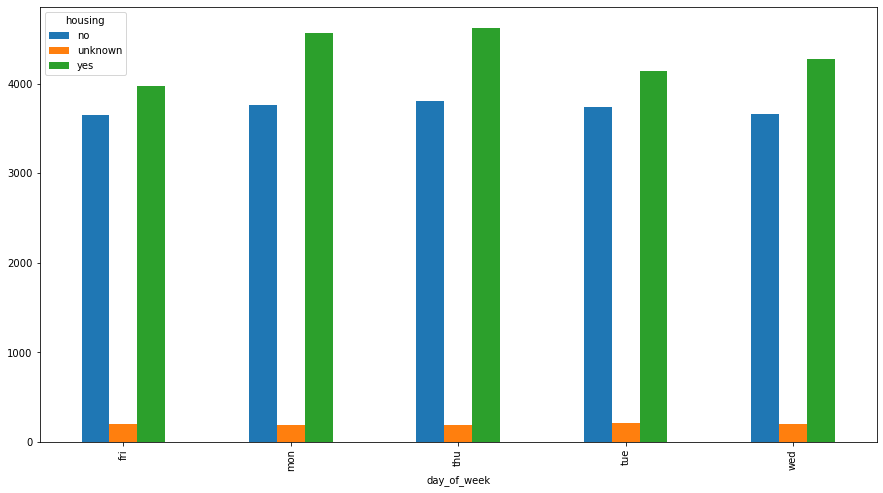

In [104]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['housing'])
stack.plot.bar( label='housing')
plt.show()

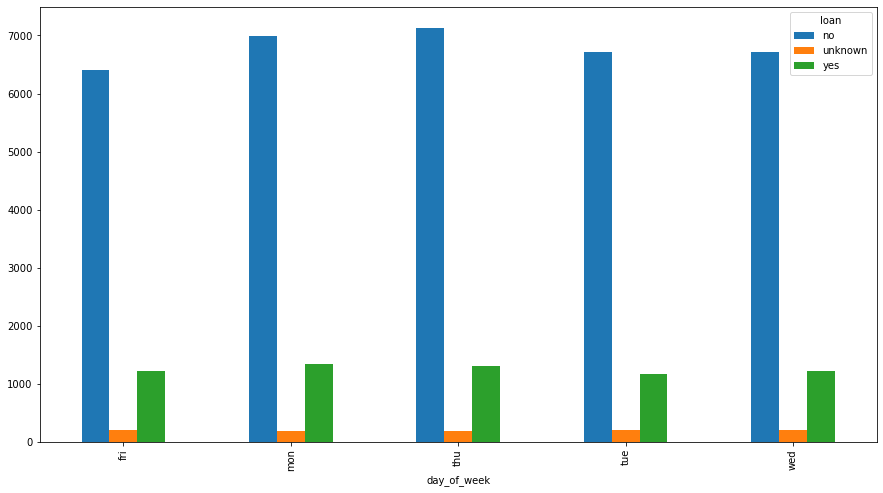

In [105]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['loan'])
stack.plot.bar( label='loan')
plt.show()

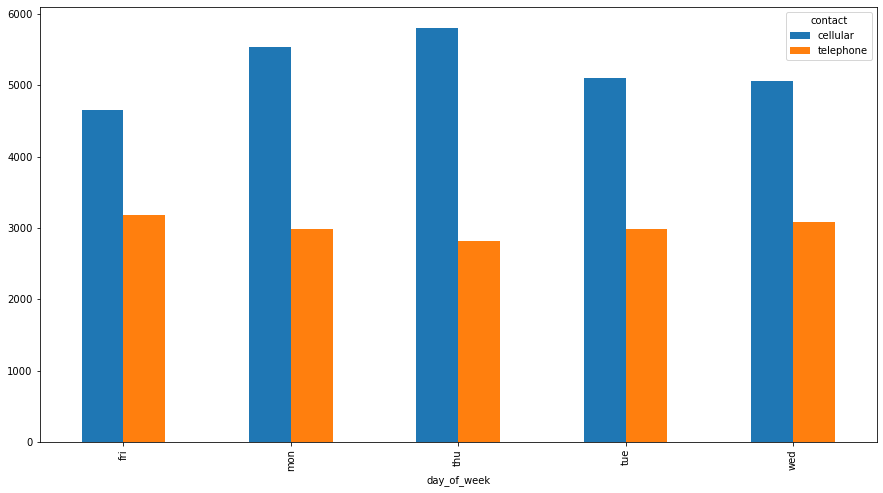

In [106]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

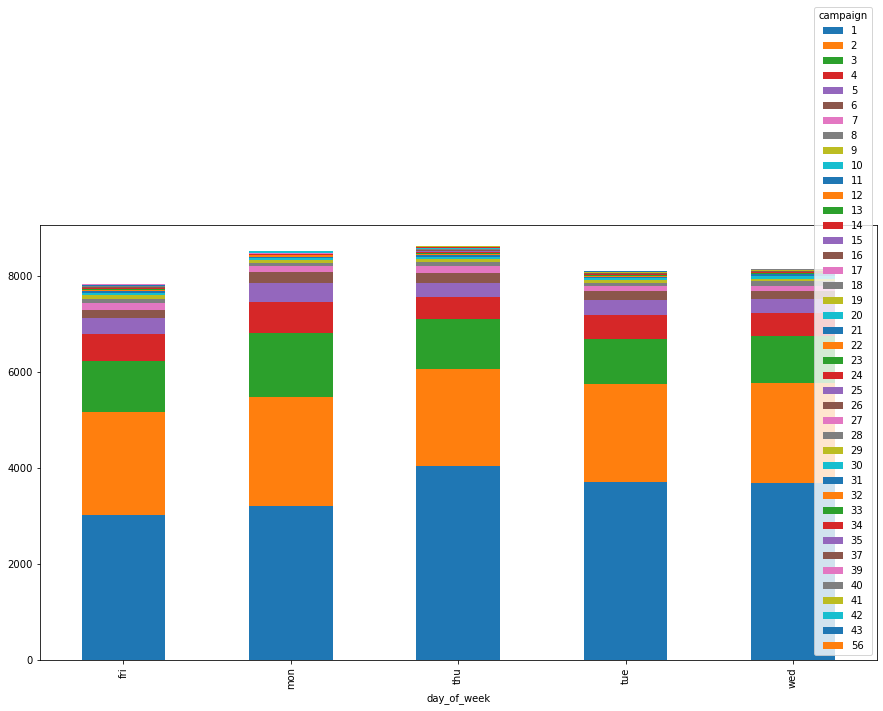

In [107]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['campaign'])
stack.plot.bar( stacked=True, label='campaign')
plt.show()

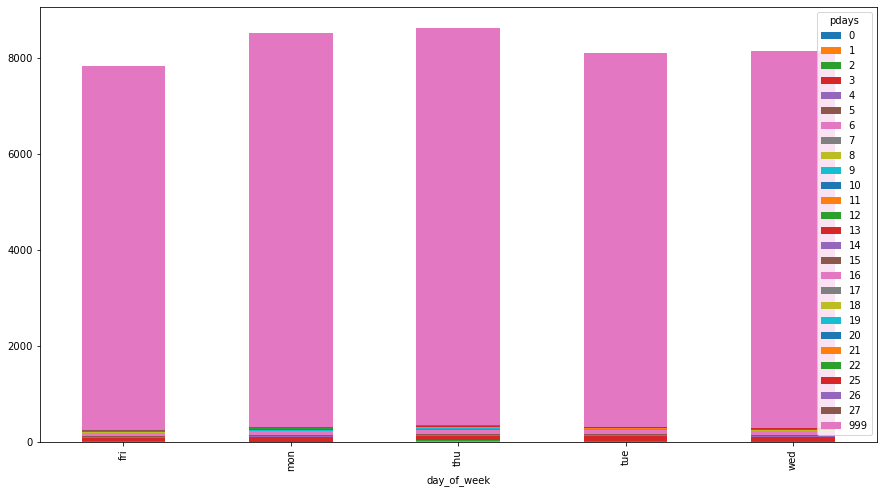

In [108]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

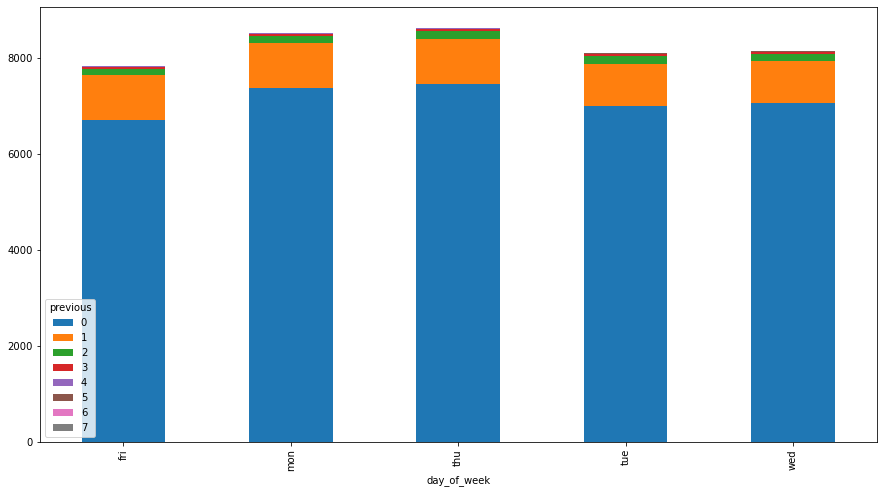

In [109]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

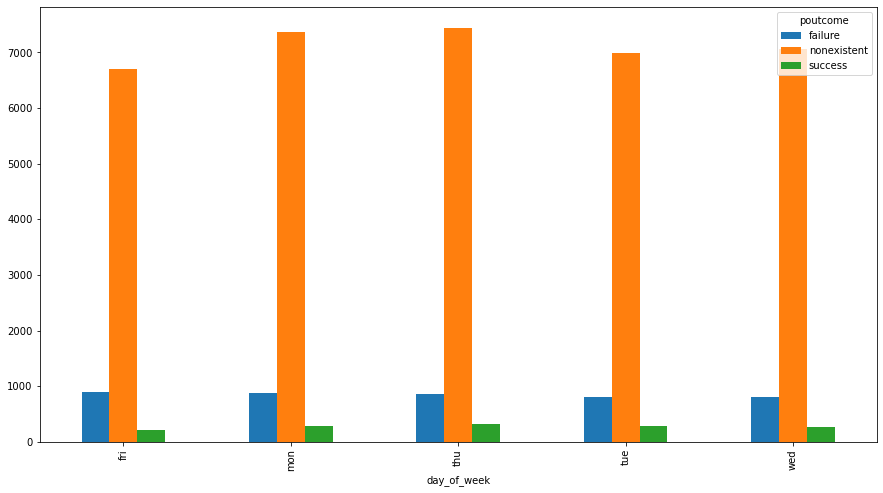

In [110]:
stack = pd.crosstab(index=df['day_of_week'], columns= df['poutcome'])
stack.plot.bar(  label='poutcome')
plt.show()

### campaign v/s attribuites

In [111]:
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


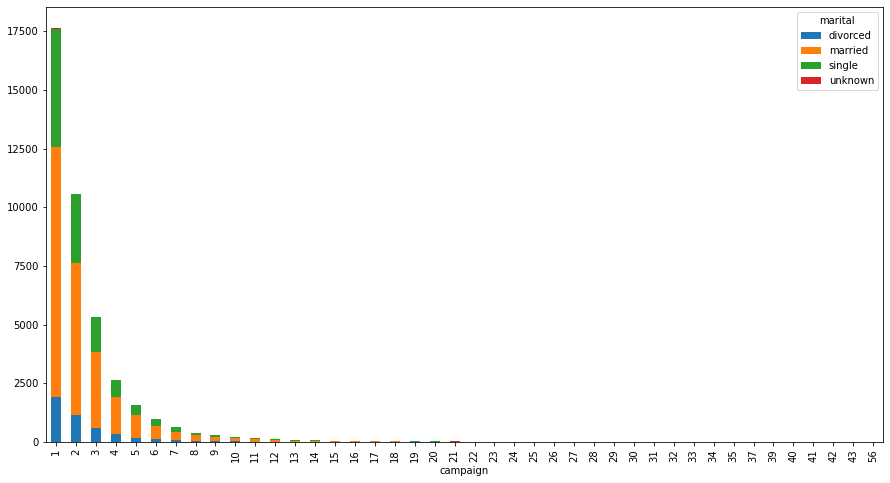

In [112]:
stack = pd.crosstab(index=df['campaign'], columns= df['marital'])
stack.plot.bar( stacked=True, label='loan')
plt.show()

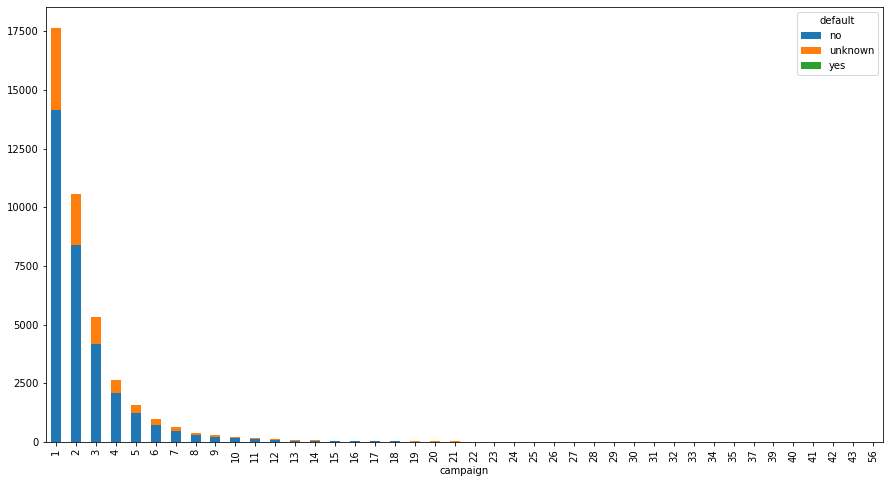

In [113]:
stack = pd.crosstab(index=df['campaign'], columns= df['default'])
stack.plot.bar( stacked=True, label='default')
plt.show()

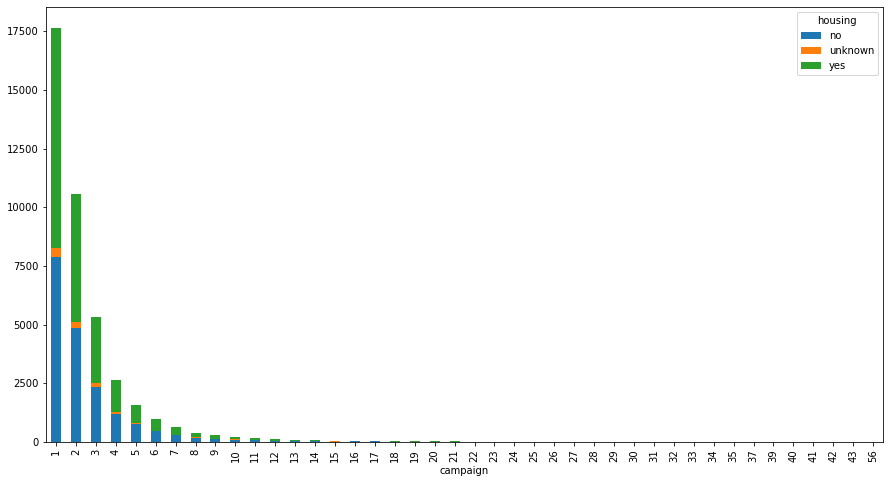

In [114]:
stack = pd.crosstab(index=df['campaign'], columns= df['housing'])
stack.plot.bar( stacked=True, label='housing')
plt.show()

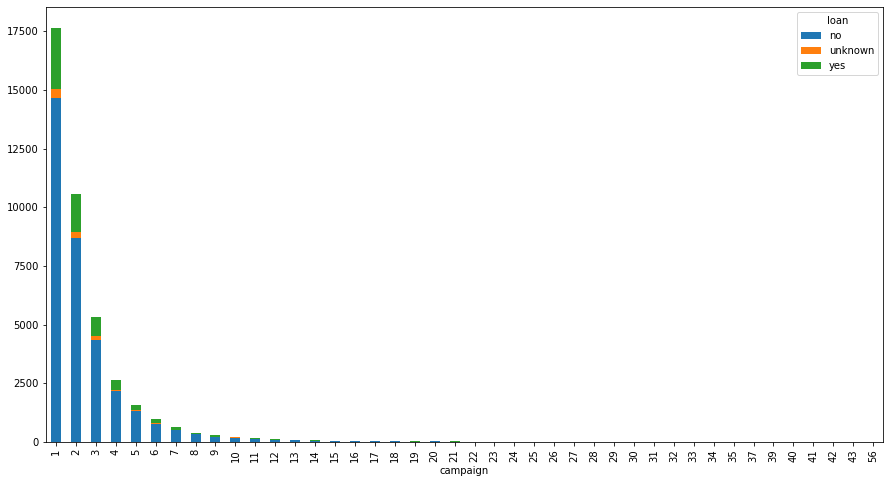

In [115]:
stack = pd.crosstab(index=df['campaign'], columns= df['loan'])
stack.plot.bar( stacked=True, label='loan')
plt.show()

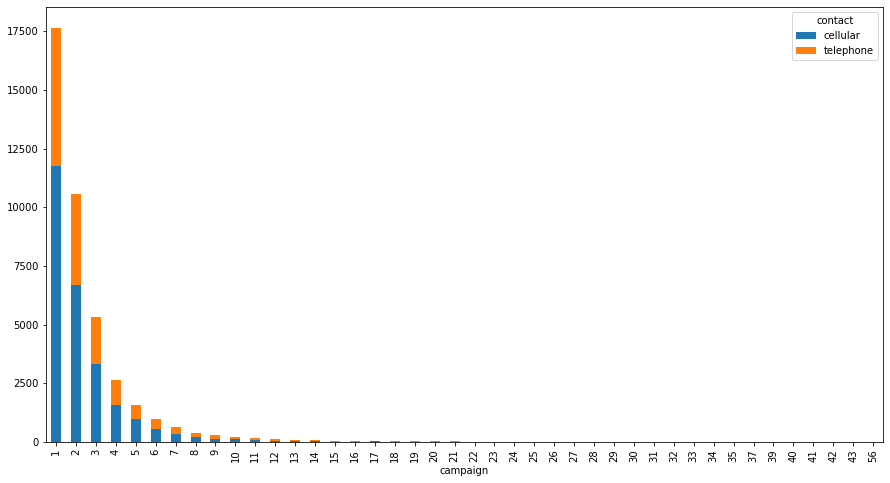

In [116]:
stack = pd.crosstab(index=df['campaign'], columns= df['contact'])
stack.plot.bar( stacked=True, label='contact')
plt.show()

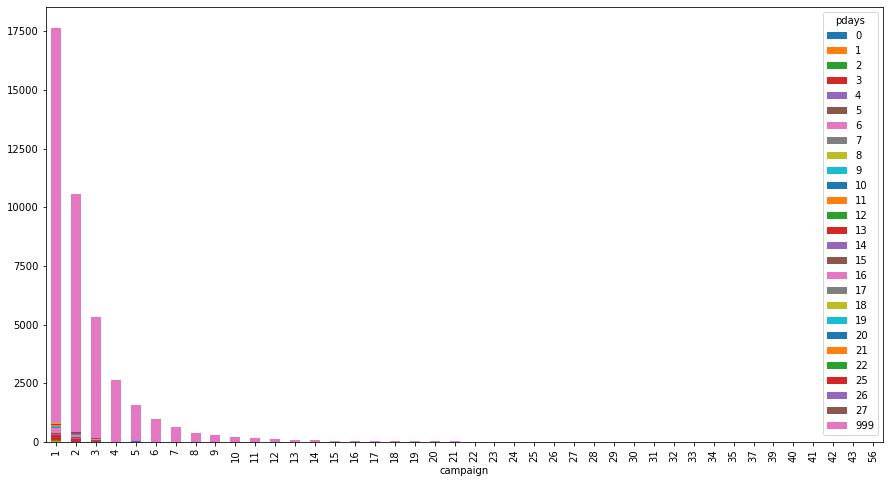

In [117]:
stack = pd.crosstab(index=df['campaign'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

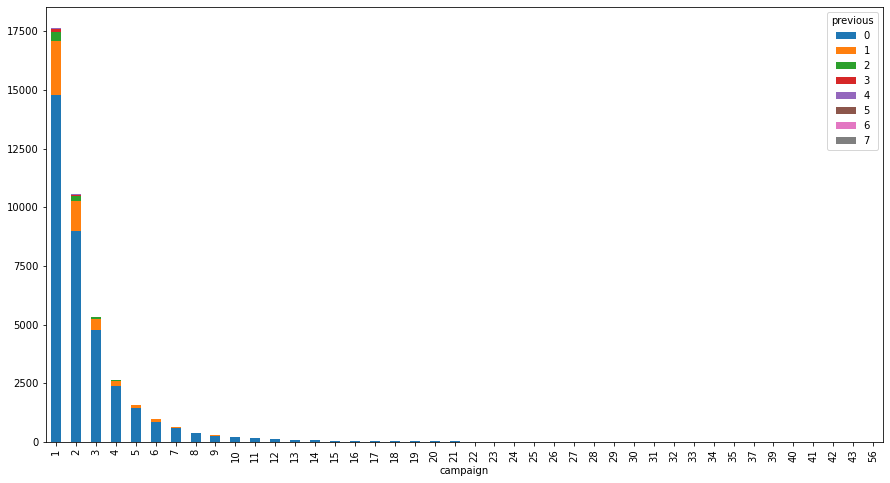

In [118]:
stack = pd.crosstab(index=df['campaign'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

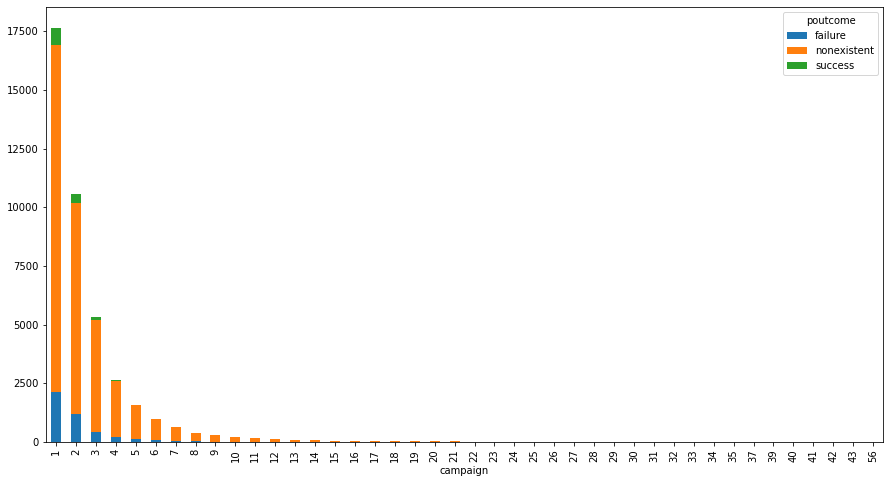

In [119]:
stack = pd.crosstab(index=df['campaign'], columns= df['poutcome'])
stack.plot.bar( stacked=True, label='poutcome')
plt.show()

### poutcome v/s attribuites

In [120]:
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


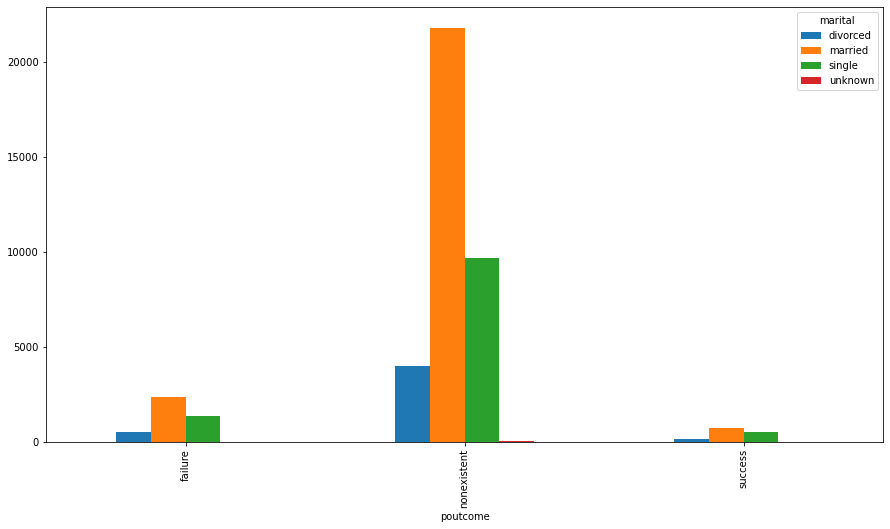

In [121]:
stack = pd.crosstab(index=df['poutcome'], columns= df['marital'])
stack.plot.bar( label='marital')
plt.show()

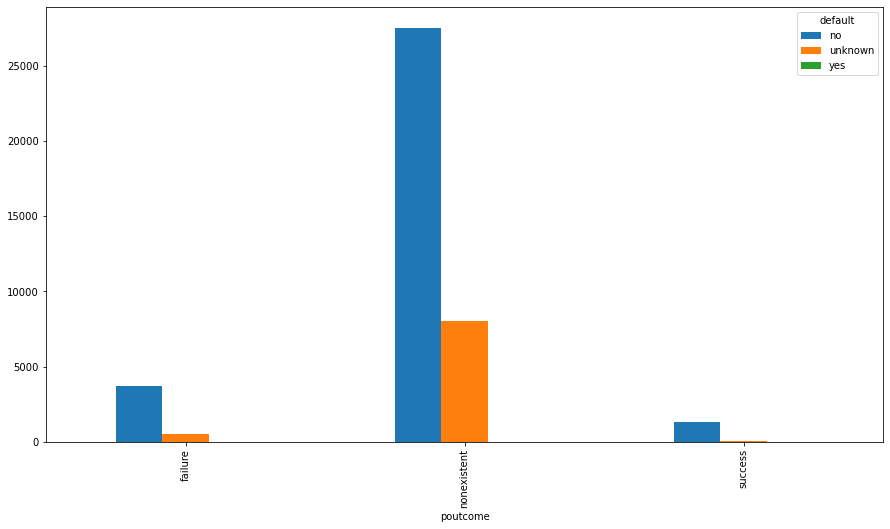

In [122]:
stack = pd.crosstab(index=df['poutcome'], columns= df['default'])
stack.plot.bar( label='default')
plt.show()

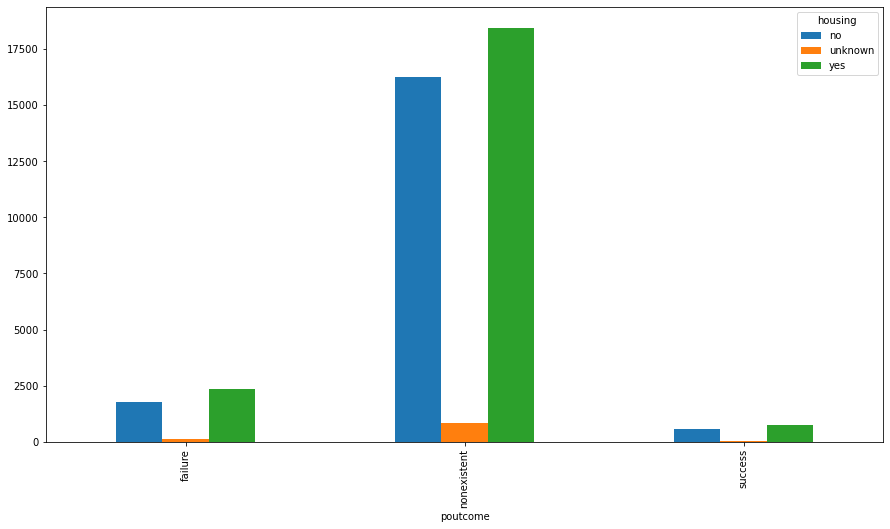

In [123]:
stack = pd.crosstab(index=df['poutcome'], columns= df['housing'])
stack.plot.bar( label='housing')
plt.show()

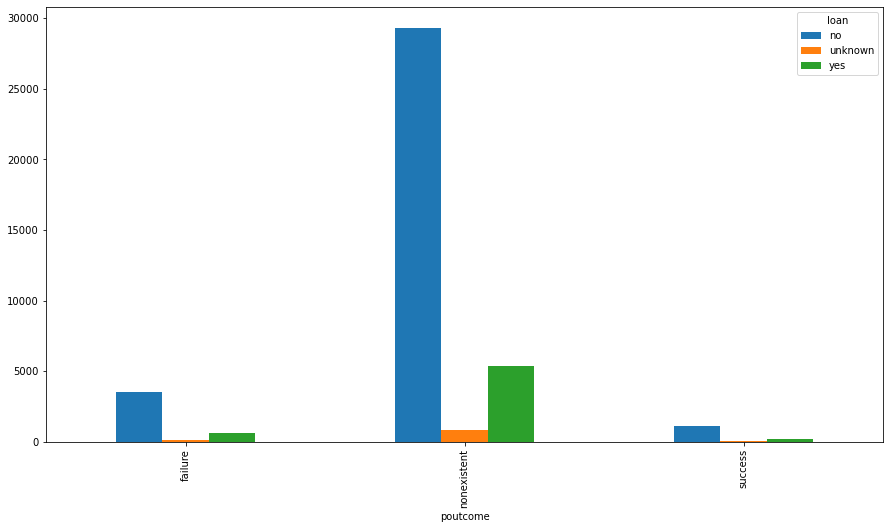

In [124]:
stack = pd.crosstab(index=df['poutcome'], columns= df['loan'])
stack.plot.bar( label='loan')
plt.show()

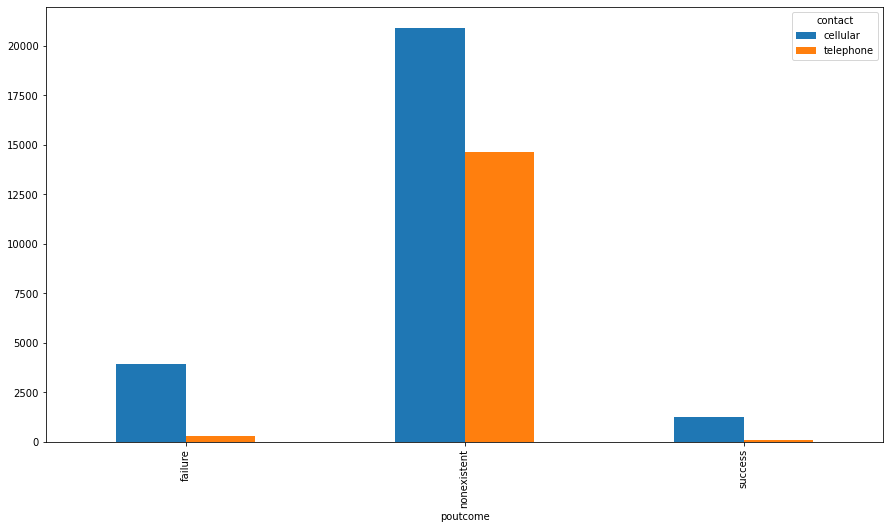

In [125]:
stack = pd.crosstab(index=df['poutcome'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

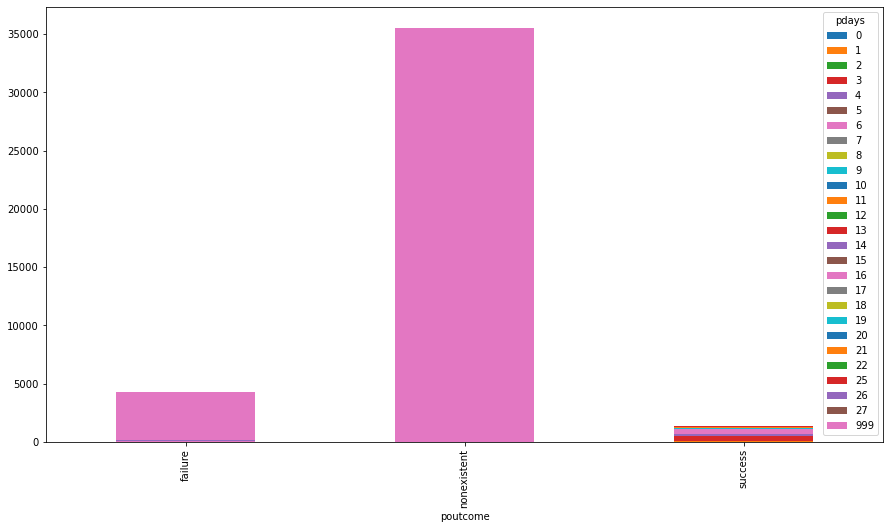

In [126]:
stack = pd.crosstab(index=df['poutcome'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

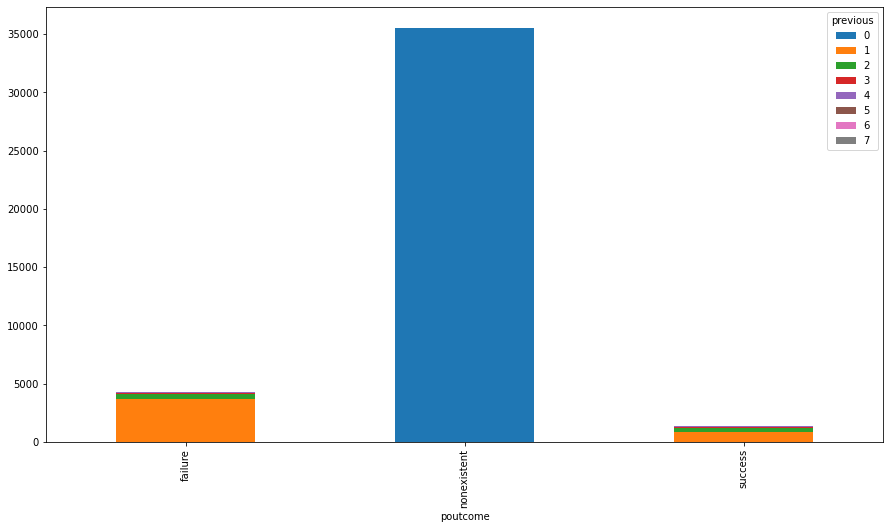

In [127]:
stack = pd.crosstab(index=df['poutcome'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

### Marital v/s Default

In [128]:
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,no


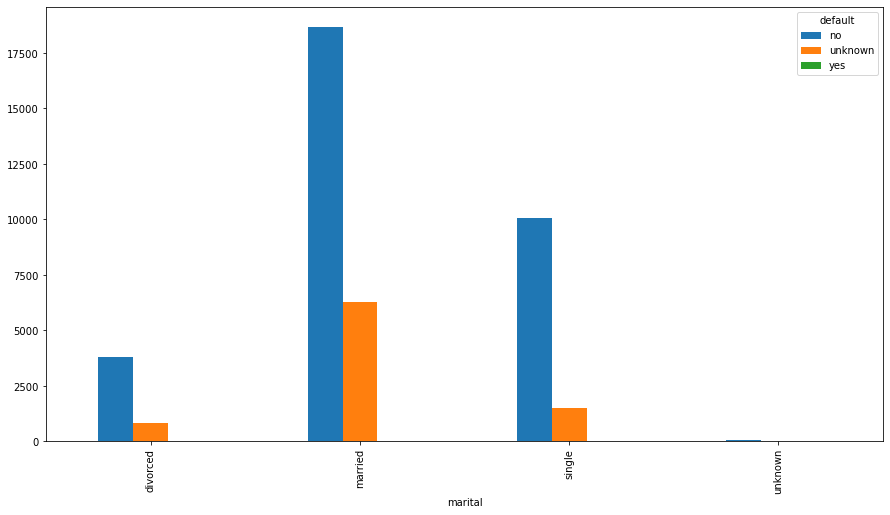

In [129]:
stack = pd.crosstab(index=df['marital'], columns= df['default'])
stack.plot.bar( label='default')
plt.show()

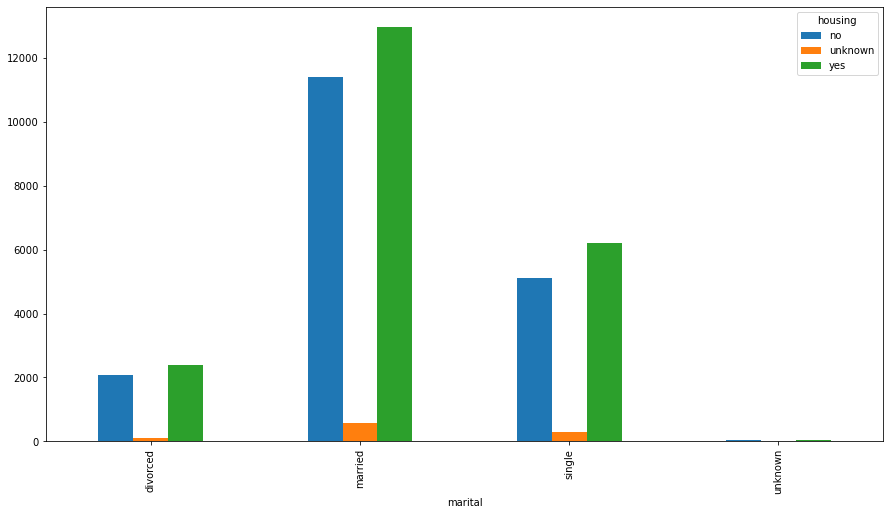

In [130]:
stack = pd.crosstab(index=df['marital'], columns= df['housing'])
stack.plot.bar( label='housing')
plt.show()

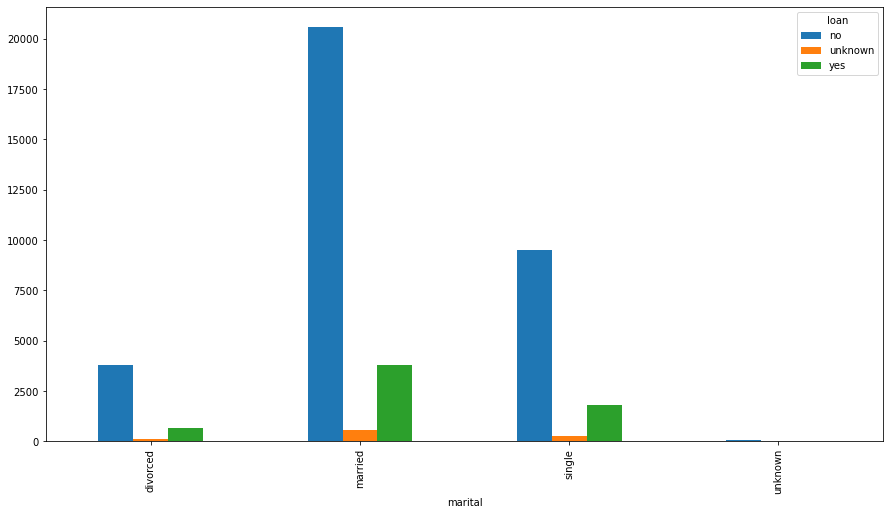

In [131]:
stack = pd.crosstab(index=df['marital'], columns= df['loan'])
stack.plot.bar( label='loan')
plt.show()

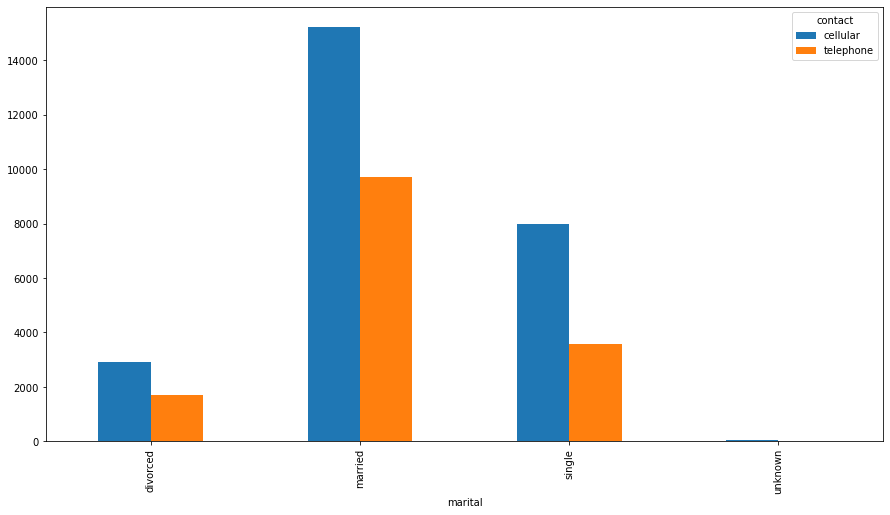

In [132]:
stack = pd.crosstab(index=df['marital'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

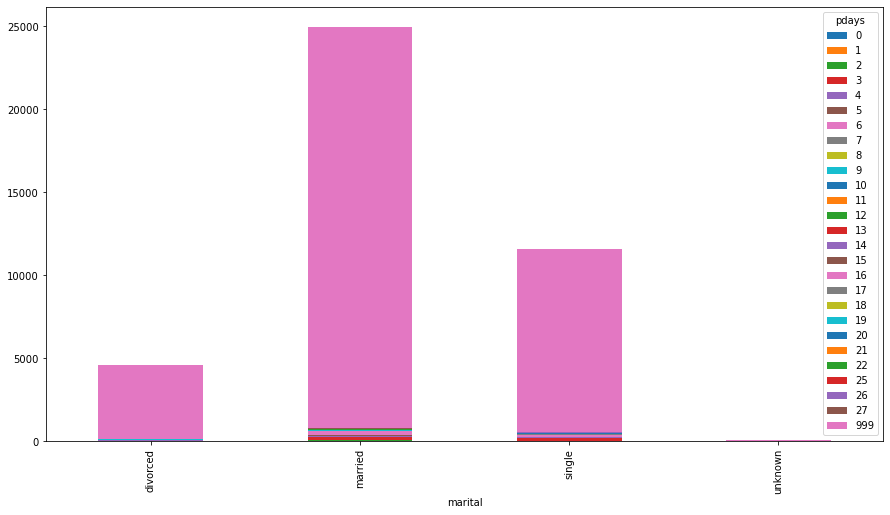

In [133]:
stack = pd.crosstab(index=df['marital'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

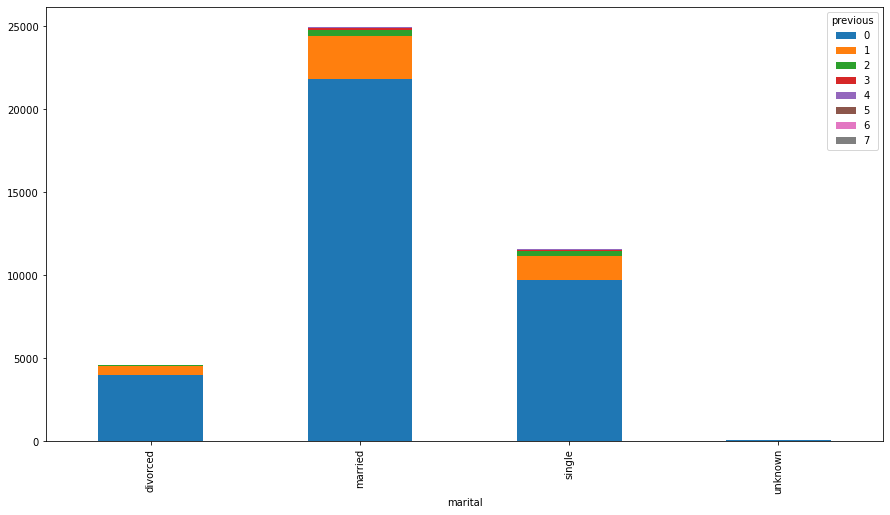

In [134]:
stack = pd.crosstab(index=df['marital'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

### default v/s attributes

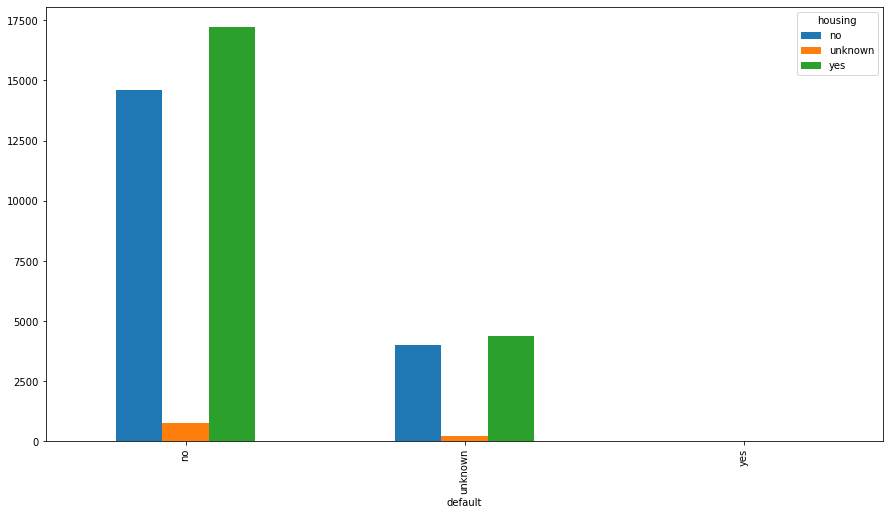

In [135]:
stack = pd.crosstab(index=df['default'], columns= df['housing'])
stack.plot.bar( label='housing')
plt.show()

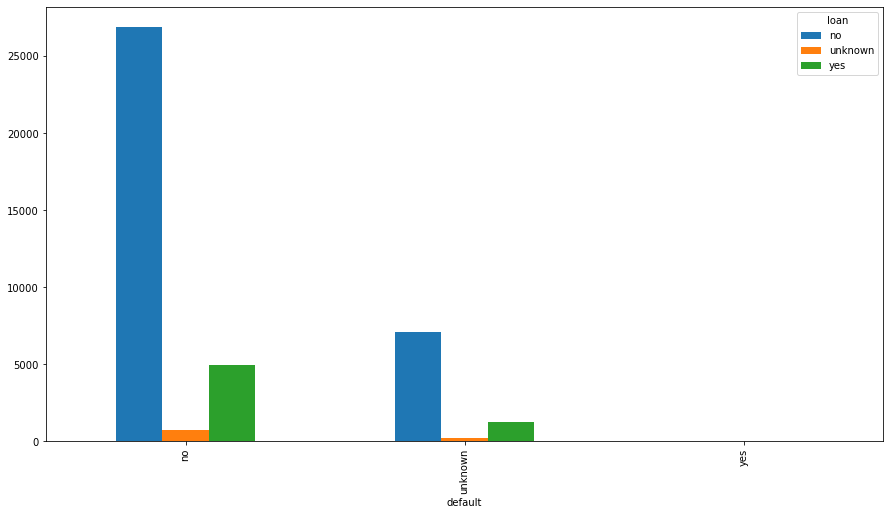

In [136]:
stack = pd.crosstab(index=df['default'], columns= df['loan'])
stack.plot.bar( label='loan')
plt.show()

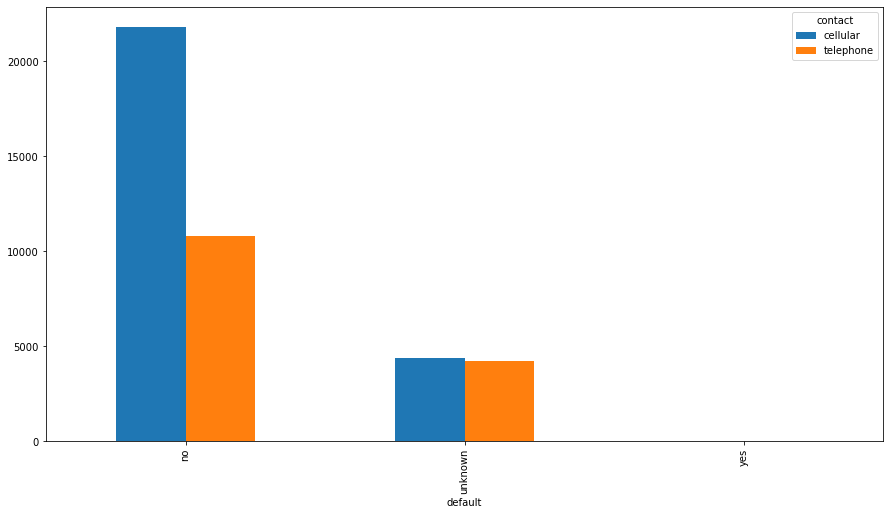

In [137]:
stack = pd.crosstab(index=df['default'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

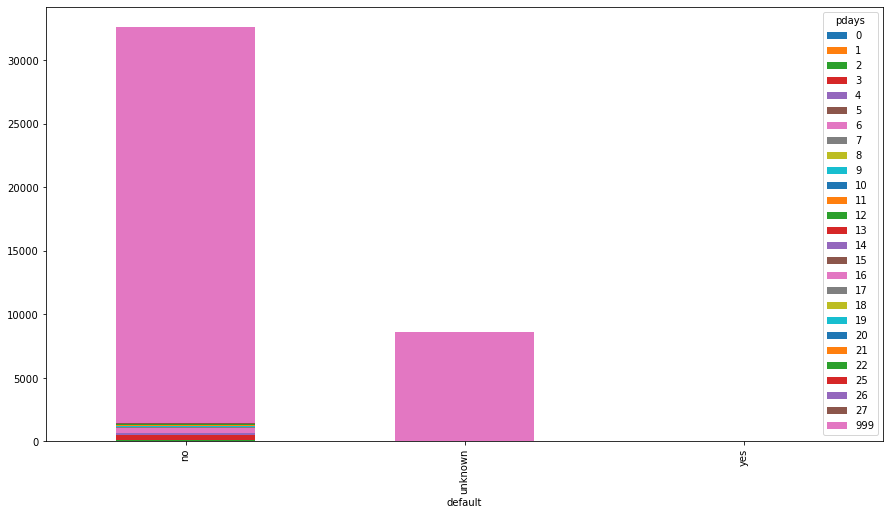

In [138]:
stack = pd.crosstab(index=df['default'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

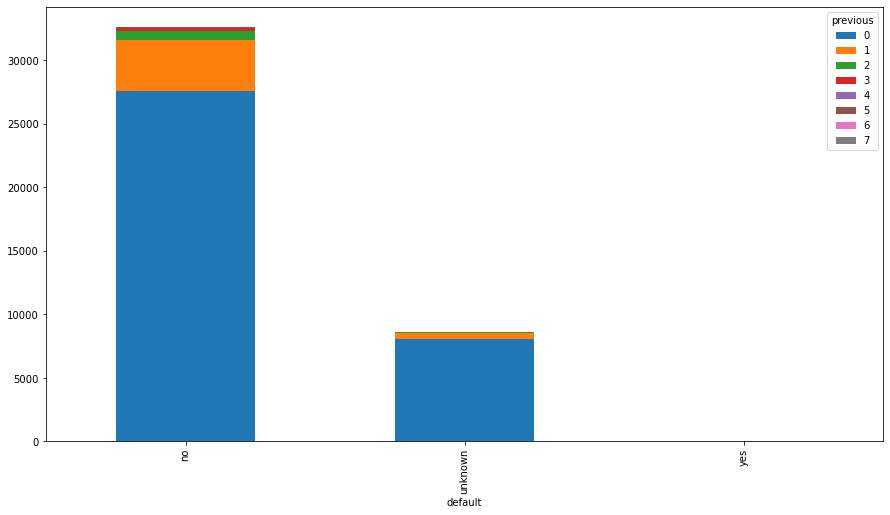

In [139]:
stack = pd.crosstab(index=df['default'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

### housing v/s attribuites

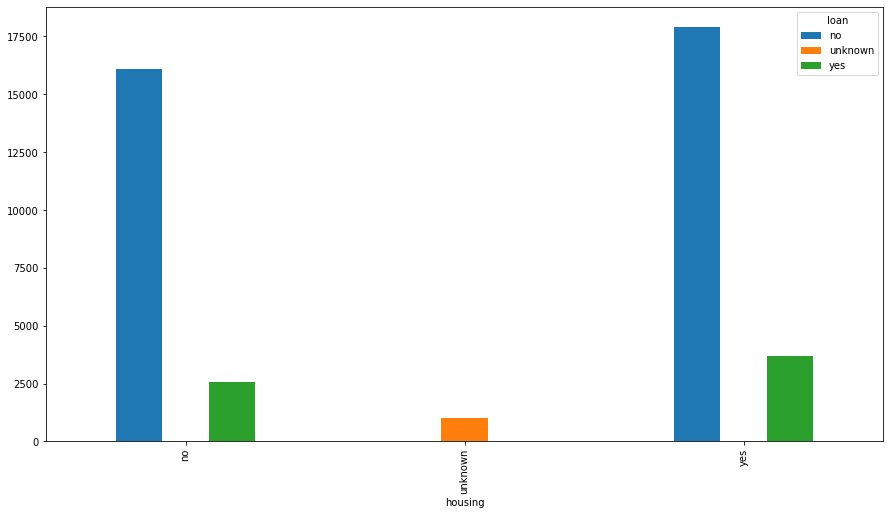

In [140]:
stack = pd.crosstab(index=df['housing'], columns= df['loan'])
stack.plot.bar(label='loan')
plt.show()

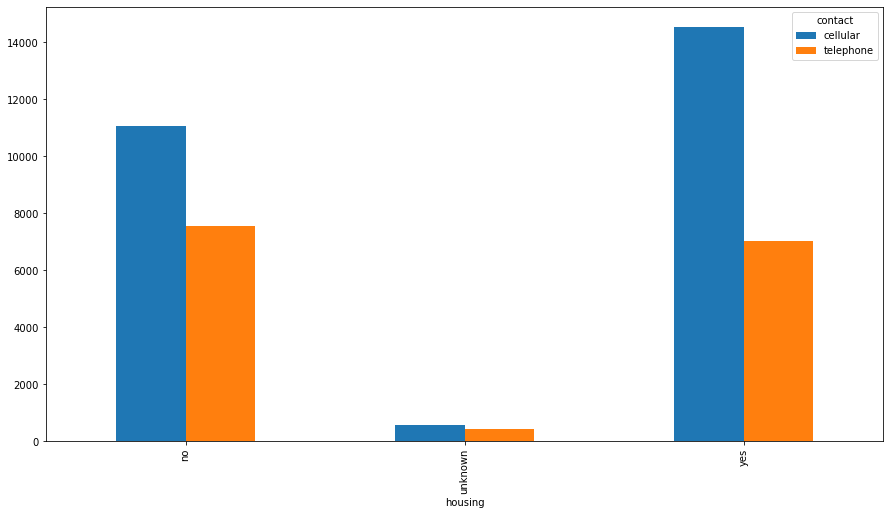

In [141]:
stack = pd.crosstab(index=df['housing'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

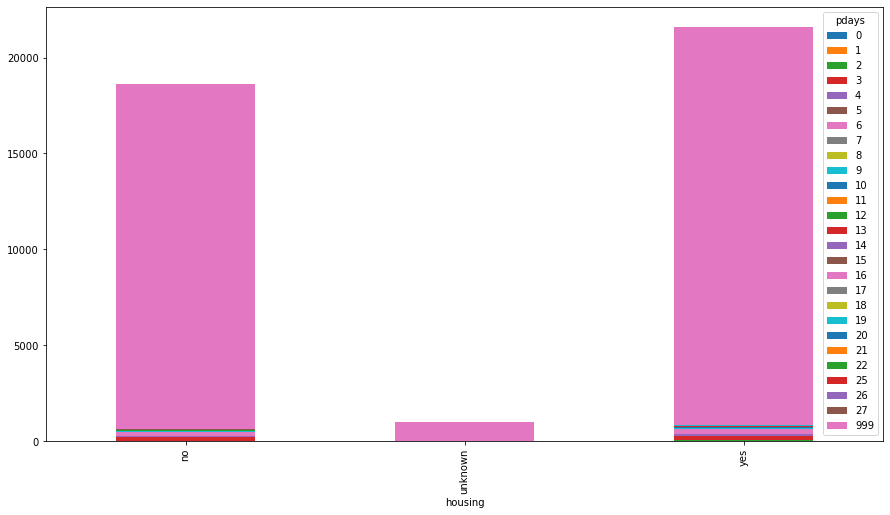

In [142]:
stack = pd.crosstab(index=df['housing'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

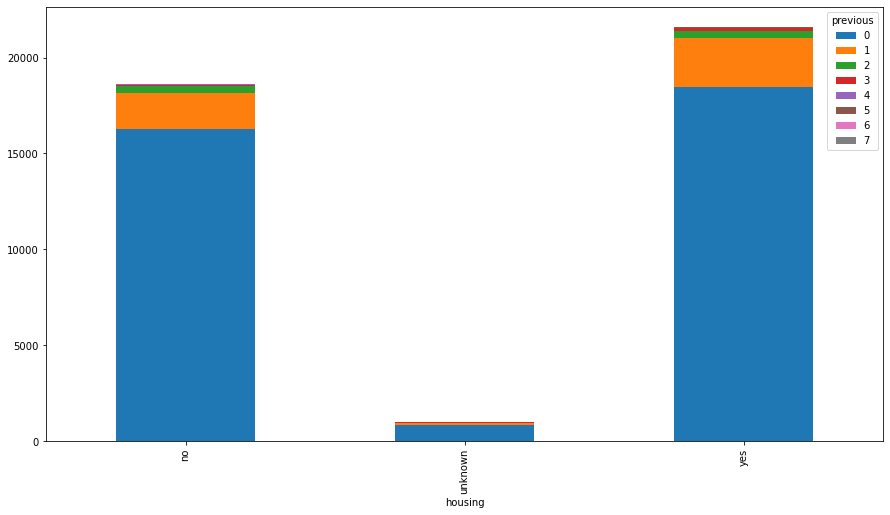

In [143]:
stack = pd.crosstab(index=df['housing'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

### loan v/s attribute

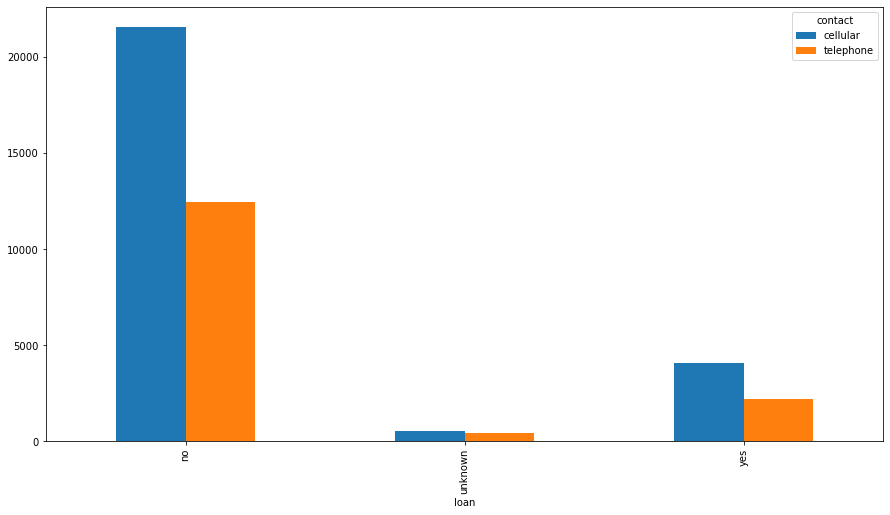

In [144]:
stack = pd.crosstab(index=df['loan'], columns= df['contact'])
stack.plot.bar( label='contact')
plt.show()

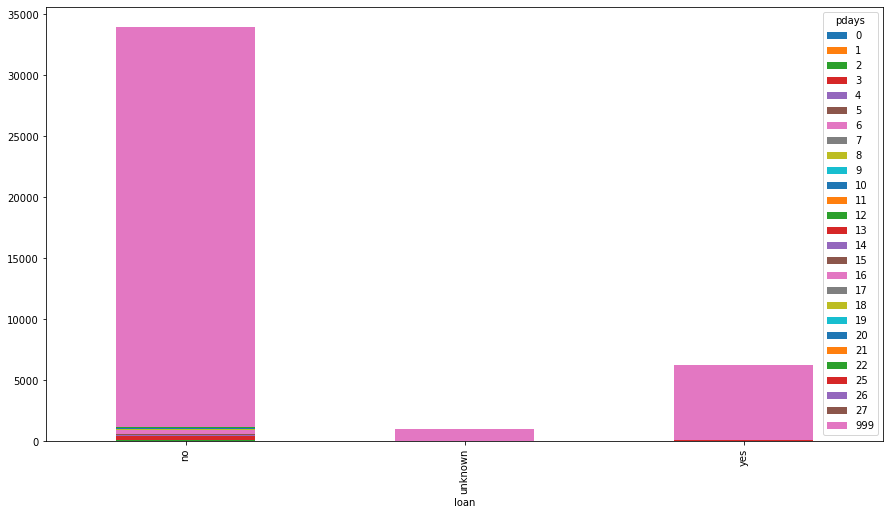

In [145]:
stack = pd.crosstab(index=df['loan'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

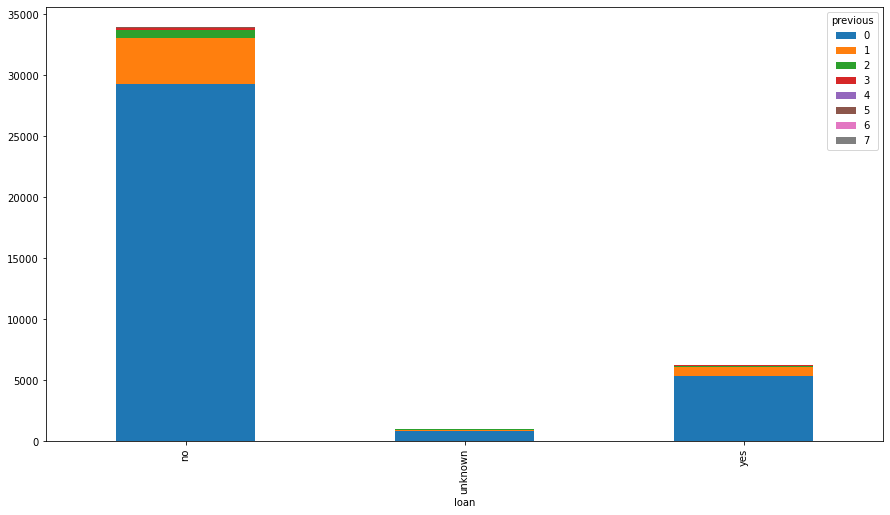

In [146]:
stack = pd.crosstab(index=df['loan'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

### contact v/s remaining attribuites

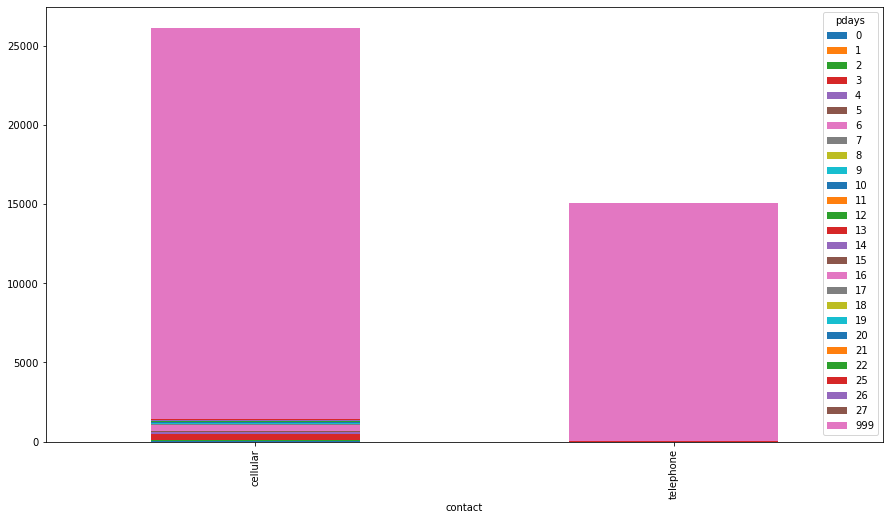

In [147]:
stack = pd.crosstab(index=df['contact'], columns= df['pdays'])
stack.plot.bar( stacked=True, label='pdays')
plt.show()

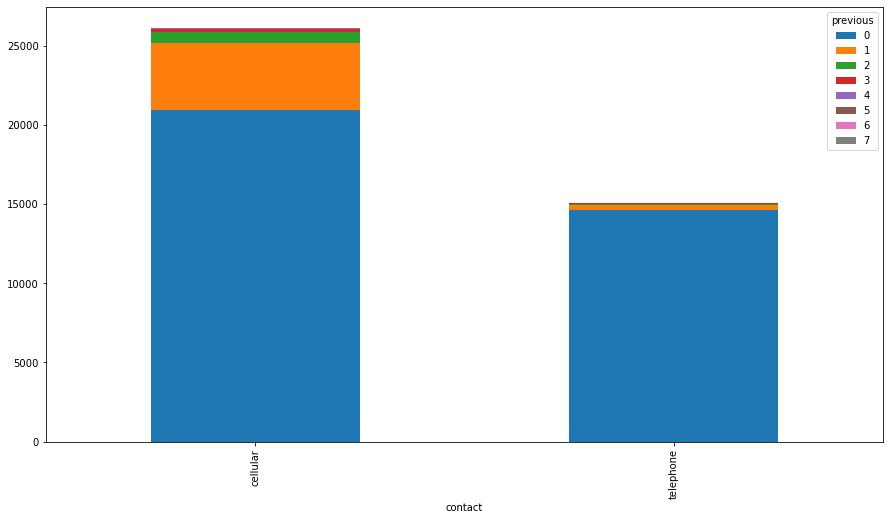

In [148]:
stack = pd.crosstab(index=df['contact'], columns= df['previous'])
stack.plot.bar( stacked=True, label='previous')
plt.show()

# Bivariate Analysis

## Plotting column age with all categorical features

<AxesSubplot:xlabel='job', ylabel='age'>

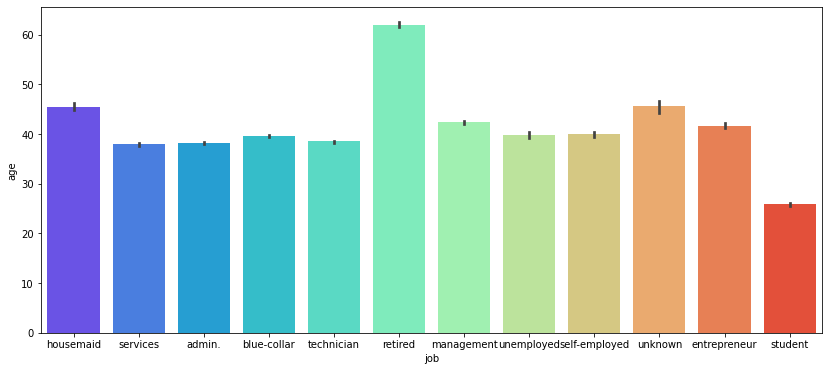

In [149]:
# age with job
plt.figure(figsize=(14,6))
sns.barplot(x='job',y='age',data=df,palette='rainbow')


In [150]:
# Inference: People nearing to 60 are most likely to get retired

<AxesSubplot:xlabel='marital', ylabel='age'>

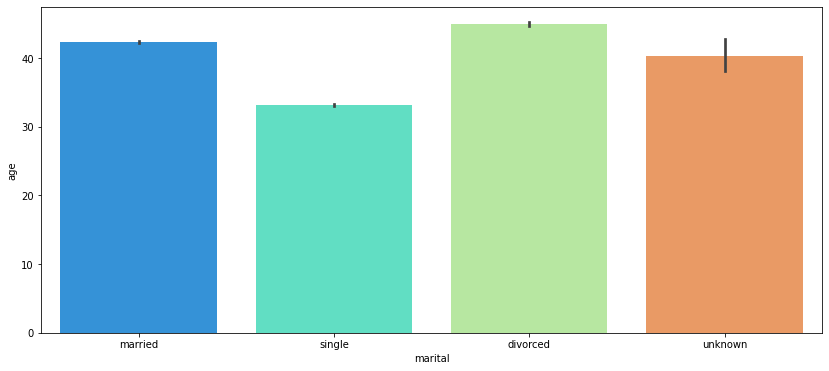

In [151]:
# age with marital
plt.figure(figsize=(14,6))
sns.barplot(x="marital", y="age", data=df,palette='rainbow')


In [152]:
# There are more number of divorced people as the age increases

<AxesSubplot:xlabel='education', ylabel='age'>

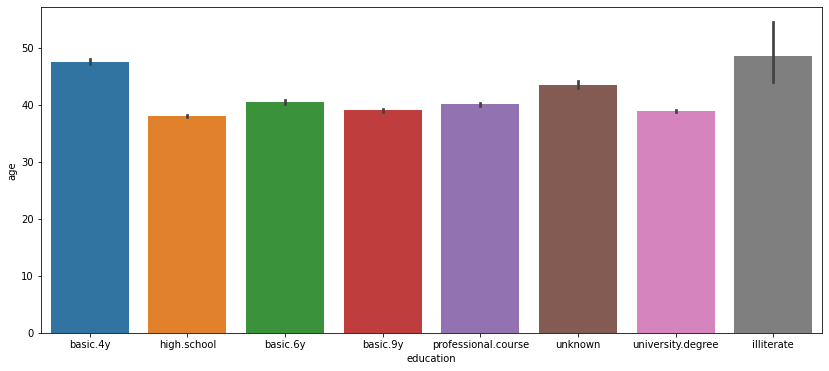

In [153]:
# age with education
plt.figure(figsize=(14,6))
sns.barplot(x="education", y="age", data=df)

In [154]:
# More aged people are most likely to be illliterate

<AxesSubplot:xlabel='default', ylabel='age'>

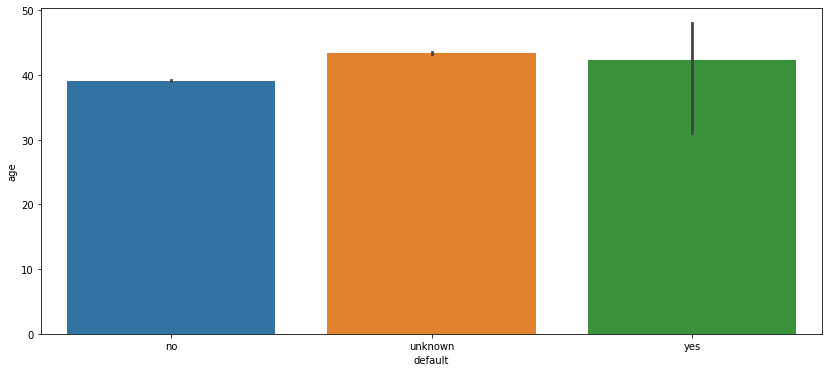

In [155]:
# age with default
plt.figure(figsize=(14,6))
sns.barplot(x="default", y="age", data=df)

In [156]:
# There are more number of unknown values as age increases

<AxesSubplot:xlabel='housing', ylabel='age'>

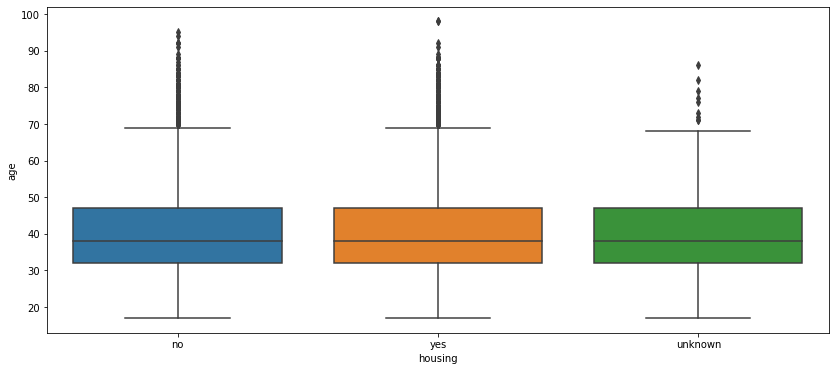

In [157]:
# age with housing
plt.figure(figsize=(14,6))
sns.boxplot(x="housing", y="age", data=df)

In [158]:
# Age group between 30-40 have equal numbers of housing status

<AxesSubplot:xlabel='loan', ylabel='age'>

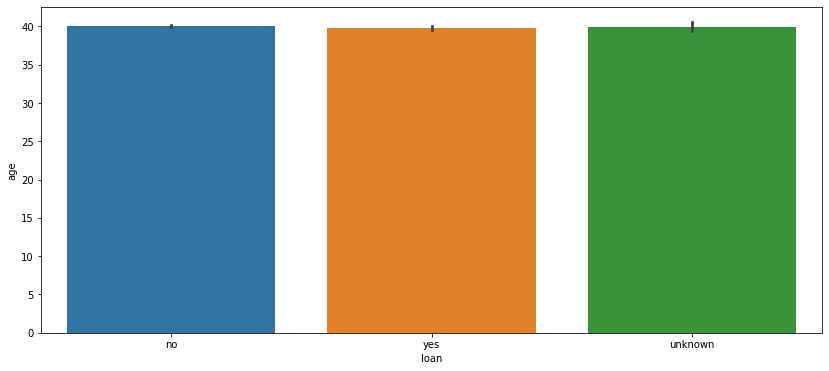

In [159]:
# age with loan
plt.figure(figsize=(14,6))
sns.barplot(x="loan", y="age", data=df)

In [160]:
# both the status of loan inclues same age group

<AxesSubplot:xlabel='contact', ylabel='age'>

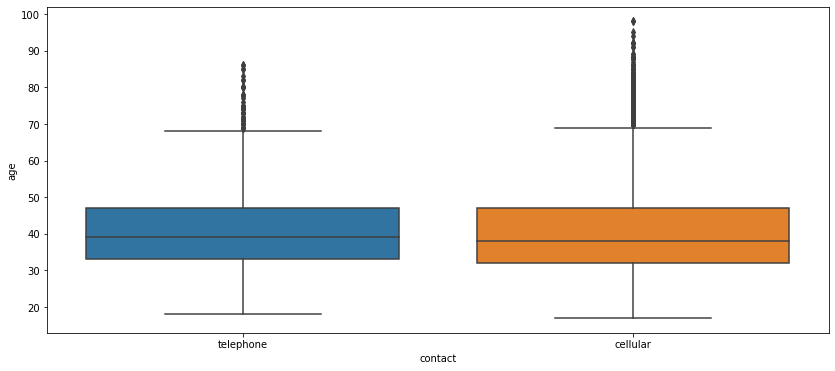

In [161]:
# age with contact
plt.figure(figsize=(14,6))
sns.boxplot(x="contact", y="age", data=df)

In [162]:
# Both telephone and cellular contact include same age group

<AxesSubplot:xlabel='month', ylabel='age'>

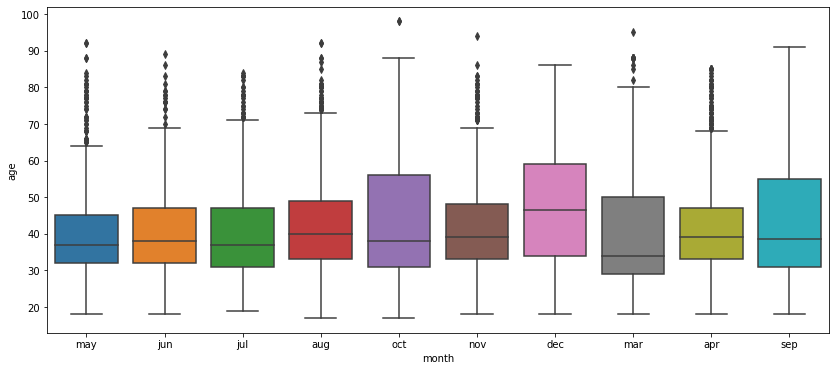

In [163]:
# age with month
plt.figure(figsize=(14,6))
sns.boxplot(x="month", y="age", data=df)

In [164]:
# More number of age people have been contacted in the month of december


<AxesSubplot:xlabel='day_of_week', ylabel='age'>

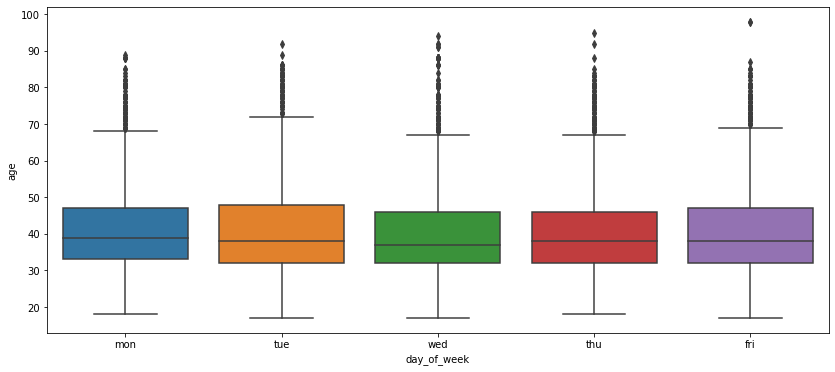

In [165]:
# age with day of week
plt.figure(figsize=(14,6))
sns.boxplot(x="day_of_week", y="age", data=df)

In [166]:
# Same number of calls were made on each day


<AxesSubplot:xlabel='campaign', ylabel='age'>

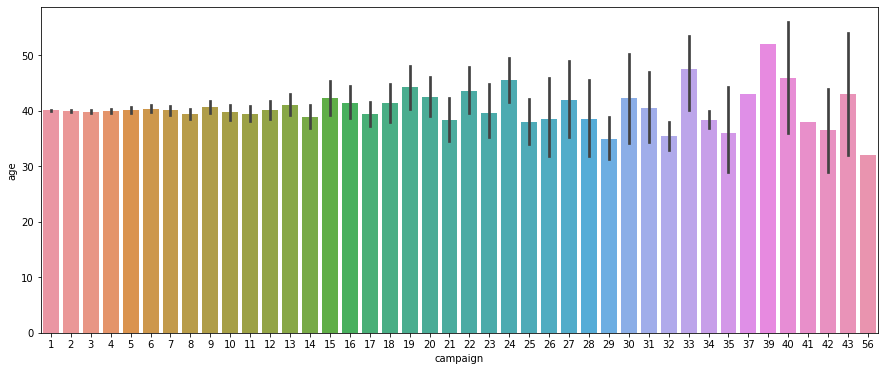

In [167]:
# age with campaign
plt.figure(figsize=(15,6))
sns.barplot(x="campaign", y="age", data=df)

In [168]:
# More number of campaigns were conducted for the age group above 50

<AxesSubplot:xlabel='pdays', ylabel='age'>

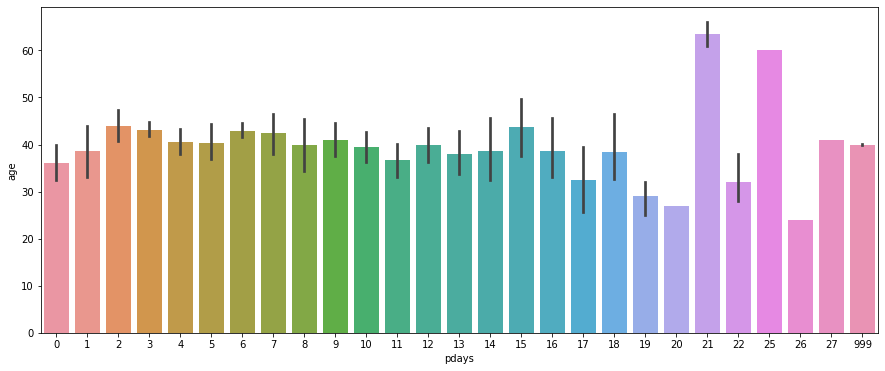

In [169]:
# age with campaign
plt.figure(figsize=(15,6))
sns.barplot(x="pdays", y="age", data=df)

In [170]:
# More number of people of the age 60 were contacted again

<AxesSubplot:xlabel='previous', ylabel='age'>

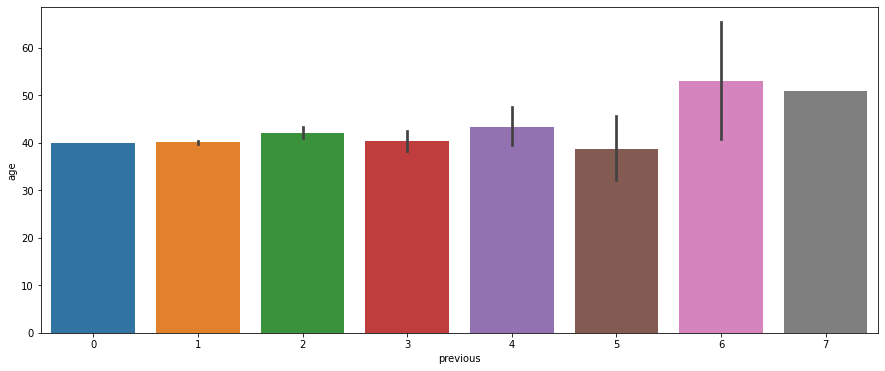

In [171]:
# age with campaign
plt.figure(figsize=(15,6))
sns.barplot(x="previous", y="age", data=df)

In [172]:
# Six to seven number of times a person above age 50 was contacted previously  

<AxesSubplot:xlabel='poutcome', ylabel='age'>

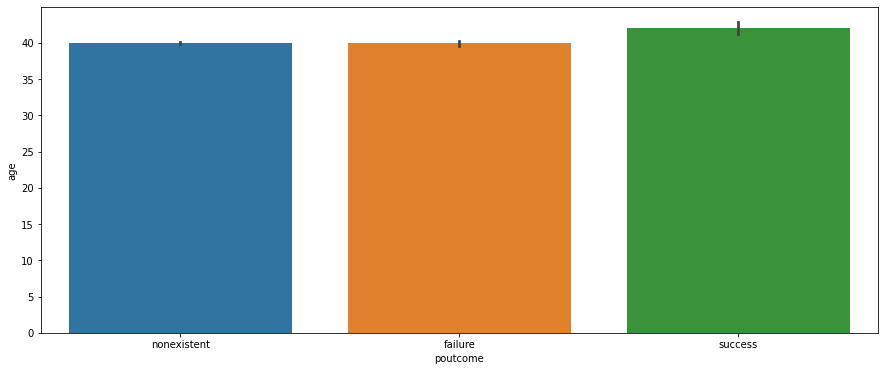

In [173]:
# age with poutcome
plt.figure(figsize=(15,6))
sns.barplot(x="poutcome", y="age", data=df)

In [174]:
# There are more number of success outcomes from the previous campaign for the age group of around 40

<AxesSubplot:xlabel='y', ylabel='age'>

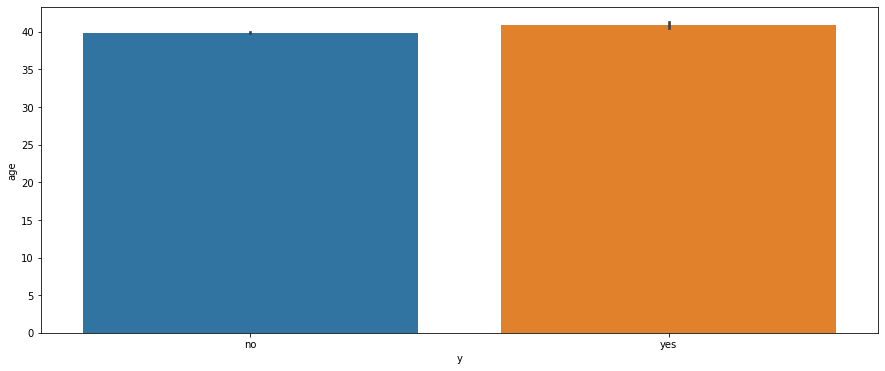

In [175]:
# age with y
plt.figure(figsize=(15,6))
sns.barplot(x="y", y="age", data=df)

In [176]:
# People above age group of 40 are more likely to accept the term deposit

# Plotting duration with all categorical features

In [177]:
# Equal number of call duration were recorded both for retired and students.

In [178]:
# duration with job
fig = px.box(df, x="job", y="duration", color="y")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

In [179]:
# Insights: The leads who have not made a deposit have lesser duration on calls
# Comparing the average, the blue collar, entrepreneur have high duration in 
#calls and student, retired have less duration in average.
#Large distribution of leads were from self employed clients and management people.

<AxesSubplot:xlabel='marital', ylabel='duration'>

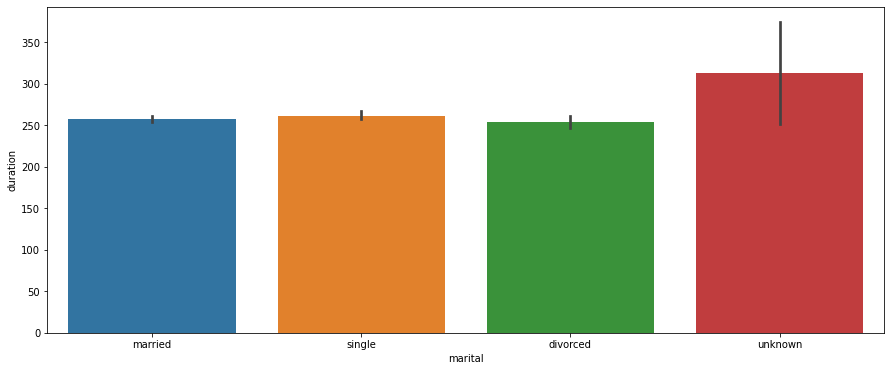

In [180]:
# duration with marital
plt.figure(figsize=(15,6))
sns.barplot(x="marital", y="duration", data=df)

In [181]:
# More amount of duartion of calls were recorded for unknown 

<AxesSubplot:xlabel='education', ylabel='duration'>

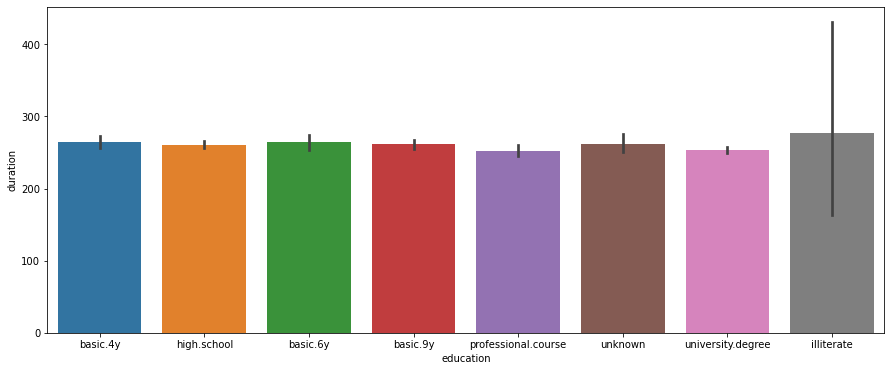

In [182]:
# duration with education
plt.figure(figsize=(15,6))
sns.barplot(x="education", y="duration", data=df)

In [183]:
# Almost equal number of call duration was recorded for illliterate and unknown

<AxesSubplot:xlabel='default', ylabel='duration'>

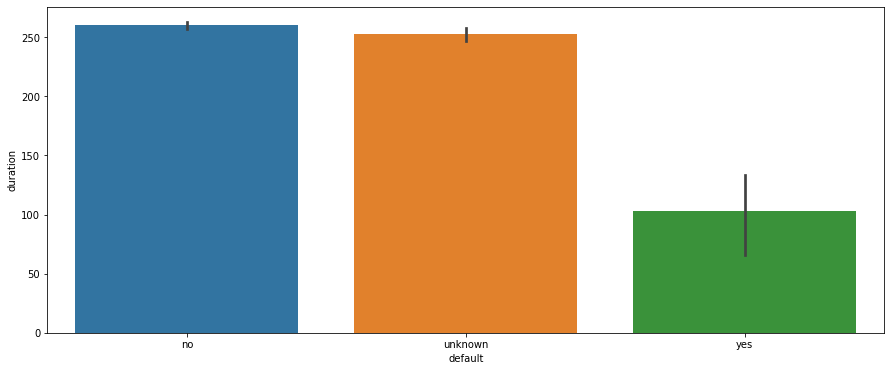

In [184]:
# duartion with default
plt.figure(figsize=(15,6))
sns.barplot(x="default", y="duration", data=df)

In [185]:
# People with high duration of calls were unlikely to have credit by default.

<AxesSubplot:xlabel='housing', ylabel='duration'>

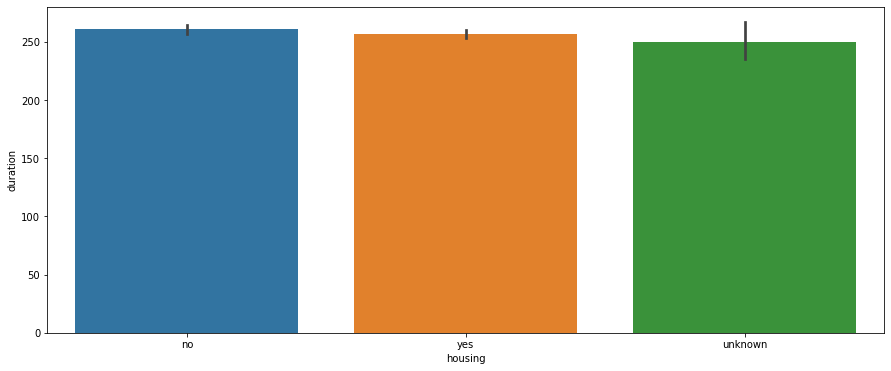

In [186]:
# duration with housing
plt.figure(figsize=(15,6))
sns.barplot(x="housing", y="duration", data=df)

In [187]:
# People with high duration of calls were unlikely to have a housing loan

<AxesSubplot:xlabel='loan', ylabel='duration'>

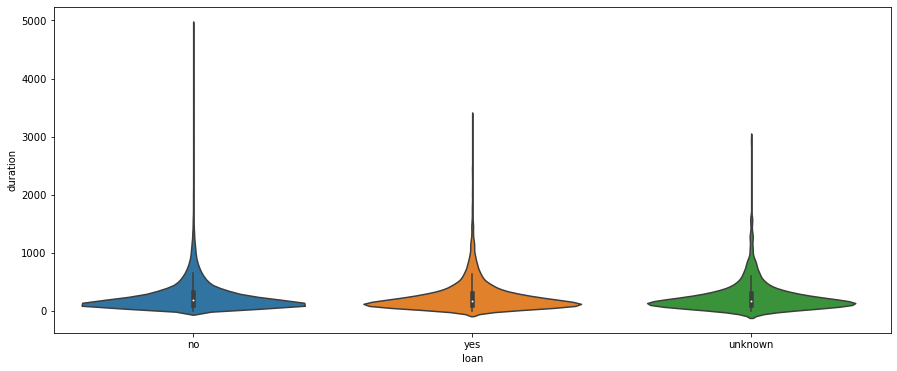

In [188]:
# duration with loan
plt.figure(figsize=(15,6))
sns.violinplot(x="loan", y="duration", data=df)

In [189]:
# Equal amount of duration was recorded for those having and not having presonal loan.

<AxesSubplot:xlabel='contact', ylabel='duration'>

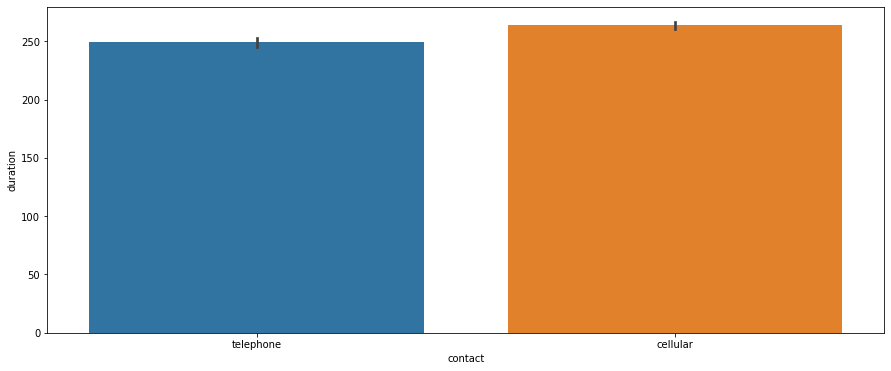

In [190]:
# duration with contact
plt.figure(figsize=(15,6))
sns.barplot(x="contact", y="duration", data=df)

In [191]:
# More amount of duartion was recorded for those having cellular connection.

<AxesSubplot:xlabel='month', ylabel='duration'>

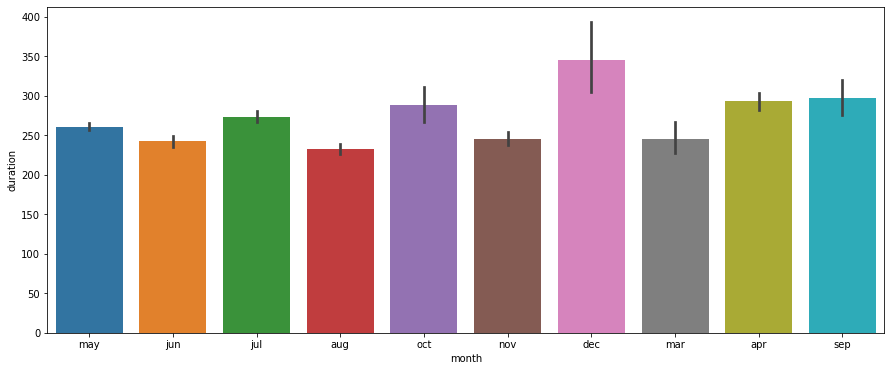

In [192]:
# duration with month
plt.figure(figsize=(15,6))
sns.barplot(x="month", y="duration", data=df)

In [193]:
# Highest amount of duartion of calls was recorded in the month of December.

<AxesSubplot:xlabel='day_of_week', ylabel='duration'>

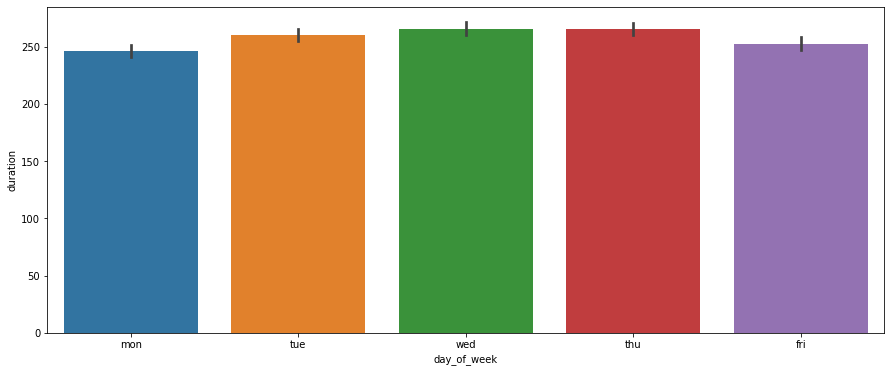

In [194]:
# duration of day of week
plt.figure(figsize=(15,6))
sns.barplot(x="day_of_week", y="duration", data=df)

In [195]:
# From grapgh it seems that more duration was recorded on mid days of week like wednesday and thursday

In [196]:
# duration with campaign
fig = px.scatter(df, x="campaign", y="duration", color="y")
fig.show()

In [197]:
# Insights: The more the duration the calls were, they had higher probability in making a deposit
#Duration of calls faded as the time period of campaign extended further
#There were many positive leads in the initial days of campaign

<AxesSubplot:xlabel='pdays', ylabel='duration'>

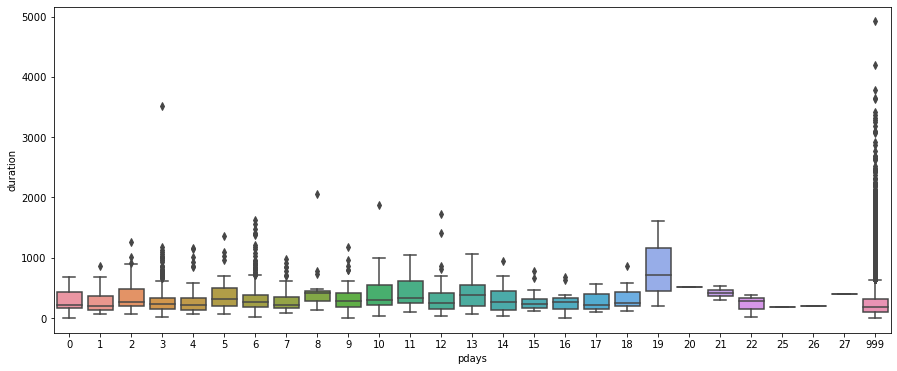

In [198]:
# duration with pdays
plt.figure(figsize=(15,6))
sns.boxplot(x="pdays", y="duration", data=df)

In [199]:
# Some duration was recorded for customers from previous campaign  than the new customers

<AxesSubplot:xlabel='previous', ylabel='duration'>

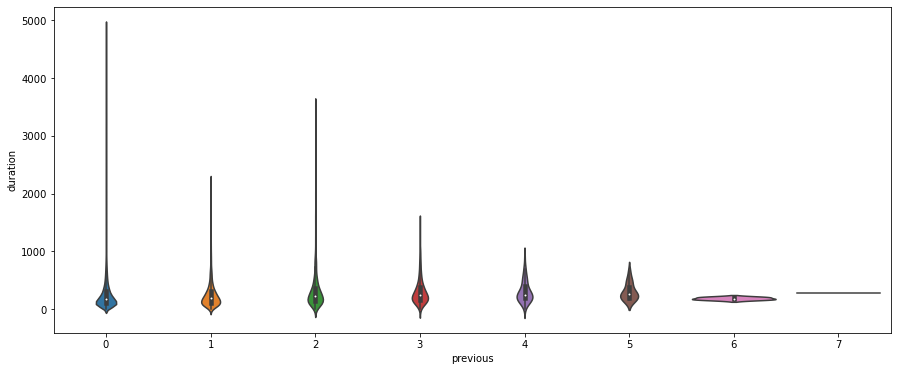

In [200]:
# duration with previous
plt.figure(figsize=(15,6))
sns.violinplot(x="previous", y="duration", data=df)

In [201]:
# People with more number of contacts performed before this campaign have very less duration 
#than the new costomers who were not contacted.

<AxesSubplot:xlabel='poutcome', ylabel='duration'>

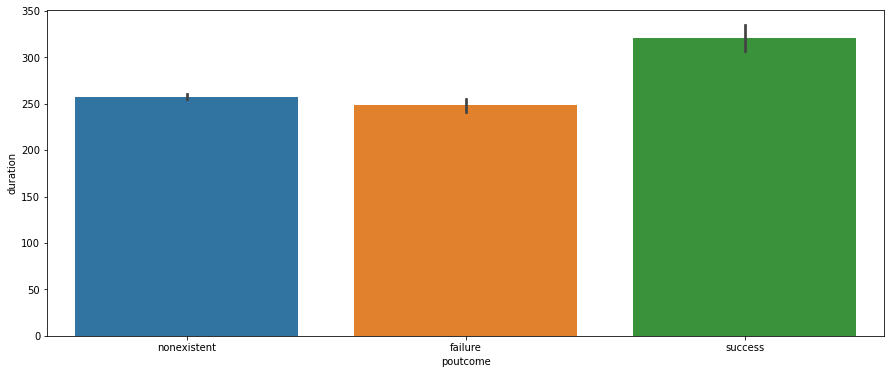

In [202]:
# duration with poutcome
plt.figure(figsize=(15,6))
sns.barplot(x="poutcome", y="duration", data=df)

In [203]:
# People with highest amount of duration have more number of success result from previous campaign

<AxesSubplot:xlabel='y', ylabel='duration'>

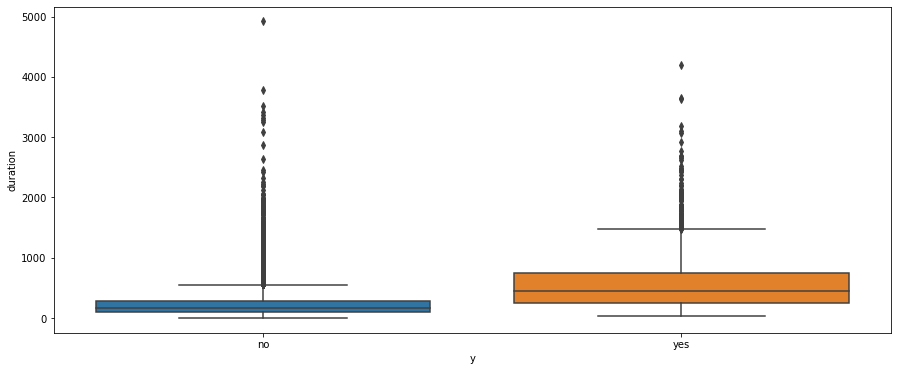

In [204]:
# duration with y
plt.figure(figsize=(15,6))
sns.boxplot(x="y", y="duration", data=df)

In [205]:
# People with highest duration are more likely to make a term deposit
# This attribute highly affects the output variable.

# Plotting emp.var.rate with all categorical features

<AxesSubplot:xlabel='job', ylabel='emp.var.rate'>

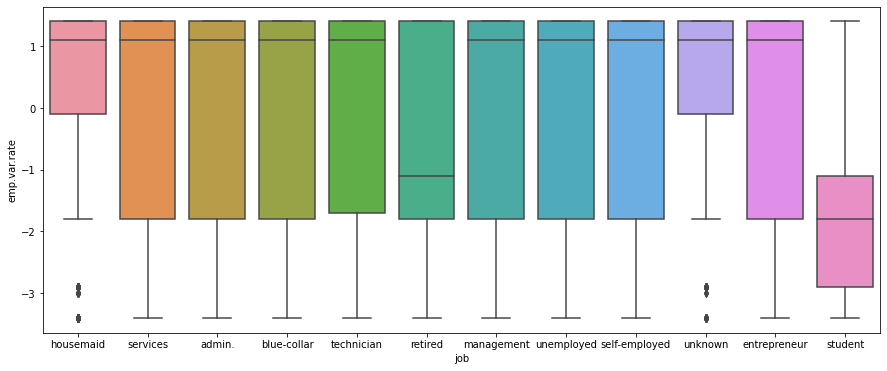

In [206]:
# emp.var.rate with job
plt.figure(figsize=(15,6))
sns.boxplot(x="job", y="emp.var.rate", data=df)

In [207]:
# Emp.var.rate of students and housemaids are less than compared to others

<AxesSubplot:xlabel='marital', ylabel='emp.var.rate'>

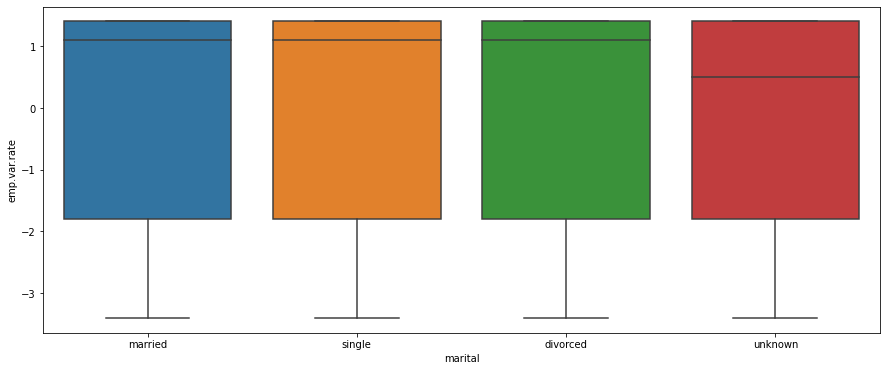

In [208]:
# emp.var.rate with marital
plt.figure(figsize=(15,6))
sns.boxplot(x="marital", y="emp.var.rate", data=df)

In [209]:
# Unknowns have less emp.var.rate than others

<AxesSubplot:xlabel='education', ylabel='emp.var.rate'>

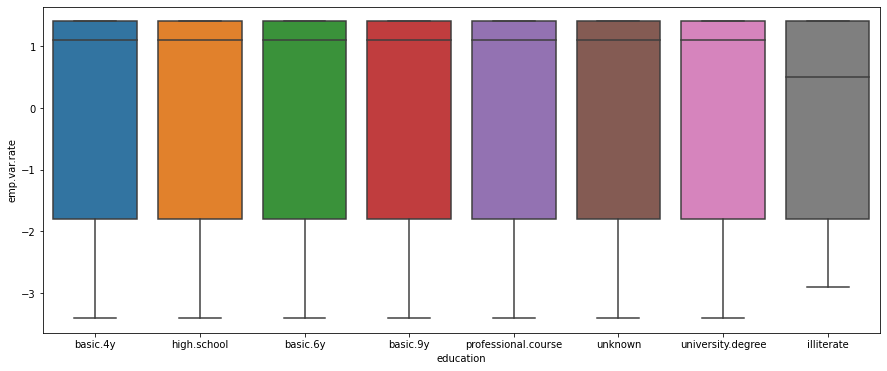

In [210]:
# emp.var.rate with education
plt.figure(figsize=(15,6))
sns.boxplot(x="education", y="emp.var.rate", data=df)

In [211]:
# illiterates have less emp.var.index than all the others

<AxesSubplot:xlabel='default', ylabel='emp.var.rate'>

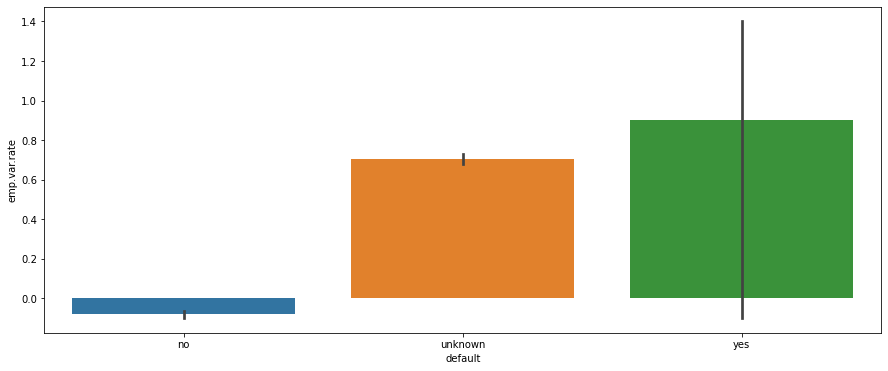

In [212]:
# emp.var.rate with default
plt.figure(figsize=(15,6))
sns.barplot(x="default", y="emp.var.rate", data=df)

In [213]:
# People with high emp.var.rate have more number of credits in default

<AxesSubplot:xlabel='housing', ylabel='emp.var.rate'>

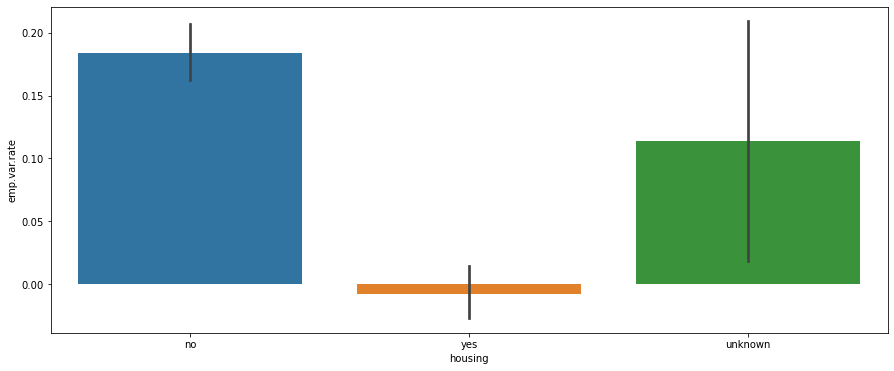

In [214]:
# emp.var.rate with housing
plt.figure(figsize=(15,6))
sns.barplot(x="housing", y="emp.var.rate", data=df)

In [215]:
# People with high emp.var.rate do not have a housing loan
# whereas people with less emp.var.rate are likely to have a housing loan

<AxesSubplot:xlabel='loan', ylabel='emp.var.rate'>

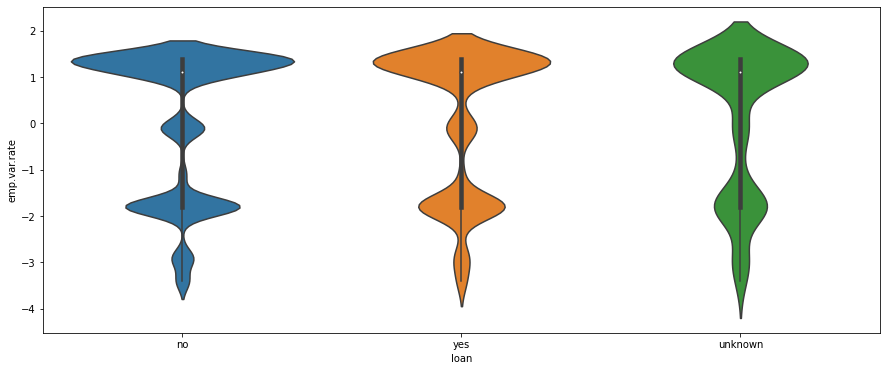

In [216]:
# emp.var.rate with loan
plt.figure(figsize=(15,6))
sns.violinplot(x="loan", y="emp.var.rate", data=df)

In [217]:
# Unknown people have more emp.var.index

<AxesSubplot:xlabel='contact', ylabel='emp.var.rate'>

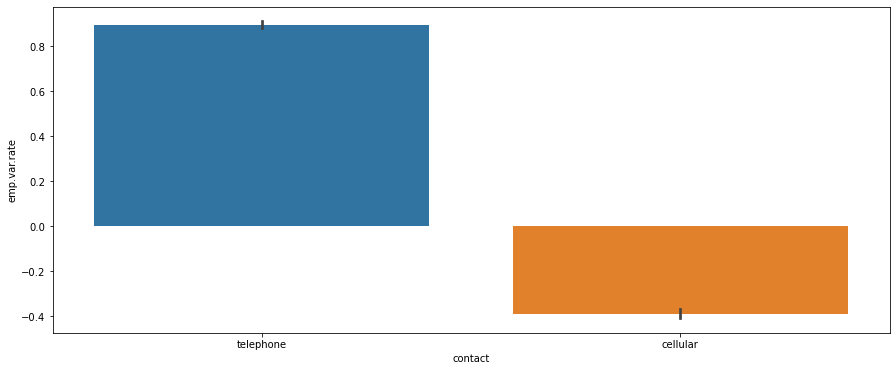

In [218]:
# emp.var.rate with contact
plt.figure(figsize=(15,6))
sns.barplot(x="contact", y="emp.var.rate", data=df)

In [219]:
# People havig cellular communication type have low emp.var.rate

<AxesSubplot:xlabel='month', ylabel='emp.var.rate'>

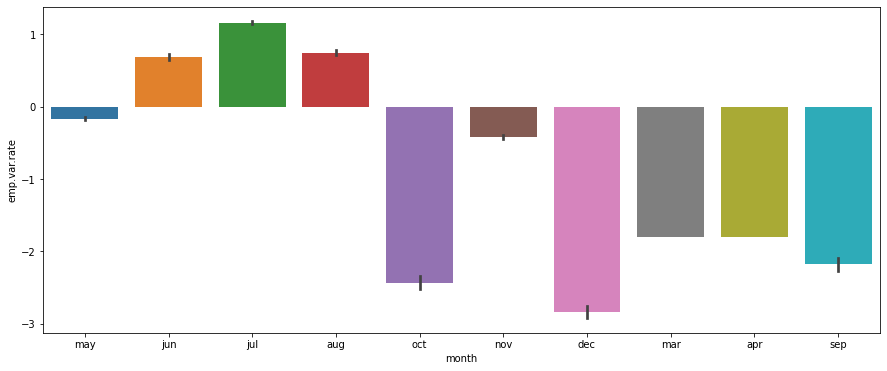

In [220]:
# emp.var.rate with month
plt.figure(figsize=(15,6))
sns.barplot(x="month", y="emp.var.rate", data=df)

In [221]:
# People at have less emp.var.rate at the month of December

<AxesSubplot:xlabel='day_of_week', ylabel='emp.var.rate'>

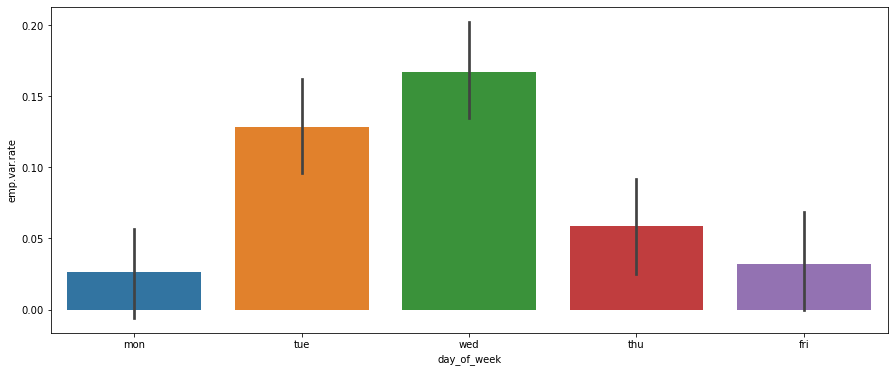

In [222]:
# emp.var.rate with day_of_week
plt.figure(figsize=(15,6))
sns.barplot(x="day_of_week", y="emp.var.rate", data=df)

In [223]:
# People have high emp.var.rate during wednesdays and tuesdays than compared other week days

<AxesSubplot:xlabel='campaign', ylabel='emp.var.rate'>

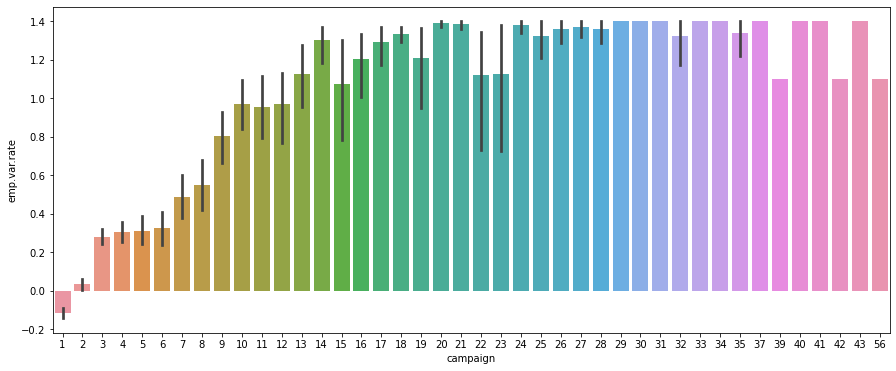

In [224]:
# emp.var.rate with campaign
plt.figure(figsize=(15,6))
sns.barplot(x="campaign", y="emp.var.rate", data=df)

In [225]:
# Emp.var.rate is increasing and decreasing as the campaign increaes

<AxesSubplot:xlabel='pdays', ylabel='emp.var.rate'>

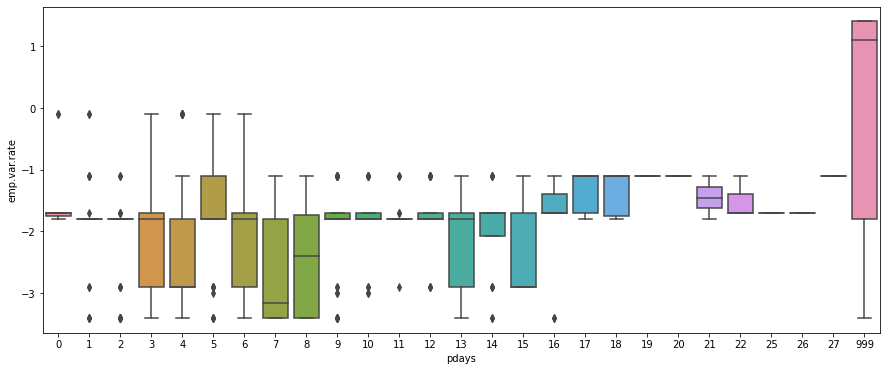

In [226]:
# emp.var.rate with pdyas
plt.figure(figsize=(15,6))
sns.boxplot(x="pdays", y="emp.var.rate", data=df)

In [227]:
 # Emp.var.rate for clients not previously contacted is high than those who were contacted

<AxesSubplot:xlabel='previous', ylabel='emp.var.rate'>

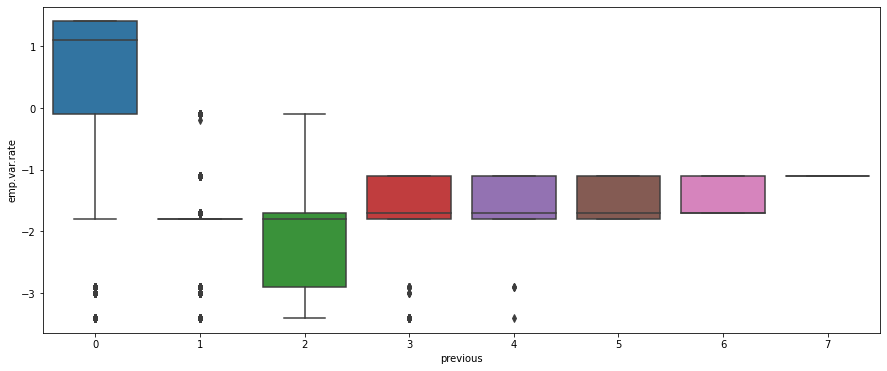

In [228]:
# emp.var.rate with previous
plt.figure(figsize=(15,6))
sns.boxplot(x="previous", y="emp.var.rate", data=df)

In [229]:
# People who have not been contacted before have very high emp.var.rate than those who were contacted earlier

<AxesSubplot:xlabel='poutcome', ylabel='emp.var.rate'>

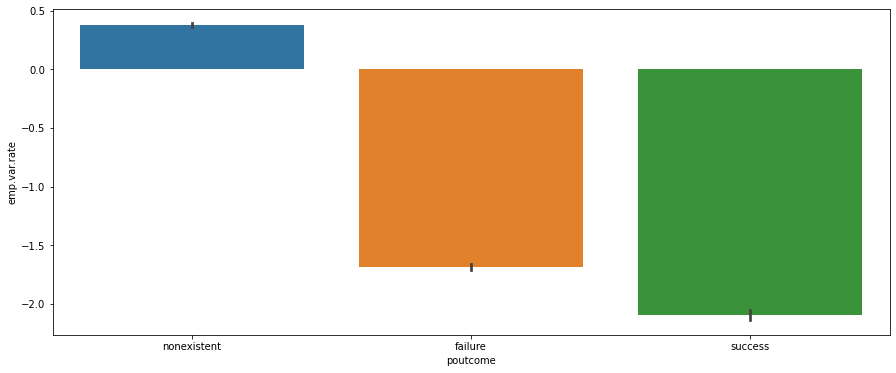

In [230]:
# emp.var.rate with potcome
plt.figure(figsize=(15,6))
sns.barplot(x="poutcome", y="emp.var.rate", data=df)

In [231]:
# People having nonexistent status from previous campaign have high emp.var.rate

<AxesSubplot:xlabel='y', ylabel='emp.var.rate'>

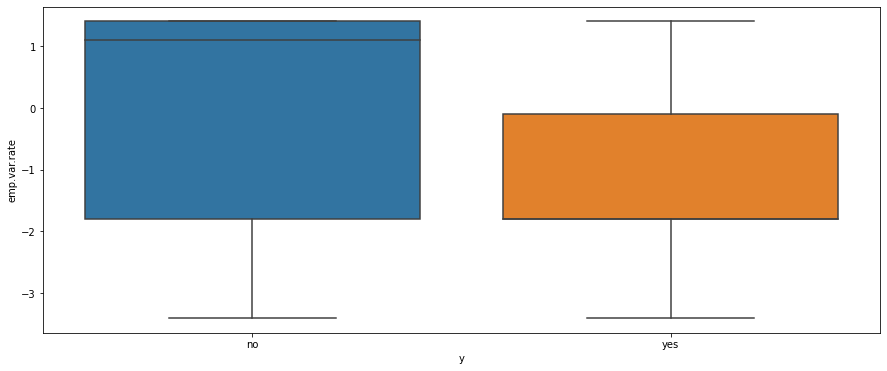

In [232]:
# emp.var.rate with target variable y
plt.figure(figsize=(15,6))
sns.boxplot(x="y", y="emp.var.rate", data=df)

In [233]:
# People with High emp.var.rate are not likely to accept term deposit

# Bivariate Analysis of cons.price.index with all categorical variables

<AxesSubplot:xlabel='job', ylabel='cons.price.idx'>

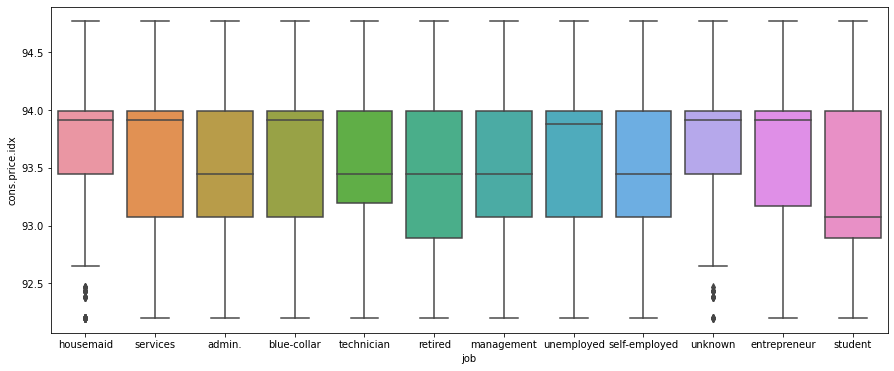

In [234]:
# cons.price.index with job
plt.figure(figsize=(15,6))
sns.boxplot(x="job", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='marital', ylabel='cons.price.idx'>

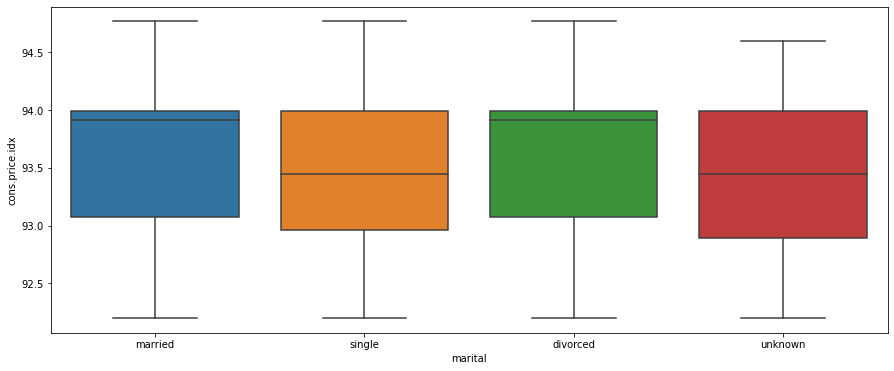

In [235]:
plt.figure(figsize=(15,6))
sns.boxplot(x="marital", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='education', ylabel='cons.price.idx'>

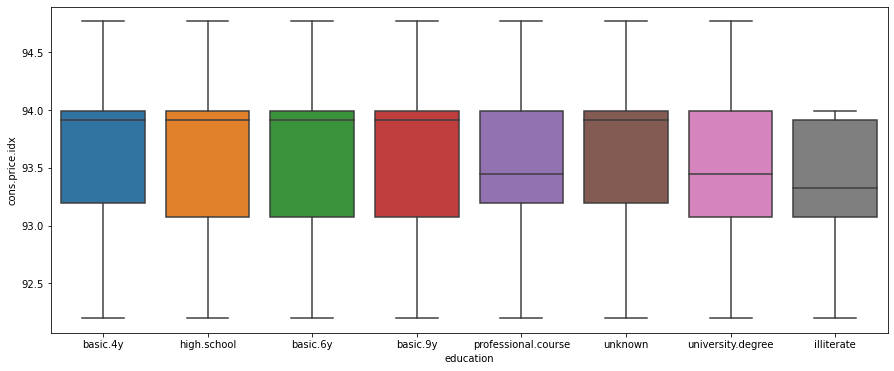

In [236]:
plt.figure(figsize=(15,6))
sns.boxplot(x="education", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='default', ylabel='cons.price.idx'>

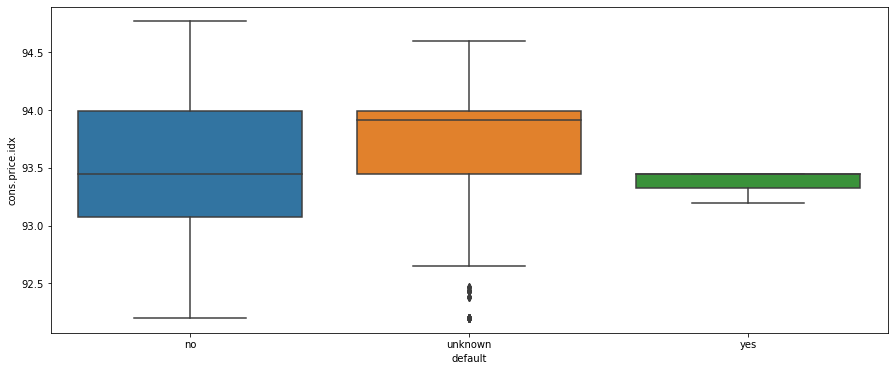

In [237]:
plt.figure(figsize=(15,6))
sns.boxplot(x="default", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='housing', ylabel='cons.price.idx'>

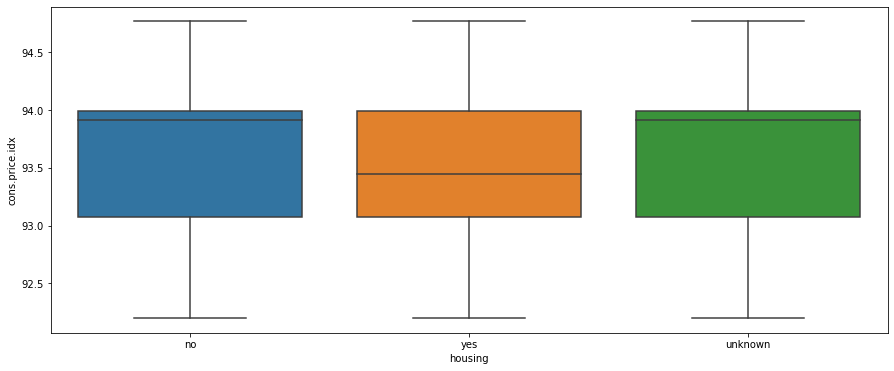

In [238]:
plt.figure(figsize=(15,6))
sns.boxplot(x="housing", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='loan', ylabel='cons.price.idx'>

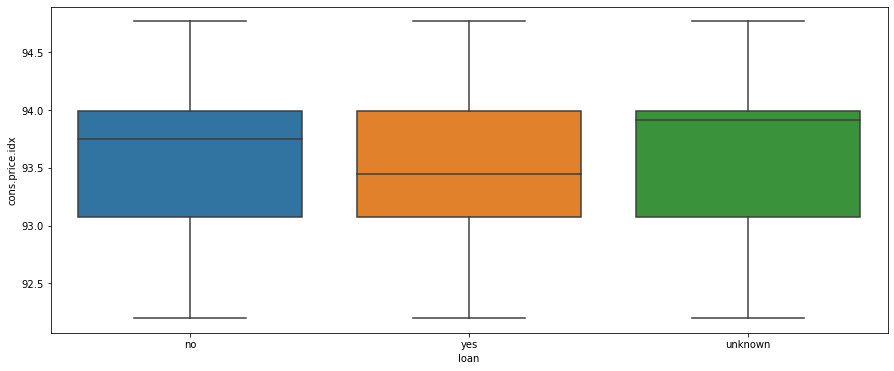

In [239]:
plt.figure(figsize=(15,6))
sns.boxplot(x="loan", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='contact', ylabel='cons.price.idx'>

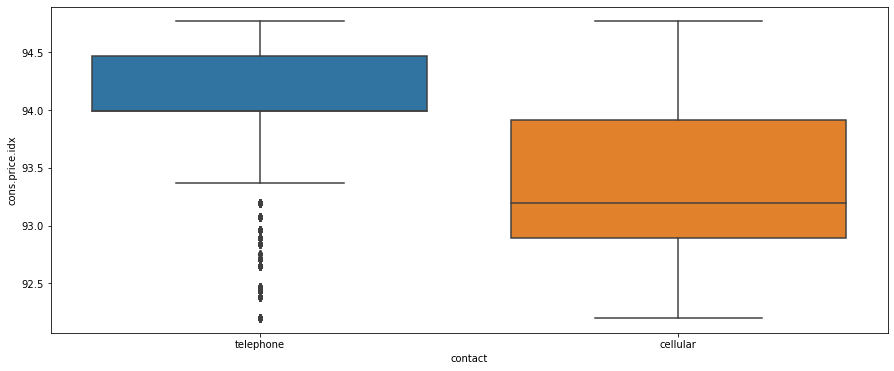

In [240]:
plt.figure(figsize=(15,6))
sns.boxplot(x="contact", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='day_of_week', ylabel='cons.price.idx'>

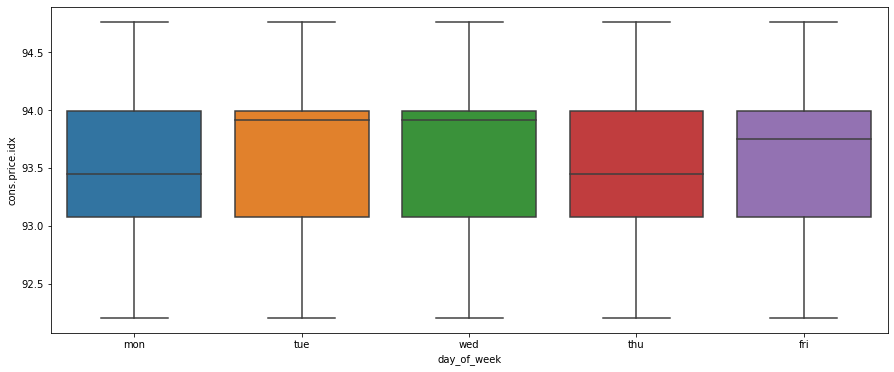

In [241]:
plt.figure(figsize=(15,6))
sns.boxplot(x="day_of_week", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='campaign', ylabel='cons.price.idx'>

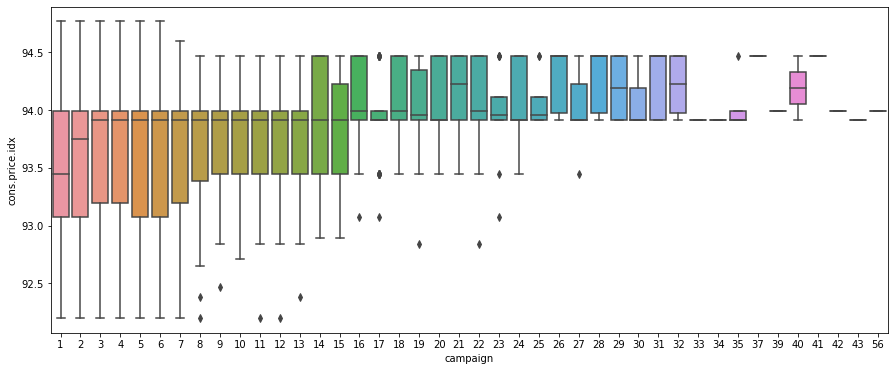

In [242]:
plt.figure(figsize=(15,6))
sns.boxplot(x="campaign", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='pdays', ylabel='cons.price.idx'>

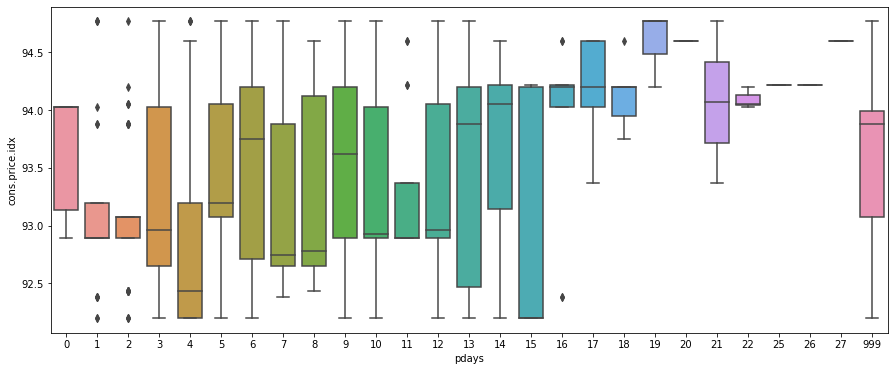

In [243]:
plt.figure(figsize=(15,6))
sns.boxplot(x="pdays", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='previous', ylabel='cons.price.idx'>

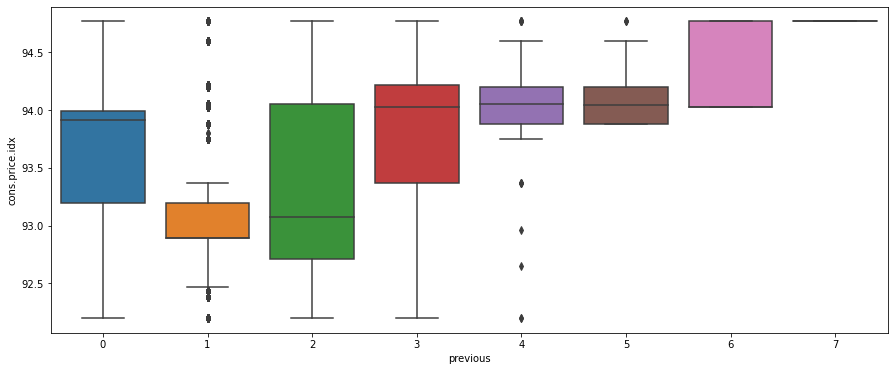

In [244]:
plt.figure(figsize=(15,6))
sns.boxplot(x="previous", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='poutcome', ylabel='cons.price.idx'>

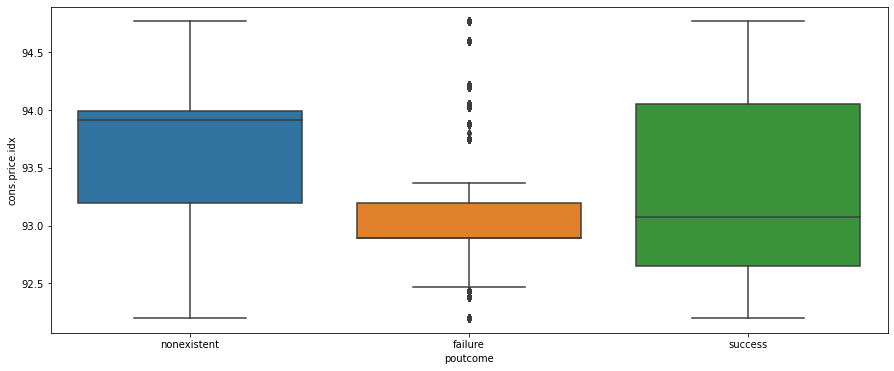

In [245]:
plt.figure(figsize=(15,6))
sns.boxplot(x="poutcome", y="cons.price.idx", data=df)

<AxesSubplot:xlabel='y', ylabel='cons.price.idx'>

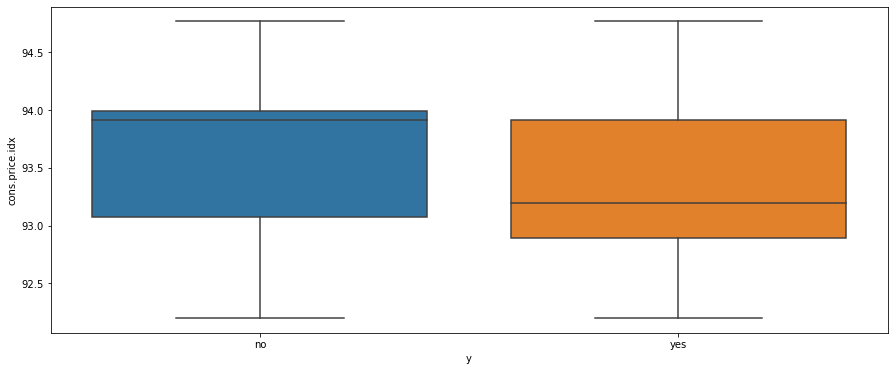

In [246]:
plt.figure(figsize=(15,6))
sns.boxplot(x="y", y="cons.price.idx", data=df)

In [247]:
# People with high cons.price.idx are more likely to not accept deposit

# Bivariate analysis of cons.conf.idx with all the categorical variables

<AxesSubplot:xlabel='job', ylabel='cons.conf.idx'>

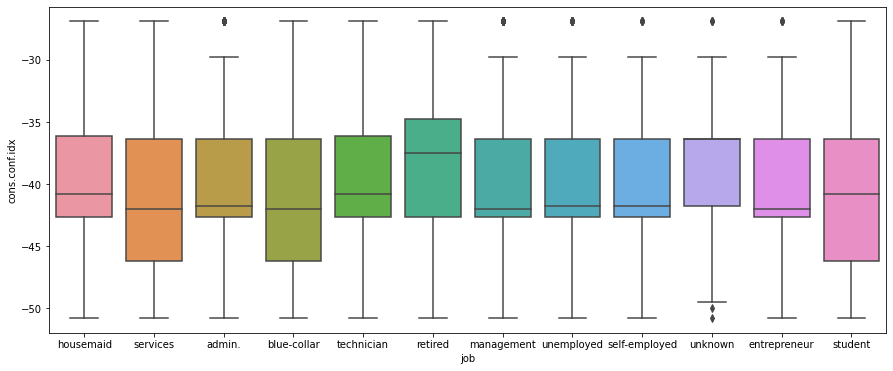

In [248]:
# cons.conf.idx with job
plt.figure(figsize=(15,6))
sns.boxplot(x='job', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='marital', ylabel='cons.conf.idx'>

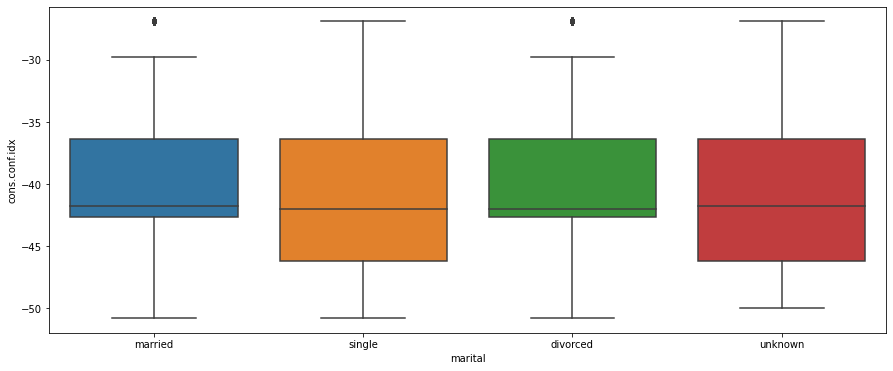

In [249]:
plt.figure(figsize=(15,6))
sns.boxplot(x='marital', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='education', ylabel='cons.conf.idx'>

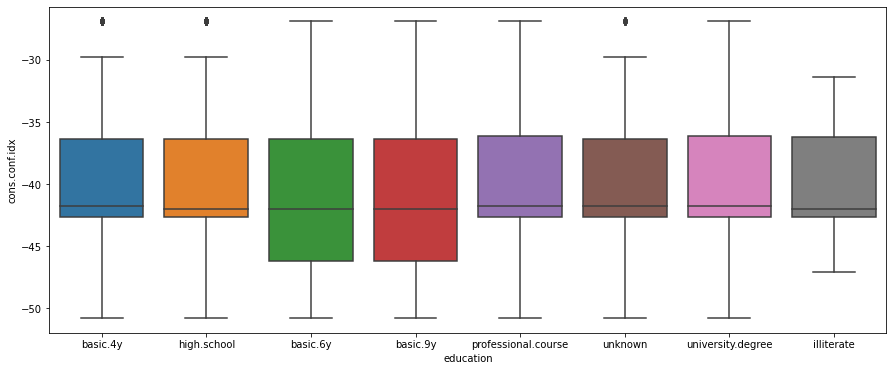

In [250]:
plt.figure(figsize=(15,6))
sns.boxplot(x='education', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='default', ylabel='cons.conf.idx'>

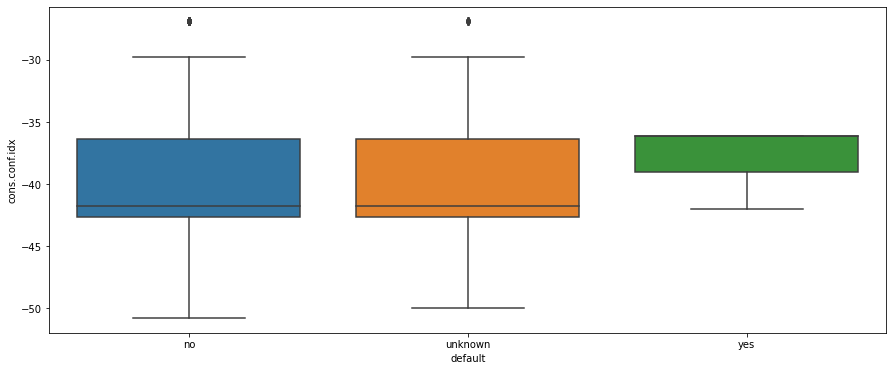

In [251]:
plt.figure(figsize=(15,6))
sns.boxplot(x='default', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='housing', ylabel='cons.conf.idx'>

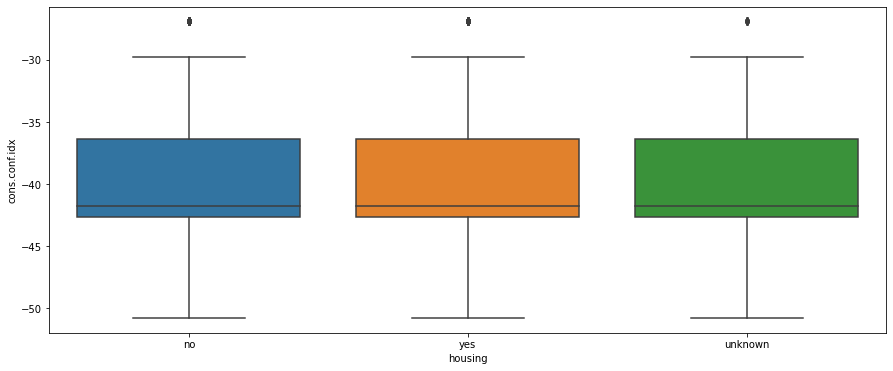

In [252]:
plt.figure(figsize=(15,6))
sns.boxplot(x='housing', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='loan', ylabel='cons.conf.idx'>

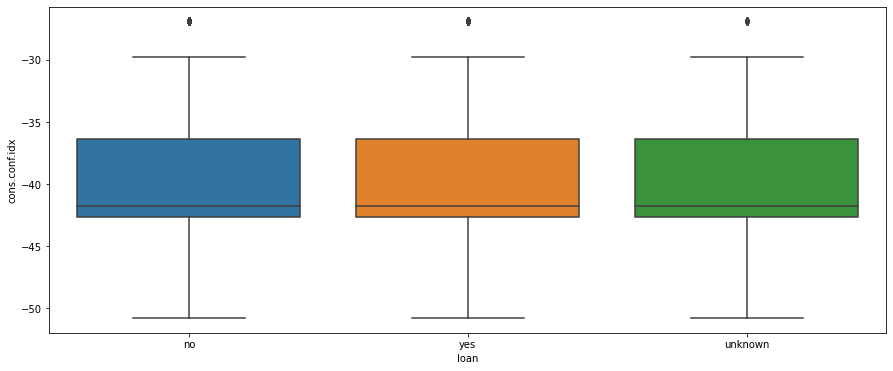

In [253]:
plt.figure(figsize=(15,6))
sns.boxplot(x='loan', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='contact', ylabel='cons.conf.idx'>

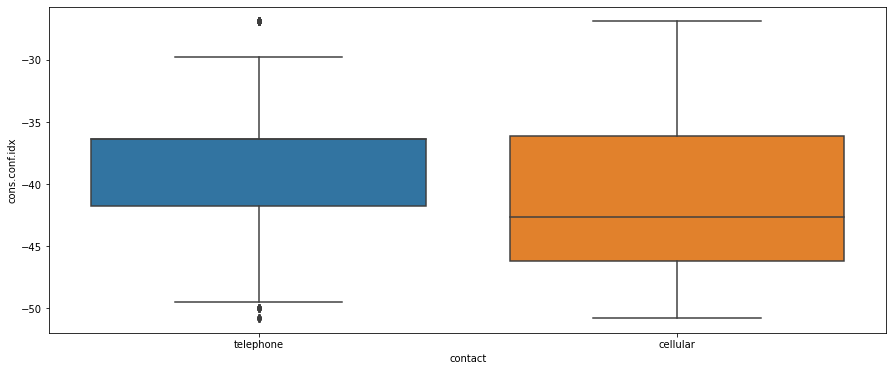

In [254]:
plt.figure(figsize=(15,6))
sns.boxplot(x='contact', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='month', ylabel='cons.conf.idx'>

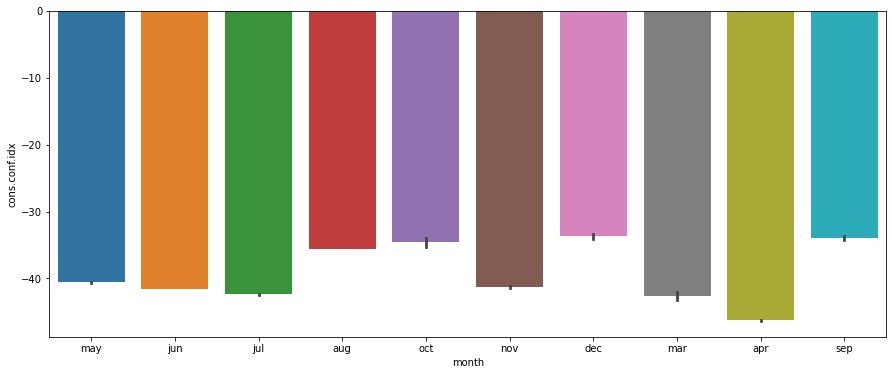

In [255]:
plt.figure(figsize=(15,6))
sns.barplot(x='month', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='day_of_week', ylabel='cons.conf.idx'>

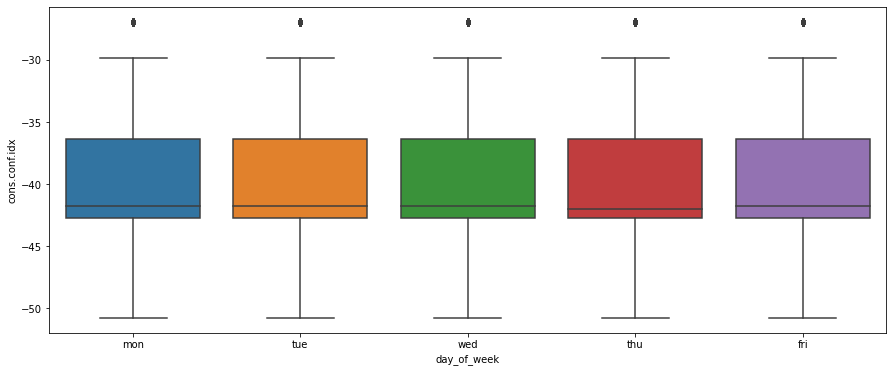

In [256]:
plt.figure(figsize=(15,6))
sns.boxplot(x='day_of_week', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='campaign', ylabel='cons.conf.idx'>

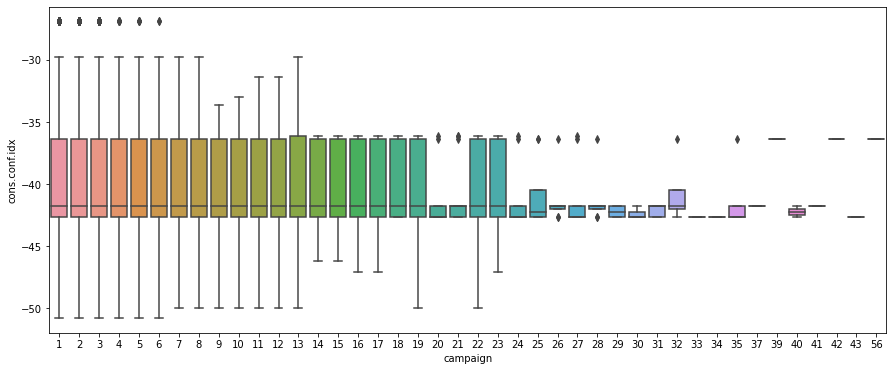

In [257]:
plt.figure(figsize=(15,6))
sns.boxplot(x='campaign', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='pdays', ylabel='cons.conf.idx'>

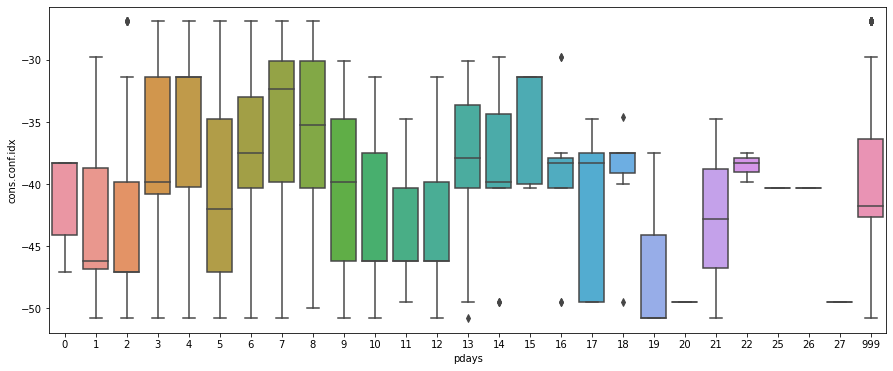

In [258]:
plt.figure(figsize=(15,6))
sns.boxplot(x='pdays', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='previous', ylabel='cons.conf.idx'>

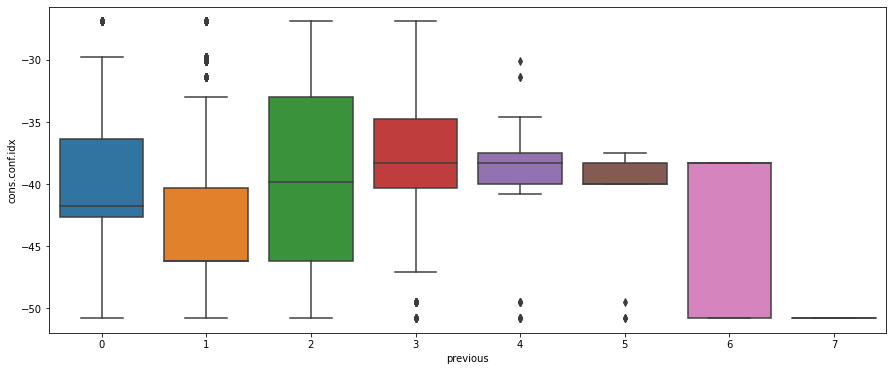

In [259]:
plt.figure(figsize=(15,6))
sns.boxplot(x='previous', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='poutcome', ylabel='cons.conf.idx'>

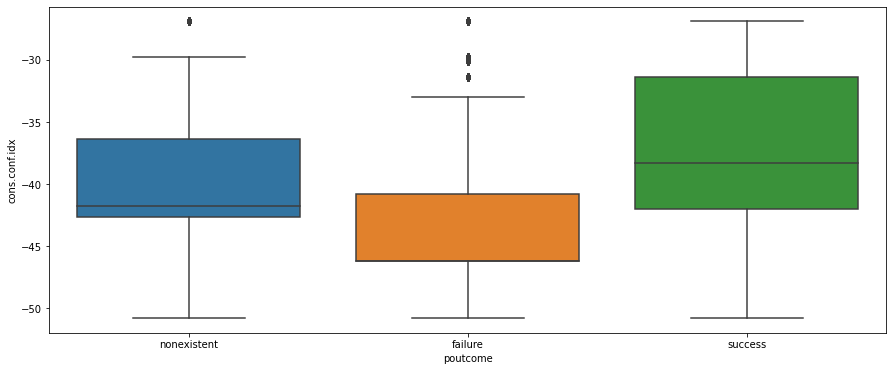

In [260]:
plt.figure(figsize=(15,6))
sns.boxplot(x='poutcome', y="cons.conf.idx", data=df)

<AxesSubplot:xlabel='y', ylabel='cons.conf.idx'>

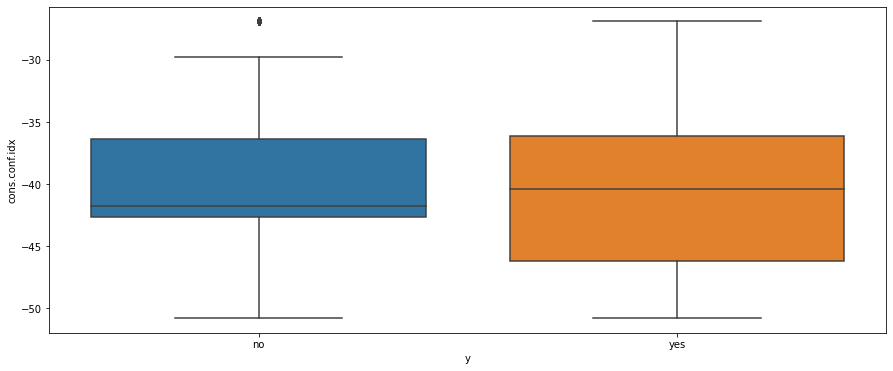

In [261]:
plt.figure(figsize=(15,6))
sns.boxplot(x='y', y="cons.conf.idx", data=df)

In [262]:
# cons.conf.idx does not have impact on the target variable

# Bivariate Analysis of euribor3m with all the categorical variables

<AxesSubplot:xlabel='job', ylabel='euribor3m'>

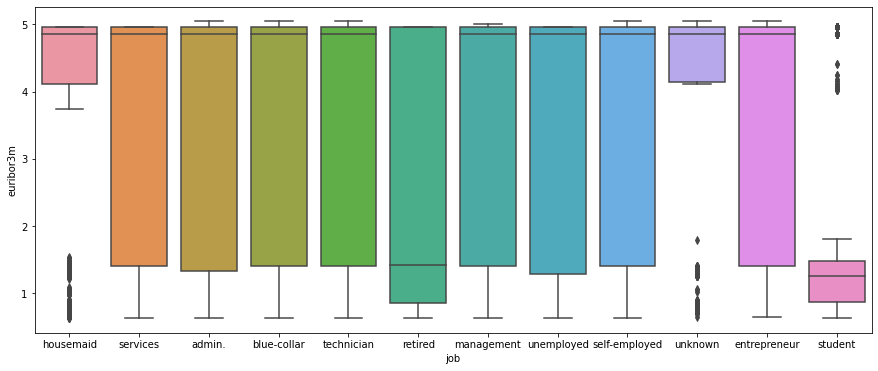

In [263]:
plt.figure(figsize=(15,6))
sns.boxplot(x='job', y="euribor3m", data=df)

<AxesSubplot:xlabel='marital', ylabel='euribor3m'>

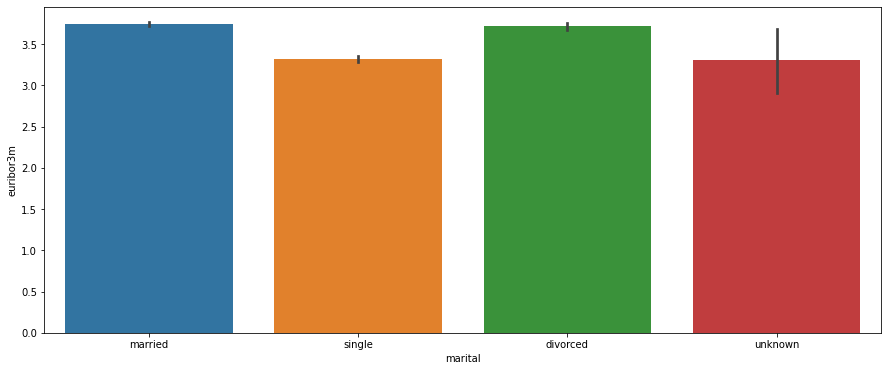

In [264]:
plt.figure(figsize=(15,6))
sns.barplot(x='marital', y="euribor3m", data=df)

<AxesSubplot:xlabel='education', ylabel='euribor3m'>

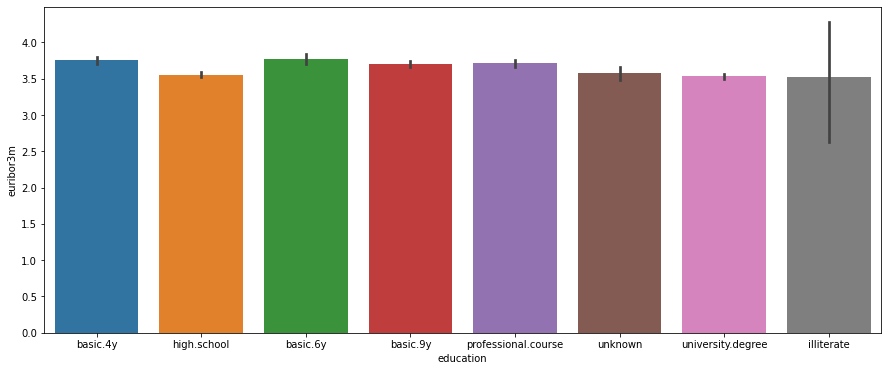

In [265]:
plt.figure(figsize=(15,6))
sns.barplot(x='education', y="euribor3m", data=df)

<AxesSubplot:xlabel='default', ylabel='euribor3m'>

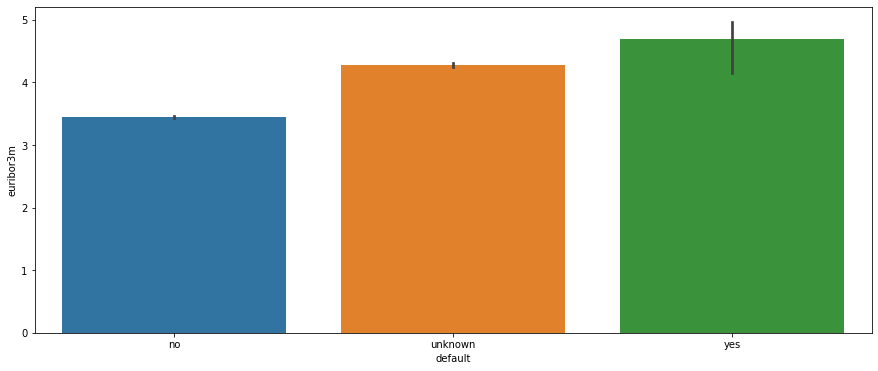

In [266]:
plt.figure(figsize=(15,6))
sns.barplot(x='default', y="euribor3m", data=df)

<AxesSubplot:xlabel='housing', ylabel='euribor3m'>

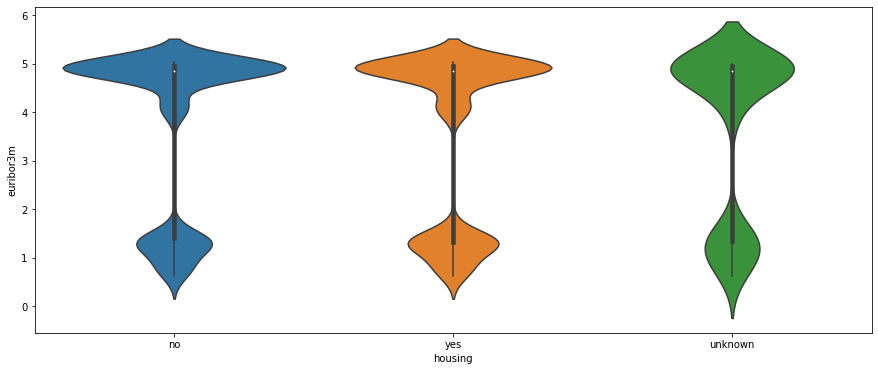

In [267]:
plt.figure(figsize=(15,6))
sns.violinplot(x='housing', y="euribor3m", data=df)

<AxesSubplot:xlabel='loan', ylabel='euribor3m'>

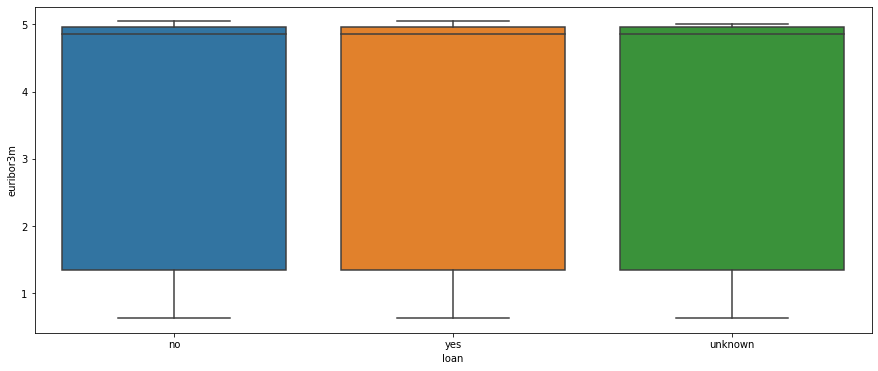

In [268]:
plt.figure(figsize=(15,6))
sns.boxplot(x='loan', y="euribor3m", data=df)

<AxesSubplot:xlabel='contact', ylabel='euribor3m'>

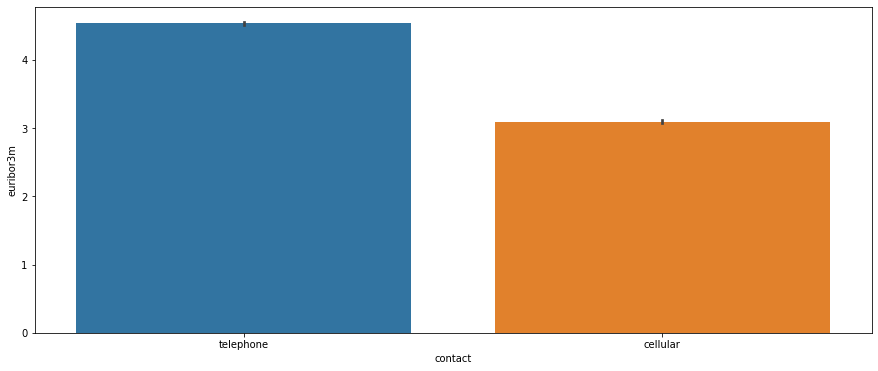

In [269]:
plt.figure(figsize=(15,6))
sns.barplot(x='contact', y="euribor3m", data=df)

<AxesSubplot:xlabel='month', ylabel='euribor3m'>

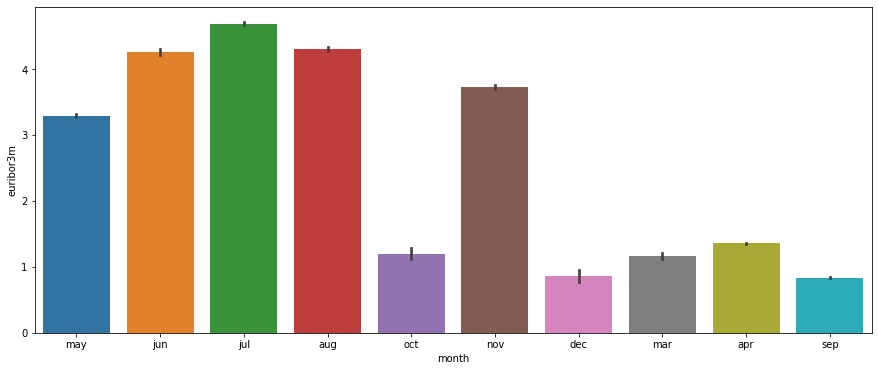

In [270]:
plt.figure(figsize=(15,6))
sns.barplot(x='month', y="euribor3m", data=df)

<AxesSubplot:xlabel='day_of_week', ylabel='euribor3m'>

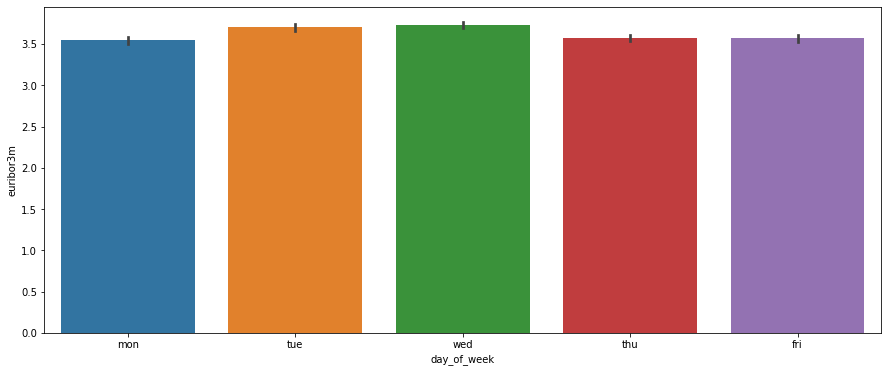

In [271]:
plt.figure(figsize=(15,6))
sns.barplot(x='day_of_week', y="euribor3m", data=df)

<AxesSubplot:xlabel='campaign', ylabel='euribor3m'>

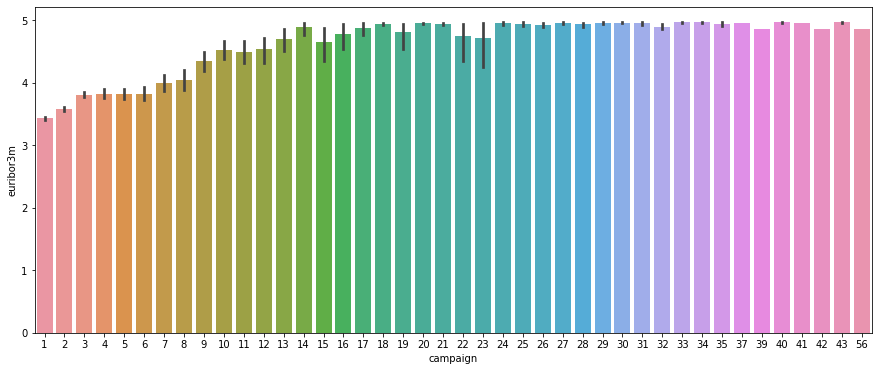

In [272]:
plt.figure(figsize=(15,6))
sns.barplot(x='campaign', y="euribor3m", data=df)

<AxesSubplot:xlabel='pdays', ylabel='euribor3m'>

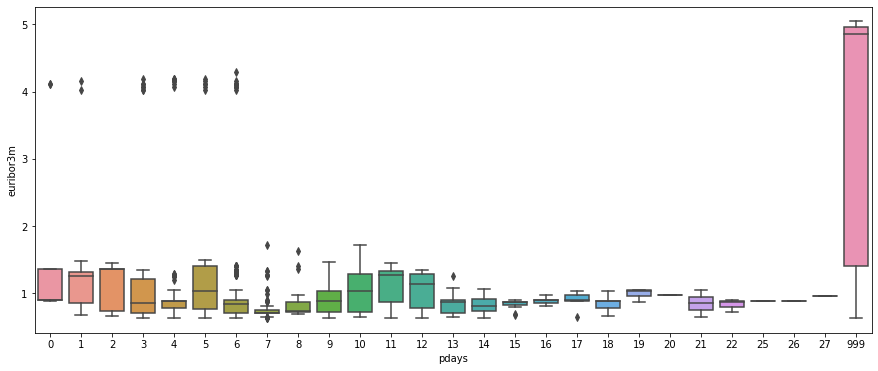

In [273]:
plt.figure(figsize=(15,6))
sns.boxplot(x='pdays', y="euribor3m", data=df)

In [274]:
# Euribor3m rate for people who were not previously contacted is higher than comapred to others

<AxesSubplot:xlabel='previous', ylabel='euribor3m'>

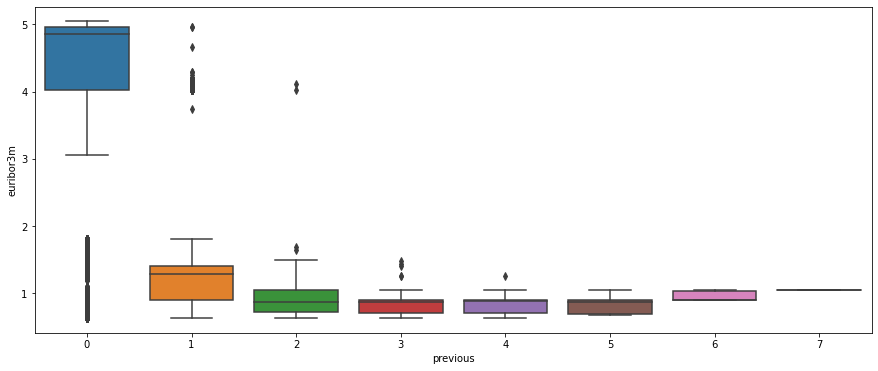

In [275]:
plt.figure(figsize=(15,6))
sns.boxplot(x='previous', y="euribor3m", data=df)

<AxesSubplot:xlabel='poutcome', ylabel='euribor3m'>

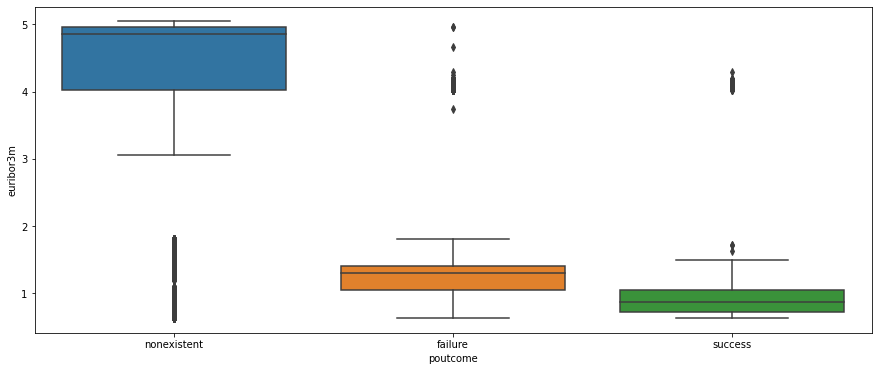

In [276]:
plt.figure(figsize=(15,6))
sns.boxplot(x='poutcome', y="euribor3m", data=df)

In [277]:
# Euribor3m rate for people who were nonexistent  is higher than comapred to others

<AxesSubplot:xlabel='y', ylabel='euribor3m'>

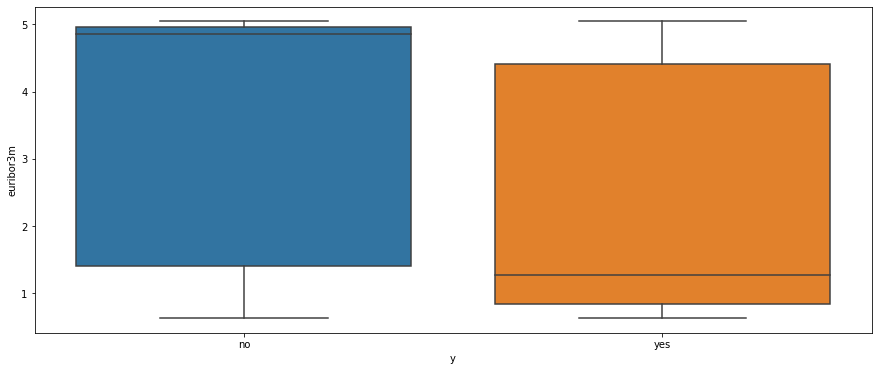

In [278]:
plt.figure(figsize=(15,6))
sns.boxplot(x='y', y="euribor3m", data=df)

In [279]:
# High euriborn3m rate means people are unlikely to accept the deposit

# Bivariate Analysis of nr.employed with all the categorical variables

<AxesSubplot:xlabel='job', ylabel='nr.employed'>

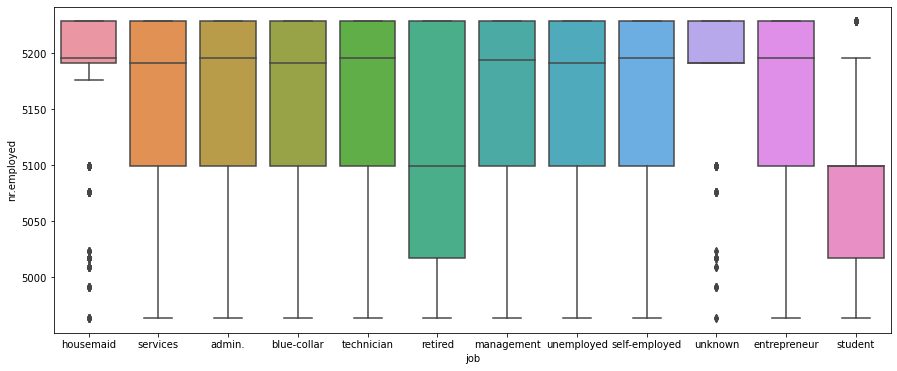

In [280]:
plt.figure(figsize=(15,6))
sns.boxplot(x='job', y="nr.employed", data=df)

<AxesSubplot:xlabel='marital', ylabel='nr.employed'>

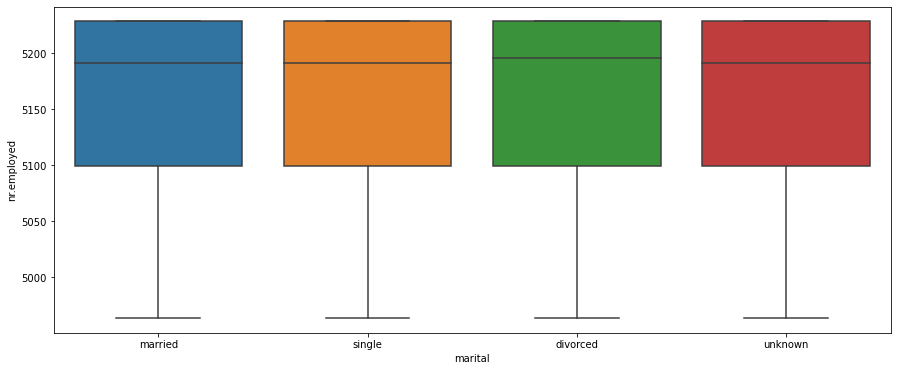

In [281]:
plt.figure(figsize=(15,6))
sns.boxplot(x='marital', y="nr.employed", data=df)

<AxesSubplot:xlabel='education', ylabel='nr.employed'>

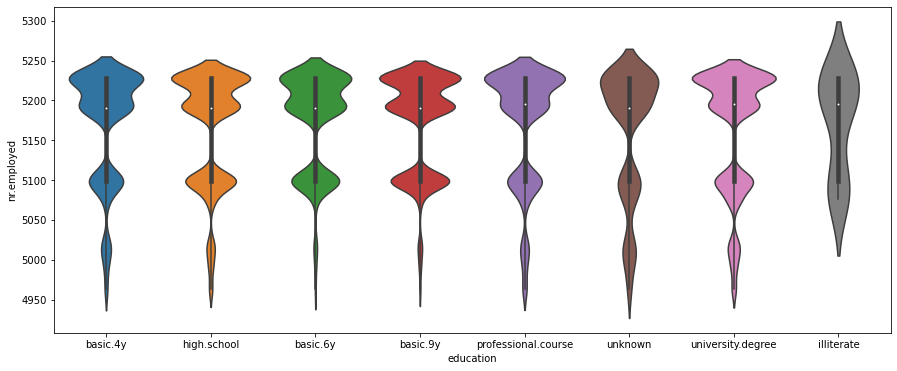

In [282]:
plt.figure(figsize=(15,6))
sns.violinplot(x='education', y="nr.employed", data=df)

<AxesSubplot:xlabel='default', ylabel='nr.employed'>

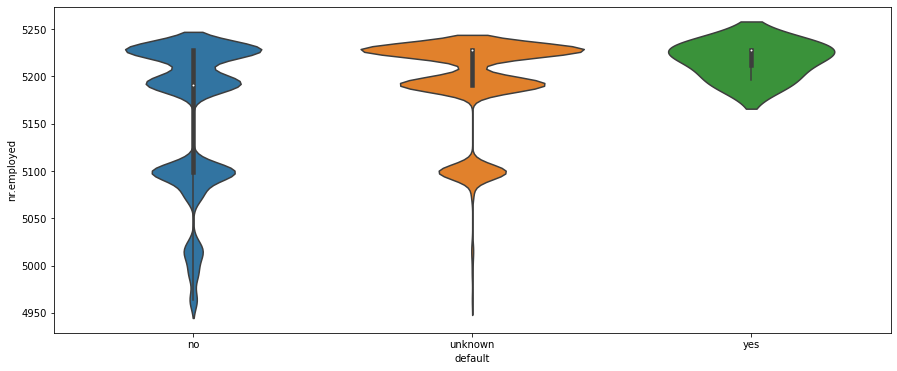

In [283]:
plt.figure(figsize=(15,6))
sns.violinplot(x='default', y="nr.employed", data=df)

<AxesSubplot:xlabel='housing', ylabel='nr.employed'>

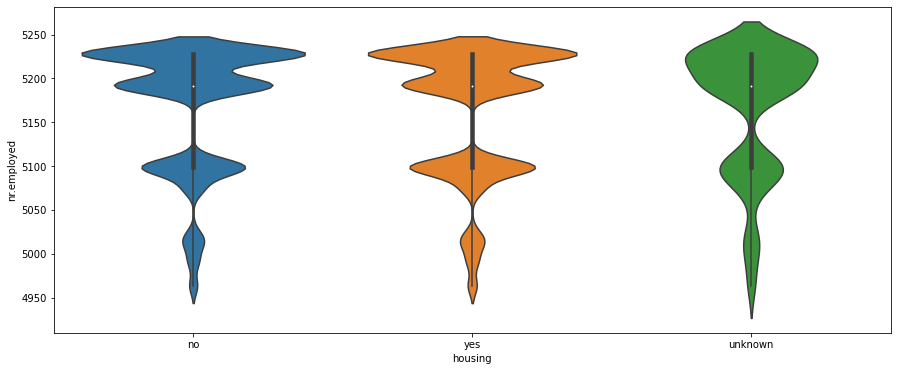

In [284]:
plt.figure(figsize=(15,6))
sns.violinplot(x='housing', y="nr.employed", data=df)

<AxesSubplot:xlabel='loan', ylabel='nr.employed'>

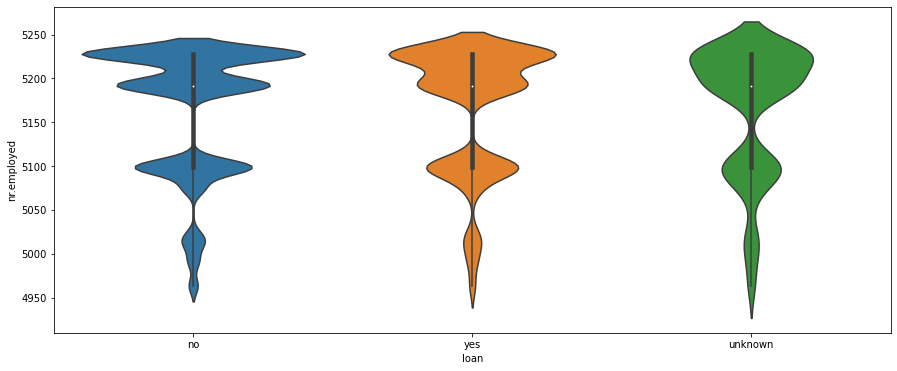

In [285]:
plt.figure(figsize=(15,6))
sns.violinplot(x='loan', y="nr.employed", data=df)

<AxesSubplot:xlabel='contact', ylabel='nr.employed'>

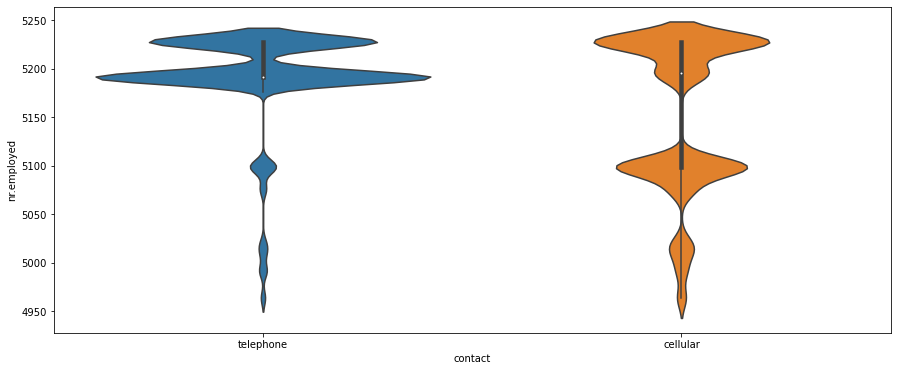

In [286]:
plt.figure(figsize=(15,6))
sns.violinplot(x='contact', y="nr.employed", data=df)

<AxesSubplot:xlabel='day_of_week', ylabel='nr.employed'>

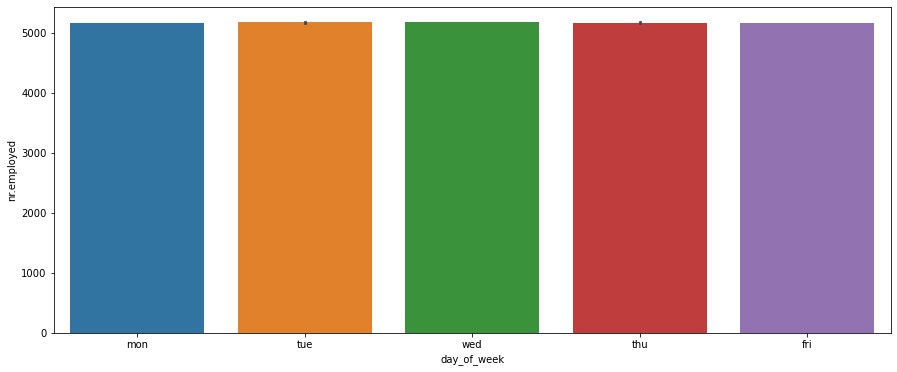

In [287]:
plt.figure(figsize=(15,6))
sns.barplot(x='day_of_week', y="nr.employed", data=df)

<AxesSubplot:xlabel='campaign', ylabel='nr.employed'>

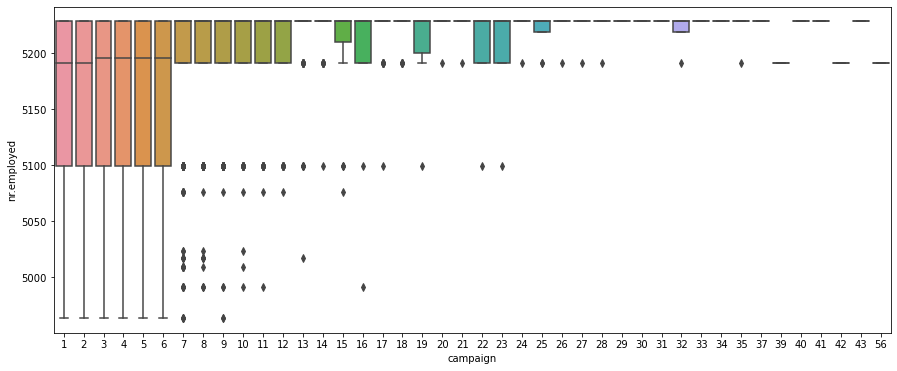

In [288]:
plt.figure(figsize=(15,6))
sns.boxplot(data=df, x="campaign", y="nr.employed")

<AxesSubplot:xlabel='pdays', ylabel='nr.employed'>

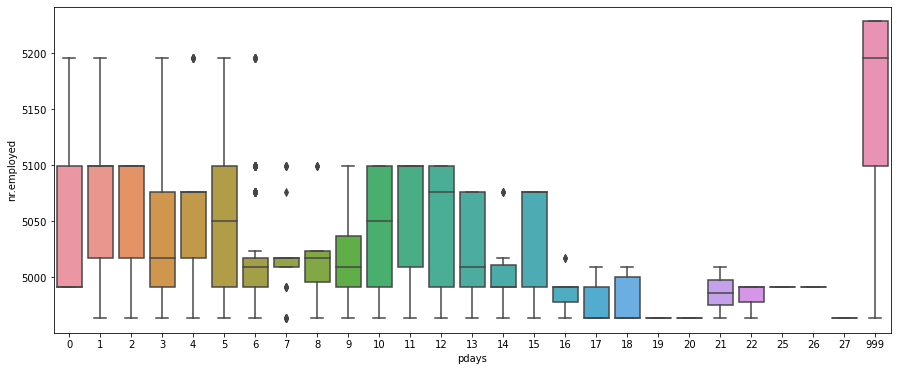

In [289]:
plt.figure(figsize=(15,6))
sns.boxplot(data=df, x="pdays", y="nr.employed")

<AxesSubplot:xlabel='previous', ylabel='nr.employed'>

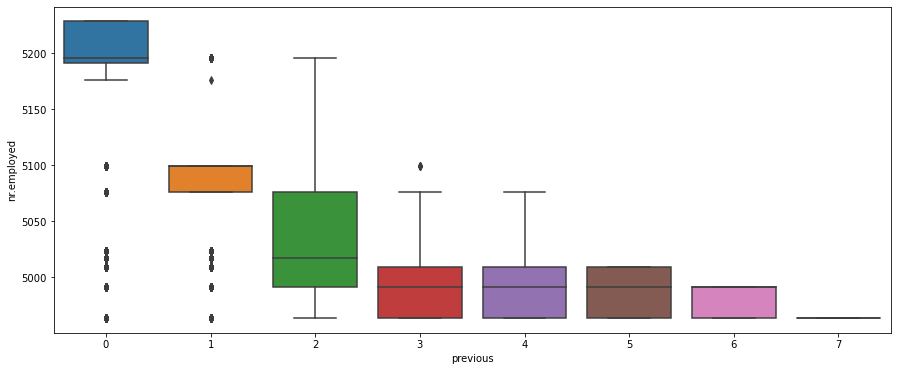

In [290]:
plt.figure(figsize=(15,6))
sns.boxplot(data=df, x="previous", y="nr.employed")

<AxesSubplot:xlabel='poutcome', ylabel='nr.employed'>

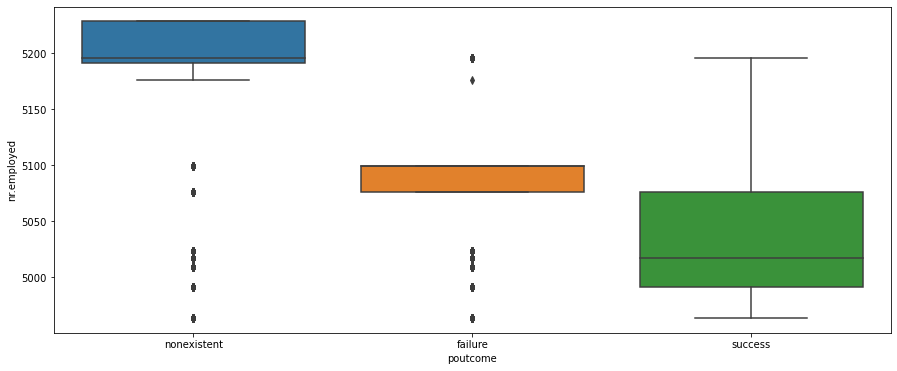

In [291]:
plt.figure(figsize=(15,6))
sns.boxplot(data=df, x="poutcome", y="nr.employed")

<AxesSubplot:xlabel='y', ylabel='nr.employed'>

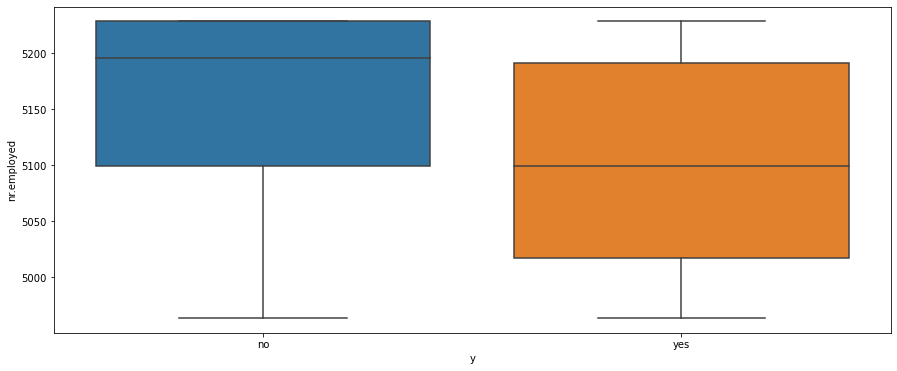

In [292]:
plt.figure(figsize=(15,6))
sns.boxplot(data=df, x="y", y="nr.employed")

In [293]:
df_num = df.select_dtypes(include = [np.number])
df_num.columns

Index(['age', 'duration', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed'],
      dtype='object')

In [294]:
df_cat = df.select_dtypes(include = object)
df_cat.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome',
       'y'],
      dtype='object')

In [295]:
from sklearn.preprocessing import StandardScaler

In [296]:
scale = StandardScaler()
num_scaled = scale.fit_transform(df_num)
df_num_scaled = pd.DataFrame(num_scaled, columns = df_num.columns)
df_num_scaled.head()

,age,duration,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,1.533034,0.010471,0.648092,0.722722,0.886447,0.71246,0.33168
1,1.628993,-0.421501,0.648092,0.722722,0.886447,0.71246,0.33168
2,-0.290186,-0.124520,0.648092,0.722722,0.886447,0.71246,0.33168
3,-0.002309,-0.413787,0.648092,0.722722,0.886447,0.71246,0.33168
4,1.533034,0.187888,0.648092,0.722722,0.886447,0.71246,0.33168


## Feature Engineering


In [297]:
# Converting categorical target variable into binary values
d = {"no": 0, "yes": 1}
df_cat["y"] = df_cat["y"].map(d)
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,0
1,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,0
2,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,0
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,0
4,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,0


In [298]:
# Converting housing and loan variable into binary values
d = {"no": 0, "yes": 1, "unknown": 2}
df_cat["housing"] = df_cat["housing"].map(d)
df_cat["loan"] = df_cat["loan"].map(d)
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y
0,housemaid,married,basic.4y,no,0,0,telephone,may,mon,1,999,0,nonexistent,0
1,services,married,high.school,unknown,0,0,telephone,may,mon,1,999,0,nonexistent,0
2,services,married,high.school,no,1,0,telephone,may,mon,1,999,0,nonexistent,0
3,admin.,married,basic.6y,no,0,0,telephone,may,mon,1,999,0,nonexistent,0
4,services,married,high.school,no,0,1,telephone,may,mon,1,999,0,nonexistent,0


In [299]:
df.housing.value_counts()

yes        21576
no         18622
unknown      990
Name: housing, dtype: int64

In [300]:
# Ordinal encoding for default: since it has 3 values..
# import the OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder

orderencoding = OrdinalEncoder(categories = [['no','yes', 'unknown']])
df_cat['Order_default'] = orderencoding.fit_transform(df_cat['default'].values.reshape(-1,1))
df_cat.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y,Order_default
0,housemaid,married,basic.4y,no,0,0,telephone,may,mon,1,999,0,nonexistent,0,0.0
1,services,married,high.school,unknown,0,0,telephone,may,mon,1,999,0,nonexistent,0,2.0
2,services,married,high.school,no,1,0,telephone,may,mon,1,999,0,nonexistent,0,0.0
3,admin.,married,basic.6y,no,0,0,telephone,may,mon,1,999,0,nonexistent,0,0.0
4,services,married,high.school,no,0,1,telephone,may,mon,1,999,0,nonexistent,0,0.0


In [301]:
df_cat.drop("default",inplace=True,axis=1)
df_cat.head()

,job,marital,education,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,y,Order_default
0,housemaid,married,basic.4y,0,0,telephone,may,mon,1,999,0,nonexistent,0,0.0
1,services,married,high.school,0,0,telephone,may,mon,1,999,0,nonexistent,0,2.0
2,services,married,high.school,1,0,telephone,may,mon,1,999,0,nonexistent,0,0.0
3,admin.,married,basic.6y,0,0,telephone,may,mon,1,999,0,nonexistent,0,0.0
4,services,married,high.school,0,1,telephone,may,mon,1,999,0,nonexistent,0,0.0


In [302]:
# Performing Label encoder for contact,marital and poutcome.
# import the LabelEncoder
from sklearn.preprocessing import LabelEncoder

labelencoder = LabelEncoder()

df_cat['Label_contact'] = labelencoder.fit_transform(df_cat.contact)
df_cat['Label_poutcome'] = labelencoder.fit_transform(df_cat.poutcome)
df_cat['Label_marital'] = labelencoder.fit_transform(df_cat.marital)

df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [303]:
# droping duplicate column
df_cat.drop("contact",inplace=True,axis=1)
df_cat.drop("poutcome",inplace=True,axis=1)
df_cat.drop("marital",inplace=True,axis=1)
df_cat.shape

(41188, 14)

In [304]:
# Encoding 999 in pdays feature( i.e clients who haven't been contacted for the previous campaign) into 0
df_cat.loc[df['pdays'] == 999, 'pdays'] = 0

In [305]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [306]:
# previous: Since pdays and previous features are correlated
df_cat.previous = df_cat.previous.apply(lambda x: 1 if x > 0 else 0)
df_cat.head()

,job,education,housing,loan,month,day_of_week,campaign,pdays,previous,y,Order_default,Label_contact,Label_poutcome,Label_marital
0,housemaid,basic.4y,0,0,may,mon,1,0,0,0,0.0,1,1,1
1,services,high.school,0,0,may,mon,1,0,0,0,2.0,1,1,1
2,services,high.school,1,0,may,mon,1,0,0,0,0.0,1,1,1
3,admin.,basic.6y,0,0,may,mon,1,0,0,0,0.0,1,1,1
4,services,high.school,0,1,may,mon,1,0,0,0,0.0,1,1,1


In [307]:
# encoding month and day_of_week
print(list(df_cat.month.unique()))
print(list(df_cat.day_of_week.unique()))

['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'mar', 'apr', 'sep']
['mon', 'tue', 'wed', 'thu', 'fri']


In [308]:
month_dict={'may':5,'jul':7,'aug':8,'jun':6,'nov':11,'apr':4,'oct':10,'sep':9,'mar':3,'dec':12}
df_cat['month']= df_cat['month'].map(month_dict) 

day_dict={'thu':5,'mon':2,'wed':4,'tue':3,'fri':6}
df_cat['day_of_week']= df_cat['day_of_week'].map(day_dict) 
df_cat.loc[:, ['month', 'day_of_week']].head()

,month,day_of_week
0,5,2
1,5,2
2,5,2
3,5,2
4,5,2


In [309]:
# Category clubbing for education
# # Clubbing to middle school
lst=['basic.9y','basic.6y','basic.4y']
for i in lst:
    df_cat.loc[df['education'] == i, 'education'] = "middle.school"

df_cat['education'].value_counts()

middle.school          12513
university.degree      12168
high.school             9515
professional.course     5243
unknown                 1731
illiterate                18
Name: education, dtype: int64

In [310]:
df_cat.head()

,job,education,housing,loan,month,day_of_week,campaign,pdays,previous,y,Order_default,Label_contact,Label_poutcome,Label_marital
0,housemaid,middle.school,0,0,5,2,1,0,0,0,0.0,1,1,1
1,services,high.school,0,0,5,2,1,0,0,0,2.0,1,1,1
2,services,high.school,1,0,5,2,1,0,0,0,0.0,1,1,1
3,admin.,middle.school,0,0,5,2,1,0,0,0,0.0,1,1,1
4,services,high.school,0,1,5,2,1,0,0,0,0.0,1,1,1


In [311]:
# frequency encoding on 'job'
# size of each category        
encoding = df_cat.groupby('job').size()

# get frequency of each category
encoding = encoding/len(df)

df_cat['Freq_job'] = df.job.map(encoding)*100

# print first five rows of the data
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [312]:
# frequency encoding on 'education'
# size of each category
encoding = df_cat.groupby('education').size()

# get frequency of each category
encoding = encoding/len(df)

df_cat['Freq_education'] = df_cat.education.map(encoding)*100

# print first five rows of the data
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [313]:
# droping duplicate column
df_cat.drop("job",inplace=True,axis=1)
df_cat.drop("education",inplace=True,axis=1)
df_cat.head()

,housing,loan,month,day_of_week,campaign,pdays,previous,y,Order_default,Label_contact,Label_poutcome,Label_marital,Freq_job,Freq_education
0,0,0,5,2,1,0,0,0,0.0,1,1,1,2.573565,30.380208
1,0,0,5,2,1,0,0,0,2.0,1,1,1,9.636302,23.101389
2,1,0,5,2,1,0,0,0,0.0,1,1,1,9.636302,23.101389
3,0,0,5,2,1,0,0,0,0.0,1,1,1,25.303486,30.380208
4,0,1,5,2,1,0,0,0,0.0,1,1,1,9.636302,23.101389


In [314]:
df_cat_dup = df_cat[df_cat.duplicated(keep='last')]
df_cat_dup

df_cat_dup.shape

(13511, 14)

In [315]:
df = df.drop_duplicates()
df.shape

(41176, 21)

In [316]:
df_cat.dtypes

housing             int64
loan                int64
month               int64
day_of_week         int64
campaign           object
pdays              object
previous            int64
y                   int64
Order_default     float64
Label_contact       int32
Label_poutcome      int32
Label_marital       int32
Freq_job          float64
Freq_education    float64
dtype: object

In [317]:
df_cat = df_cat.astype({'campaign': int, 'pdays': int, 'Order_default': int})
df_cat.dtypes

housing             int64
loan                int64
month               int64
day_of_week         int64
campaign            int32
pdays               int32
previous            int64
y                   int64
Order_default       int32
Label_contact       int32
Label_poutcome      int32
Label_marital       int32
Freq_job          float64
Freq_education    float64
dtype: object

In [318]:
df = pd.concat([df_num_scaled, df_cat], axis = 1)
df.head()

,age,duration,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,housing,loan,month,day_of_week,campaign,pdays,previous,y,Order_default,Label_contact,Label_poutcome,Label_marital,Freq_job,Freq_education
0,1.533034,0.010471,0.648092,0.722722,0.886447,0.71246,0.33168,0,0,5,2,1,0,0,0,0,1,1,1,2.573565,30.380208
1,1.628993,-0.421501,0.648092,0.722722,0.886447,0.71246,0.33168,0,0,5,2,1,0,0,0,2,1,1,1,9.636302,23.101389
2,-0.290186,-0.124520,0.648092,0.722722,0.886447,0.71246,0.33168,1,0,5,2,1,0,0,0,0,1,1,1,9.636302,23.101389
3,-0.002309,-0.413787,0.648092,0.722722,0.886447,0.71246,0.33168,0,0,5,2,1,0,0,0,0,1,1,1,25.303486,30.380208
4,1.533034,0.187888,0.648092,0.722722,0.886447,0.71246,0.33168,0,1,5,2,1,0,0,0,0,1,1,1,9.636302,23.101389


In [319]:
df.skew()

age               0.784697
duration          3.263141
emp.var.rate     -0.724096
cons.price.idx   -0.230888
cons.conf.idx     0.303180
euribor3m        -0.709188
nr.employed      -1.044262
housing           0.167330
loan              2.229630
month             0.851510
day_of_week       0.000552
campaign          4.762507
pdays             7.939537
previous          2.116792
y                 2.450330
Order_default     1.433224
Label_contact     0.559720
Label_poutcome   -0.877789
Label_marital    -0.057136
Freq_job         -0.418361
Freq_education   -1.440890
dtype: float64

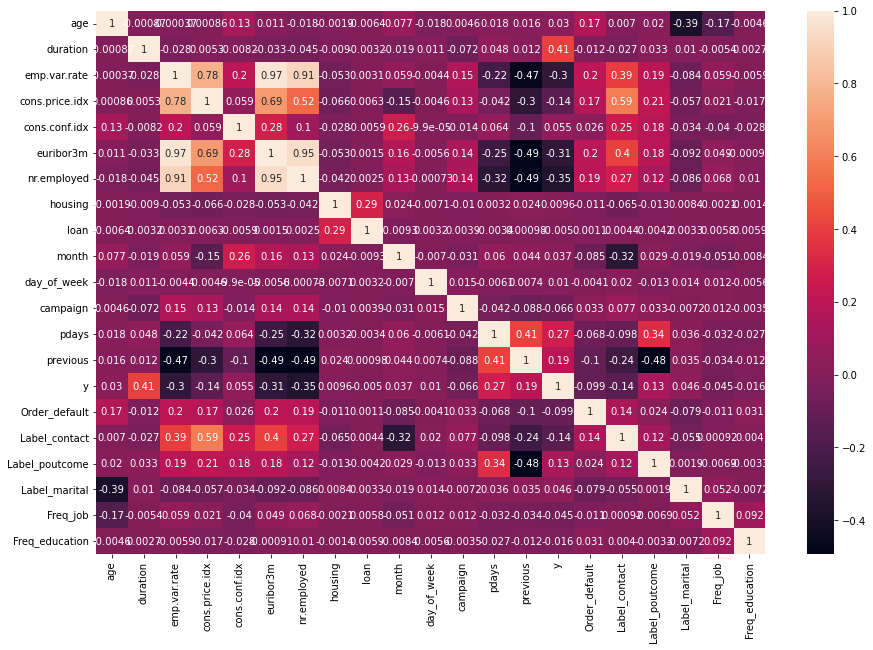

In [320]:
plt.rcParams["figure.figsize"]=[15,10]
sns.heatmap(df.corr(), annot = True)
plt.show()

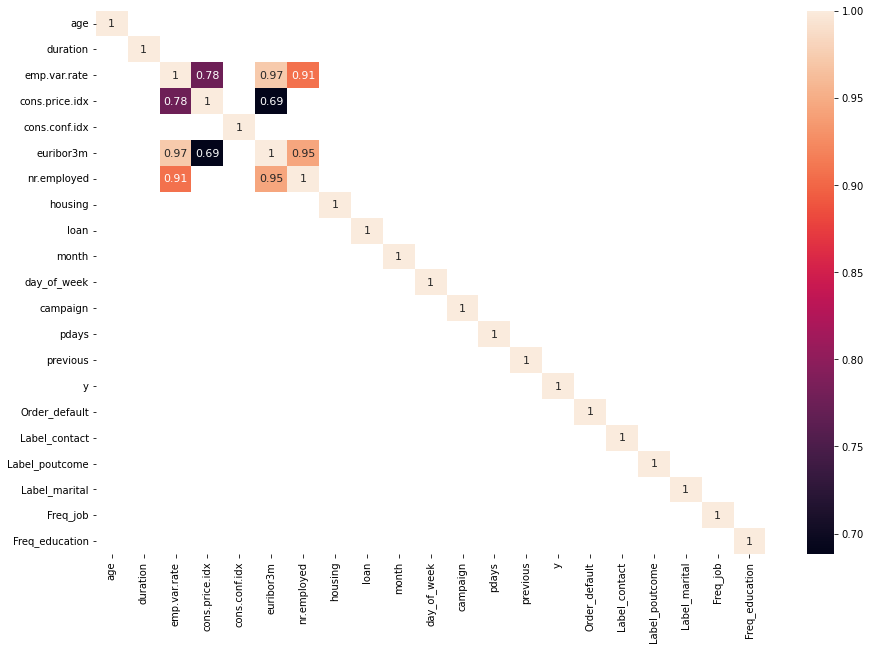

In [321]:
# to remove insignificant variables.
sns.heatmap(df.corr()[np.abs(df.corr()) > 0.6], annot = True, annot_kws = {"size": 11})
plt.show()

In [322]:
# The above heatmap, show the variables having a strong positive/negative correlation. The variables with dark blue shade represent the strong positive correlation and the ones with lighter shade represent the strong negative correlation.

In [323]:
df = df.drop(['cons.price.idx', 'euribor3m', 'nr.employed'], axis = 1)

In [324]:
df.head()

,age,duration,emp.var.rate,cons.conf.idx,housing,loan,month,day_of_week,campaign,pdays,previous,y,Order_default,Label_contact,Label_poutcome,Label_marital,Freq_job,Freq_education
0,1.533034,0.010471,0.648092,0.886447,0,0,5,2,1,0,0,0,0,1,1,1,2.573565,30.380208
1,1.628993,-0.421501,0.648092,0.886447,0,0,5,2,1,0,0,0,2,1,1,1,9.636302,23.101389
2,-0.290186,-0.124520,0.648092,0.886447,1,0,5,2,1,0,0,0,0,1,1,1,9.636302,23.101389
3,-0.002309,-0.413787,0.648092,0.886447,0,0,5,2,1,0,0,0,0,1,1,1,25.303486,30.380208
4,1.533034,0.187888,0.648092,0.886447,0,1,5,2,1,0,0,0,0,1,1,1,9.636302,23.101389


### Base Model

In [325]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

# Seperating independent and target variables
df_x = df.drop(['y'],axis=1)
print("shape of x:",df_x.shape)
df_y = df['y']
print("shape of y:",df_y.shape)

# add a constant column to the dataframe
df_x = sm.add_constant(df_x)

# let us now split the dataset into train & test
# test_size: the proportion of data to be included in the testing set
X_train, X_test, Y_train, Y_test = train_test_split(df_x, df_y, test_size = 0.2, random_state=1)

# print the shape of 'x_train'
print("X_train ",X_train.shape)

# print the shape of 'x_test'
print("X_test ",X_test.shape)

# print the shape of 'y_train'
print("Y_train ",Y_train.shape)

# print the shape of 'y_test'
print("Y_test ",Y_test.shape)

shape of x: (41188, 17)
shape of y: (41188,)
X_train  (32950, 18)
X_test  (8238, 18)
Y_train  (32950,)
Y_test  (8238,)


In [326]:
#Data Splitting Libraries
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score,classification_report
#Classification Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)

In [327]:
logmodel = LogisticRegression() 
logmodel.fit(X_train,Y_train)
logpred = logmodel.predict(X_test)


print(confusion_matrix(Y_test, logpred))
print(round(accuracy_score(Y_test, logpred),2)*100)
LOGCV = (cross_val_score(logmodel, X_train, Y_train, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

[[7105  189]
 [ 581  363]]
91.0


- Thus we got 91% accuracy for the base model without treating class imabalance

**Class Imbalance**

In [328]:
from imblearn.over_sampling import SMOTE

In [329]:
!pip install imbalanced-learn

Defaulting to user installation because normal site-packages is not writeable


In [330]:
!pip install imblearn

Defaulting to user installation because normal site-packages is not writeable


In [331]:
smt=SMOTE(sampling_strategy='minority',random_state=42)

In [332]:
x_smt,y_smt=smt.fit_resample(df_x,df_y)

In [333]:
y_smt.value_counts()

0    36548
1    36548
Name: y, dtype: int64

In [334]:
x_train_smt,x_test_smt,y_train_smt,y_test_smt=train_test_split(x_smt,y_smt,test_size=0.2,random_state=16)

In [335]:
logis=LogisticRegression()
logis.fit(x_train_smt,y_train_smt)
logis_pred=logis.predict(x_test_smt)
y_test_smt
accuracy_smt=accuracy_score(y_test_smt,logis_pred)
accuracy_smt

0.8748974008207935

**Building a base model after treating Class Imabalance**

**Logistic Regression Model**

In [336]:
from sklearn.linear_model import LogisticRegression
logmodel = LogisticRegression() 
log_mod=logmodel.fit(x_train_smt,y_train_smt)
logpred = logmodel.predict(x_test_smt)


print(confusion_matrix(y_test_smt, logpred))
print(round(accuracy_score(y_test_smt, logpred),2)*100)
LOGCV = (cross_val_score(logmodel, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

[[6331 1015]
 [ 814 6460]]
87.0


In [337]:
# create a generalized function to calculate the metrics values for train set
def get_train_report(model):
    
    # for training set:
    # train_pred: prediction made by the model on the train dataset 'X_train'
    # y_train: actual values of the target variable for the train dataset

    # predict the output of the target variable from the train data 
    train_pred = model.predict(x_train_smt)

    # return the performace measures on train set
    return(classification_report(y_train_smt, train_pred))

In [338]:
# create a generalized function to calculate the metrics values for test set
def get_test_report(model):
    
    # for test set:
    # test_pred: prediction made by the model on the test dataset 'X_test'
    # y_test: actual values of the target variable for the test dataset

    # predict the output of the target variable from the test data 
    test_pred = model.predict(x_test_smt)

    # return the performace measures on test set
    return(classification_report(y_test_smt, test_pred))

In [339]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the decision tree to the function
train_report = get_train_report(log_mod)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       0.88      0.86      0.87     29202
           1       0.86      0.89      0.87     29274

    accuracy                           0.87     58476
   macro avg       0.87      0.87      0.87     58476
weighted avg       0.87      0.87      0.87     58476



In [340]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the decision tree to the function
test_report = get_test_report(log_mod)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.89      0.86      0.87      7346
           1       0.86      0.89      0.88      7274

    accuracy                           0.87     14620
   macro avg       0.88      0.87      0.87     14620
weighted avg       0.88      0.87      0.87     14620



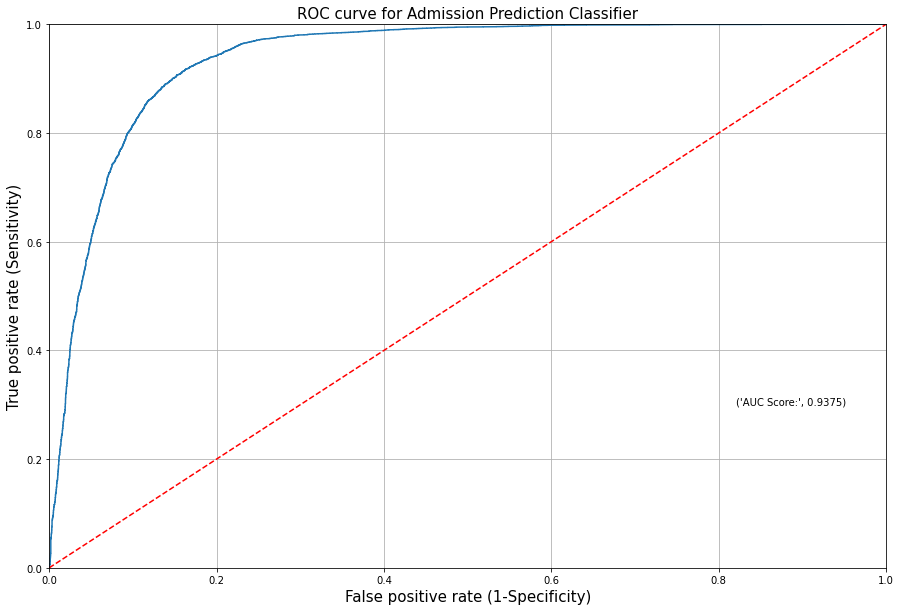

In [394]:
# call the function to plot the ROC curve
# pass the Logistic model to the function
plot_roc(log_mod)

- Interpretation: The red dotted line represents the ROC curve of a purely Logistic Model; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the Logistic Model model is away from the dotted line; with the AUC score 0.9375.

**K Nearest Neighbour Model**

k=1 93.78 (+/- 0.36)
k=2 93.62 (+/- 0.31)
k=3 92.90 (+/- 0.31)
k=4 93.20 (+/- 0.33)
k=5 92.37 (+/- 0.39)
k=6 92.67 (+/- 0.43)
k=7 92.03 (+/- 0.43)
k=8 92.27 (+/- 0.40)
k=9 91.67 (+/- 0.39)
k=10 91.89 (+/- 0.37)
k=11 91.41 (+/- 0.36)
k=12 91.59 (+/- 0.39)
k=13 91.18 (+/- 0.38)
k=14 91.30 (+/- 0.36)
k=15 90.95 (+/- 0.43)
k=16 91.06 (+/- 0.37)
k=17 90.77 (+/- 0.38)
k=18 90.93 (+/- 0.32)
k=19 90.61 (+/- 0.40)
k=20 90.72 (+/- 0.38)
k=21 90.45 (+/- 0.42)
k=22 90.46 (+/- 0.45)
k=23 90.31 (+/- 0.50)
k=24 90.29 (+/- 0.48)
k=25 90.14 (+/- 0.50)
The optimal number of neighbors is 0 with 93.8%


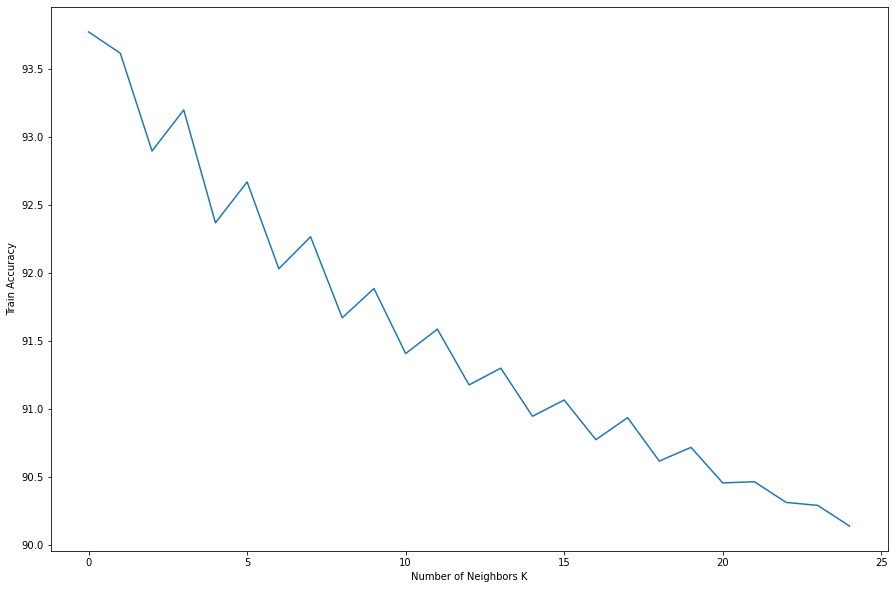

In [341]:
from sklearn import model_selection
from sklearn.neighbors import KNeighborsClassifier

x_train_smt,x_test_smt,y_train_smt,y_test_smt=train_test_split(x_smt,y_smt,test_size=0.2,random_state=16)

#Neighbors
neighbors = np.arange(0,25)

#Create empty list that will hold cv scores
cv_scores = []

#Perform 10-fold cross validation on training set for odd values of k:
for k in neighbors:
    k_value = k+1
    knn = KNeighborsClassifier(n_neighbors = k_value, weights='uniform', p=2, metric='euclidean')
    kfold = model_selection.KFold(n_splits=10, random_state=123,shuffle=True)
    scores = model_selection.cross_val_score(knn, x_train_smt, y_train_smt, cv=kfold, scoring='accuracy')
    cv_scores.append(scores.mean()*100)
    print("k=%d %0.2f (+/- %0.2f)" % (k_value, scores.mean()*100, scores.std()*100))

optimal_k = neighbors[cv_scores.index(max(cv_scores))]
print ("The optimal number of neighbors is %d with %0.1f%%" % (optimal_k, cv_scores[optimal_k]))

plt.plot(neighbors, cv_scores)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Train Accuracy')
plt.show()

In [342]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=22)
knn.fit(x_train_smt, y_train_smt)
knnpred = knn.predict(x_test_smt)

print(confusion_matrix(y_test_smt, knnpred))
print(round(accuracy_score(y_test_smt, knnpred),2)*100)
KNNCV = (cross_val_score(knn, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

[[6261 1085]
 [ 255 7019]]
91.0


**Decision Tree Model**

In [343]:
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(criterion='entropy') #criterion = entopy, gini
dtree = dtree.fit(x_train_smt, y_train_smt)
dtreepred = dtree.predict(x_test_smt)

print(confusion_matrix(y_test_smt, dtreepred))
print(round(accuracy_score(y_test_smt, dtreepred),2)*100)
DTREECV = (cross_val_score(dtree, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

[[6688  658]
 [ 557 6717]]
92.0


In [344]:
# create a generalized function to calculate the metrics values for train set
def get_train_report(model):
    
    # for training set:
    # train_pred: prediction made by the model on the train dataset 'X_train'
    # y_train: actual values of the target variable for the train dataset

    # predict the output of the target variable from the train data 
    train_pred = model.predict(x_train_smt)

    # return the performace measures on train set
    return(classification_report(y_train_smt, train_pred))

In [345]:
# create a generalized function to calculate the metrics values for test set
def get_test_report(model):
    
    # for test set:
    # test_pred: prediction made by the model on the test dataset 'X_test'
    # y_test: actual values of the target variable for the test dataset

    # predict the output of the target variable from the test data 
    test_pred = model.predict(x_test_smt)

    # return the performace measures on test set
    return(classification_report(y_test_smt, test_pred))

In [346]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the decision tree to the function
train_report = get_train_report(dtree)

# print the performance measures
print(train_report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     29202
           1       1.00      1.00      1.00     29274

    accuracy                           1.00     58476
   macro avg       1.00      1.00      1.00     58476
weighted avg       1.00      1.00      1.00     58476



In [347]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the decision tree to the function
test_report = get_test_report(dtree)

# print the performance measures
print(test_report)

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      7346
           1       0.91      0.92      0.92      7274

    accuracy                           0.92     14620
   macro avg       0.92      0.92      0.92     14620
weighted avg       0.92      0.92      0.92     14620



**Interpretation**: From the above output, we can see that there is a difference between the train and test accuracy; thus, we can conclude that the decision tree is over-fitted on the train data.

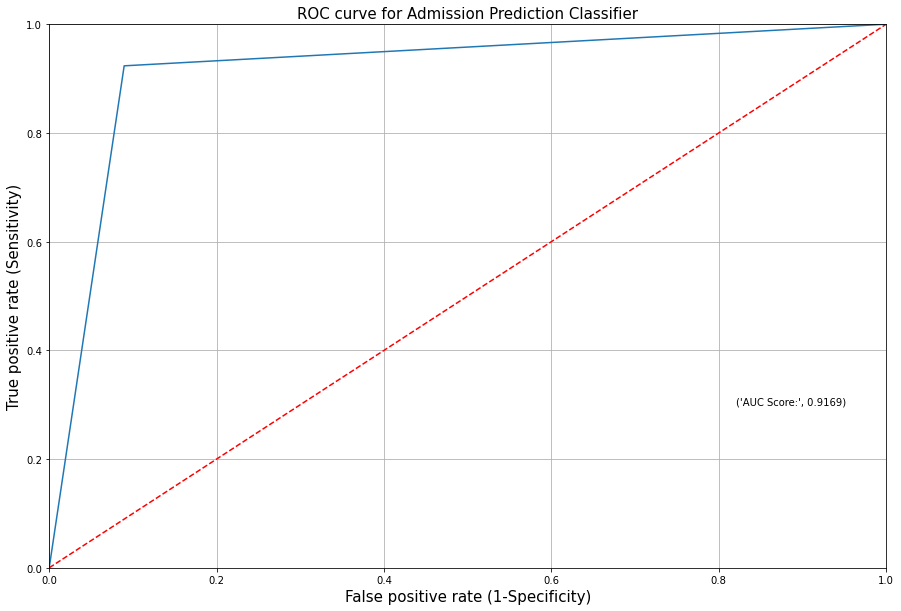

In [393]:
# call the function to plot the ROC curve
# pass the Decision Tree model to the function
plot_roc(dtree)

- Interpretation: The red dotted line represents the ROC curve of a purely Decision Tree model; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the Decision Tree model is away from the dotted line; with the AUC score 0.9169.

**Random Forest Classifier**

In [348]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators = 10)#criterion = entopy,gini
rfc_model=rfc.fit(x_train_smt, y_train_smt)
rfcpred = rfc.predict(x_test_smt)

print(confusion_matrix(y_test_smt, rfcpred ))
print(round(accuracy_score(y_test_smt, rfcpred),2)*100)
RFCCV = (cross_val_score(rfc, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

[[6825  521]
 [ 324 6950]]
94.0


In [349]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the random forest model to the function
train_report = get_train_report(rfc_model)

# print the performace measures
print(train_report) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     29202
           1       1.00      1.00      1.00     29274

    accuracy                           1.00     58476
   macro avg       1.00      1.00      1.00     58476
weighted avg       1.00      1.00      1.00     58476



In [350]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the random forest model to the function
test_report = get_test_report(rfc_model)

# print the performace measures
print(test_report) 

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      7346
           1       0.93      0.96      0.94      7274

    accuracy                           0.94     14620
   macro avg       0.94      0.94      0.94     14620
weighted avg       0.94      0.94      0.94     14620



**Interpretation**: From the above output, we can see that there is slight significant difference between the train and test accuracy; thus, we can conclude that the random forest model is less over-fiited after specifying some of the hyperparameters

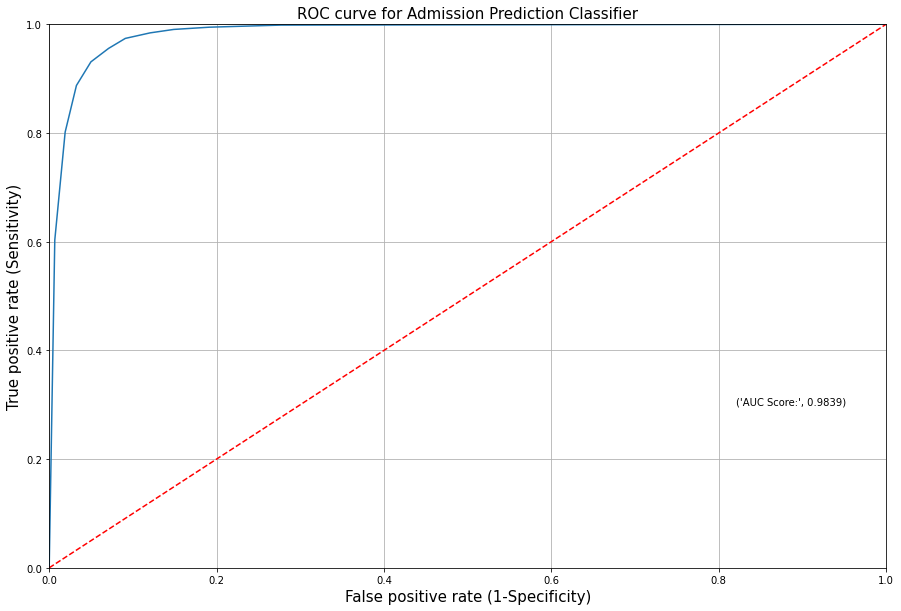

In [392]:
# call the function to plot the ROC curve
# pass the RfC model to the function
plot_roc(rfc_model)

- Interpretation: The red dotted line represents the ROC curve of a purely random classifier; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the RFC model is away from the dotted line; with the AUC score 0.9839.

**XGB Classifier**

In [351]:
conda install -c anaconda py-xgboost

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\ProgramData\Anaconda3

  added / updated specs:
    - py-xgboost


The following NEW packages will be INSTALLED:

  _py-xgboost-mutex  anaconda/win-64::_py-xgboost-mutex-2.0-cpu_0
  libxgboost         anaconda/win-64::libxgboost-1.5.0-hd77b12b_1
  py-xgboost         anaconda/win-64::py-xgboost-1.5.0-py39haa95532_1

The following packages will be UPDATED:

  conda              pkgs/main::conda-4.12.0-py39haa95532_0 --> anaconda::conda-4.13.0-py39haa95532_0

The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates                                 pkgs/main --> anaconda
  certifi                                         pkgs/main --> anaconda
  openssl                                         pkgs/main --> anaconda


Preparing transaction: ...working... done
Verifying transaction: ...working... failed

Note: you may need to restart the kernel to use updated packages.




==> WARNING: A newer version of conda exists. <==
  current version: 4.12.0
  latest version: 22.9.0

Please update conda by running

    $ conda update -n base -c defaults conda



EnvironmentNotWritableError: The current user does not have write permissions to the target environment.
  environment location: C:\ProgramData\Anaconda3




In [352]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [353]:

from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb_mod=xgb.fit(x_train_smt, y_train_smt)
xgbprd = xgb.predict(x_test_smt)

print(confusion_matrix(y_test_smt, xgbprd ))
print(round(accuracy_score(y_test_smt, xgbprd),2)*100)
XGB = (cross_val_score(estimator = xgb, X = x_train_smt, y = y_train_smt, cv = 10).mean())

[[6930  416]
 [ 330 6944]]
95.0


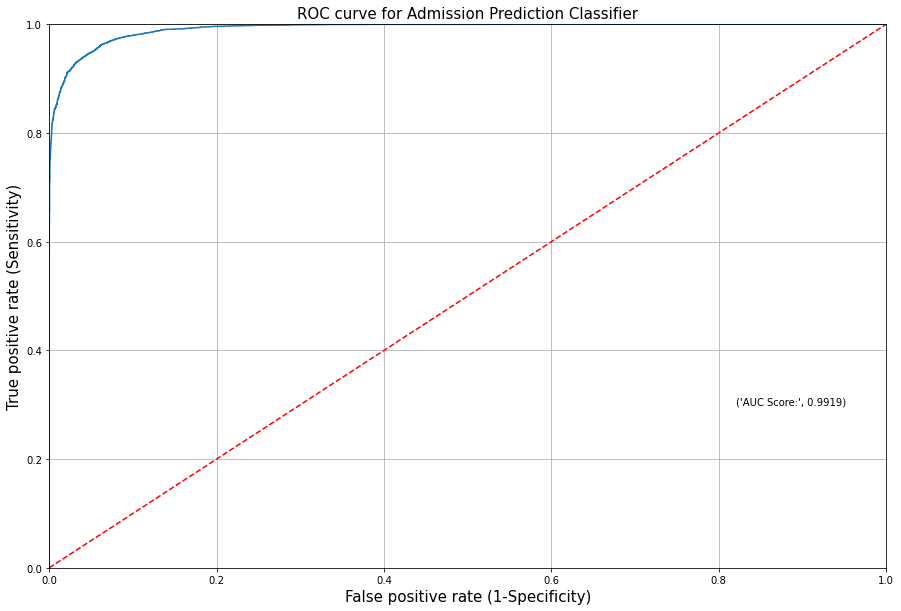

In [395]:
# call the function to plot the ROC curve
# pass the XGBoost model to the function
plot_roc(xgb_mod)


- Interpretation: The red dotted line represents the ROC curve of a purely XGB model; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the XGB model is away from the dotted line; with the AUC score 0.9919.

In [354]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the random forest model to the function
train_report = get_train_report(xgb_mod)

# print the performace measures
print(train_report)

              precision    recall  f1-score   support

           0       0.97      0.96      0.97     29202
           1       0.96      0.97      0.97     29274

    accuracy                           0.97     58476
   macro avg       0.97      0.97      0.97     58476
weighted avg       0.97      0.97      0.97     58476



In [355]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the random forest model to the function
test_report = get_test_report(xgb_mod)

# print the performace measures

print(test_report) 

              precision    recall  f1-score   support

           0       0.95      0.94      0.95      7346
           1       0.94      0.95      0.95      7274

    accuracy                           0.95     14620
   macro avg       0.95      0.95      0.95     14620
weighted avg       0.95      0.95      0.95     14620



**Gradient Boosting Classifier**

In [356]:
from sklearn.ensemble import GradientBoostingClassifier
gbk = GradientBoostingClassifier()
gbk_mod=gbk.fit(x_train_smt, y_train_smt)
gbkpred = gbk.predict(x_test_smt)
print(confusion_matrix(y_test_smt, gbkpred ))
print(round(accuracy_score(y_test_smt, gbkpred),2)*100)
GBKCV = (cross_val_score(gbk, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

[[6486  860]
 [ 343 6931]]
92.0


In [357]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the random forest model to the function
train_report = get_train_report(gbk_mod)

# print the performace measures
print(train_report)

              precision    recall  f1-score   support

           0       0.95      0.88      0.91     29202
           1       0.89      0.95      0.92     29274

    accuracy                           0.92     58476
   macro avg       0.92      0.92      0.92     58476
weighted avg       0.92      0.92      0.92     58476



In [358]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the random forest model to the function
test_report = get_test_report(gbk_mod)

# print the performace measures

print(test_report) 

              precision    recall  f1-score   support

           0       0.95      0.88      0.92      7346
           1       0.89      0.95      0.92      7274

    accuracy                           0.92     14620
   macro avg       0.92      0.92      0.92     14620
weighted avg       0.92      0.92      0.92     14620



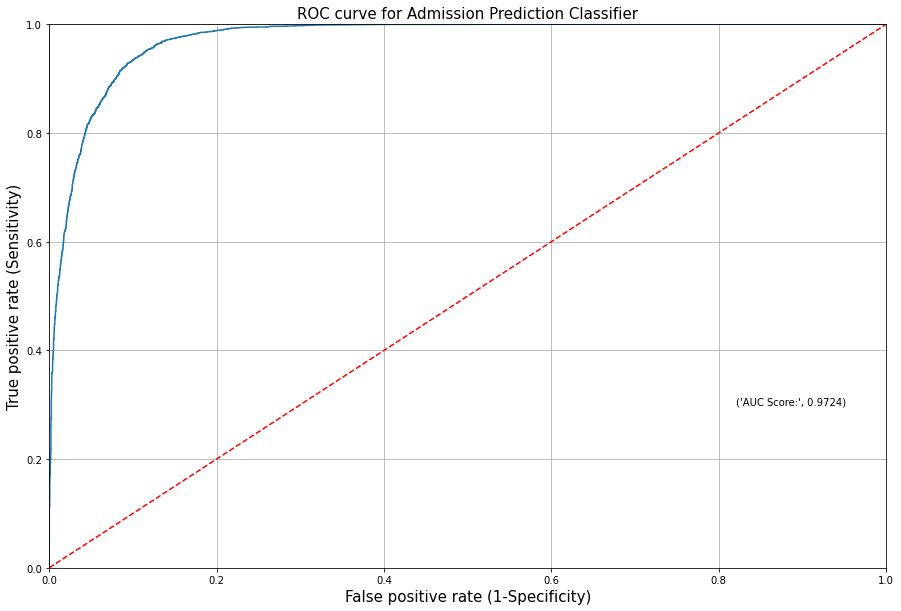

In [396]:
# call the function to plot the ROC curve
# pass the GBK model to the function
plot_roc(gbk_mod)

- Interpretation: The red dotted line represents the ROC curve of a purely GBK model; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the GBK model is away from the dotted line; with the AUC score 0.9724.

**Gaussian Naive Bayes Classifier**

In [359]:
from sklearn.naive_bayes import GaussianNB
gaussiannb= GaussianNB()
g_mod = gaussiannb.fit(x_train_smt, y_train_smt)
gaussiannbpred = gaussiannb.predict(x_test_smt)
probs = gaussiannb.predict(x_test_smt)

print(confusion_matrix(y_test_smt, gaussiannbpred ))
print(round(accuracy_score(y_test_smt, gaussiannbpred),2)*100)
GAUSIAN = (cross_val_score(gaussiannb, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

[[6072 1274]
 [1551 5723]]
81.0


In [360]:
# compute the performance measures on train data
# call the function 'get_train_report'
# pass the random forest model to the function
train_report = get_train_report(g_mod)

# print the performace measures
print(train_report)

              precision    recall  f1-score   support

           0       0.80      0.82      0.81     29202
           1       0.82      0.79      0.80     29274

    accuracy                           0.81     58476
   macro avg       0.81      0.81      0.81     58476
weighted avg       0.81      0.81      0.81     58476



In [361]:
# compute the performance measures on test data
# call the function 'get_test_report'
# pass the random forest model to the function
test_report = get_test_report(g_mod)

# print the performace measures

print(test_report)

              precision    recall  f1-score   support

           0       0.80      0.83      0.81      7346
           1       0.82      0.79      0.80      7274

    accuracy                           0.81     14620
   macro avg       0.81      0.81      0.81     14620
weighted avg       0.81      0.81      0.81     14620



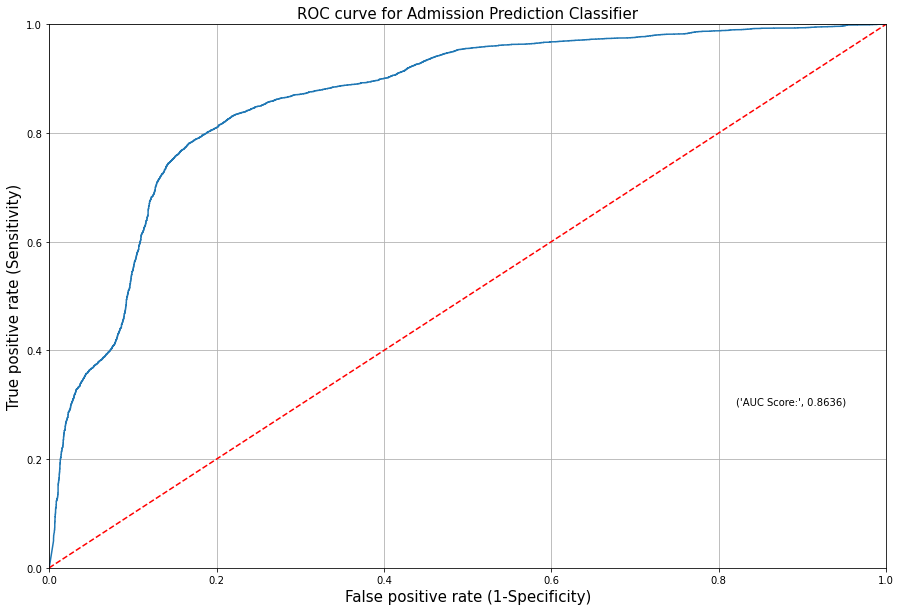

In [397]:
# call the function to plot the ROC curve
# pass the GNB model to the function
plot_roc(g_mod)

- Interpretation: The red dotted line represents the ROC curve of a purely GNB model; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the GNB model is away from the dotted line; with the AUC score 0.8636.

In [362]:
models = pd.DataFrame({
                'Models': ['Random Forest Classifier', 'Decision Tree Classifier',
                           'K-Near Neighbors', 'Logistic Model', 'Gausian NB', 'XGBoost', 'Gradient Boosting'],
                'Score':  [RFCCV, DTREECV, KNNCV, LOGCV, GAUSIAN, XGB, GBKCV]})

models.sort_values(by='Score', ascending=False)

,Models,Score
5,XGBoost,0.945961
0,Random Forest Classifier,0.937974
6,Gradient Boosting,0.913041
1,Decision Tree Classifier,0.910527
2,K-Near Neighbors,0.904388
3,Logistic Model,0.872306
4,Gausian NB,0.806707


From the above output, we can see that the top 5 models with good performance metrics are
1) XG Boost
2) Random Forest Classifier
3) Gradient Boosting
4) Decision Tree
5) KNN

We'll be now performing Hyperparameter Tuning to the best selected models to check whether the models are over-fitted or not.

We'll be performing Hyperparameter Tuning for
1) Decision Tree 
2) Random Forest Classifier
3) XGB Classifier

### Over-fitting in Decision Tree

#### Build a decision tree using 'criterion = gini', 'max_depth = 5', 'min_samples_split = 4', 'max_leaf_nodes = 6'.

In [363]:
# pass the criteria 'gini' to the parameter, 'criterion' 
# max_depth: that assigns maximum depth of the tree
# min_samples_split: assigns minimum number of samples to split an internal node
# max_leaf_nodes': assigns maximum number of leaf nodes in the tree
# pass the 'random_state' to obtain the same samples for each time you run the code
dt_model = DecisionTreeClassifier(criterion = 'gini',
                                  max_depth = 5,
                                  min_samples_split = 4,
                                  max_leaf_nodes = 6,
                                  random_state = 10)

# fit the model using fit() on train data
decision_tree = dt_model.fit(x_train_smt,y_train_smt)

# compute the performance measures on train data
# call the function 'get_train_report'
# pass the decision tree to the function
train_report = get_train_report(decision_tree)

# print the performance measures
print('Train data:\n', train_report)

# compute the performance measures on test data
# call the function 'get_test_report'
# pass the decision tree to the function
test_report = get_test_report(decision_tree)

# print the performance measures
print('Test data:\n', test_report)

Train data:
               precision    recall  f1-score   support

           0       0.93      0.78      0.85     29202
           1       0.81      0.94      0.87     29274

    accuracy                           0.86     58476
   macro avg       0.87      0.86      0.86     58476
weighted avg       0.87      0.86      0.86     58476

Test data:
               precision    recall  f1-score   support

           0       0.93      0.79      0.85      7346
           1       0.81      0.94      0.87      7274

    accuracy                           0.86     14620
   macro avg       0.87      0.86      0.86     14620
weighted avg       0.87      0.86      0.86     14620



**Interpretation**: From the above output, we can see that there is slight significant difference between the train and test accuracy; thus, we can conclude that the decision tree is less over-fiited after specifying some of the hyperparameters.

### Tune the Hyperparameters using GridSearchCV (Decision Tree)

In [365]:
# create a dictionary with hyperparameters and its values
# pass the criteria 'entropy' and 'gini' to the parameter, 'criterion' 
# pass the range of values to 'max_depth' that assigns maximum depth of the tree
# 'max_features' assigns maximum number of features to consider for the best split. We pass the string 'sqrt' and 'log2'
# 'sqrt' considers maximum number of features equal to the square root of total features
# 'log2' considers maximum number of features equal to the log of total features with base 2
# pass the range of values to 'min_samples_split' that assigns minimum number of samples to split an internal node
# pass the range of values to 'min_samples_leaf' that assigns minimum number of samples required at the terminal/leaf node
# pass the range of values to 'max_leaf_nodes' that assigns maximum number of leaf nodes in the tree
tuned_paramaters = [{'criterion': ['entropy', 'gini'], 
                     'max_depth': range(2, 10),
                     'max_features': ["sqrt", "log2"],
                     'min_samples_split': range(2,10),
                     'min_samples_leaf': range(1,10),
                     'max_leaf_nodes': range(1, 10)}]
 
# instantiate the 'DecisionTreeClassifier' 
# pass the 'random_state' to obtain the same samples for each time you run the code
decision_tree_classification = DecisionTreeClassifier(random_state = 10)

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the decision tree classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 5
tree_grid = GridSearchCV(estimator = decision_tree_classification, 
                         param_grid = tuned_paramaters, 
                         cv = 5)

# fit the model on X_train and y_train using fit()
tree_grid_model = tree_grid.fit(x_train_smt,y_train_smt)

# get the best parameters
print('Best parameters for decision tree classifier: ', tree_grid_model.best_params_, '\n')

Best parameters for decision tree classifier:  {'criterion': 'entropy', 'max_depth': 7, 'max_features': 'sqrt', 'max_leaf_nodes': 9, 'min_samples_leaf': 1, 'min_samples_split': 2} 



# Build the model using the tuned hyperparameters.


In [367]:
# instantiate the 'DecisionTreeClassifier'
# 'best_params_' returns the dictionary containing best parameter values and parameter name  
# 'get()' returns the value of specified parameter
# pass the 'random_state' to obtain the same samples for each time you run the code
dt_model = DecisionTreeClassifier(criterion = tree_grid_model.best_params_.get('criterion'),
                                  max_depth = tree_grid_model.best_params_.get('max_depth'),
                                  max_features = tree_grid_model.best_params_.get('max_features'),
                                  max_leaf_nodes = tree_grid_model.best_params_.get('max_leaf_nodes'),
                                  min_samples_leaf = tree_grid_model.best_params_.get('min_samples_leaf'),
                                  min_samples_split = tree_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)

# use fit() to fit the model on the train set
dt_model = dt_model.fit(x_train_smt, y_train_smt)

# Calculate performance measures on the train set


In [368]:
# print the performance measures for train set for the model with best parameters
# call the function 'get_test_report'
# pass the decision tree using GridSearch to the function
print('Classification Report for train set: \n', get_train_report(dt_model))


Classification Report for train set: 
               precision    recall  f1-score   support

           0       0.82      0.73      0.77     29202
           1       0.76      0.84      0.80     29274

    accuracy                           0.78     58476
   macro avg       0.79      0.78      0.78     58476
weighted avg       0.79      0.78      0.78     58476



# Calculate performance measures on the test set.


In [369]:
# print the performance measures for test set for the model with best parameters
# call the function 'get_test_report'
# pass the decision tree using GridSearch to the function
print('Classification Report for test set: \n', get_test_report(dt_model))


Classification Report for test set: 
               precision    recall  f1-score   support

           0       0.83      0.73      0.78      7346
           1       0.76      0.84      0.80      7274

    accuracy                           0.79     14620
   macro avg       0.79      0.79      0.79     14620
weighted avg       0.79      0.79      0.79     14620



- From the above output we can see that the accuracy of both train and test set are equal after tuning the hyperparameters.


In [401]:
DTREE = (cross_val_score(dt_model, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())
DTREE

0.7808333725223477

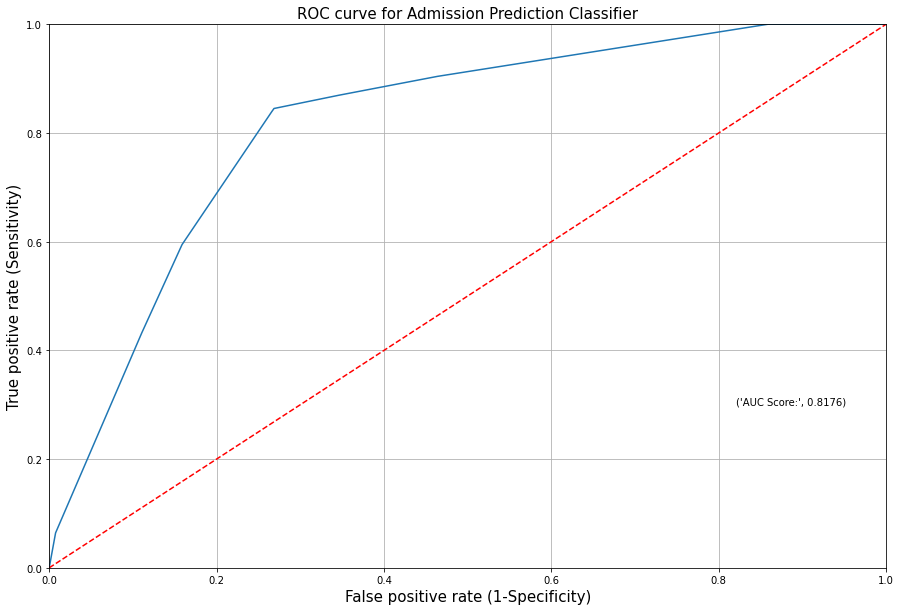

In [409]:
# call the function to plot the ROC curve
# pass the DTREE model to the function
plot_roc(dt_model)

- Interpretation: The red dotted line represents the ROC curve of a purely DTREE model; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the DTREE model is away from the dotted line; with the AUC score 0.8176.

# Tune the Hyperparameters using GridSearchCV (Random Forest)


In [370]:
# create a dictionary with hyperparameters and its values
# pass the criteria 'entropy' and 'gini' to the parameter, 'criterion' 
# pass a list of values to 'n_estimators' to build the different number of trees in the random forest
# pass a list of values to 'max_depth' that assigns maximum depth of the tree
# 'max_features' assigns maximum number of features to consider for the best split. We pass the string 'sqrt' and 'log2'
# 'sqrt' considers maximum number of features equal to the square root of total features
# 'log2' considers maximum number of features equal to the log of total features with base 2
# pass a list of values to 'min_samples_split' that assigns minimum number of samples to split an internal node
# pass a list of values to 'min_samples_leaf' that assigns minimum number of samples required at the terminal/leaf node
# pass a list of values to 'max_leaf_nodes' that assigns maximum number of leaf nodes in the tree
tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators': [10, 30, 50, 70, 90],
                     'max_depth': [10, 15, 20],
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': [2, 5, 8, 11],
                     'min_samples_leaf': [1, 5, 9],
                     'max_leaf_nodes': [2, 5, 8, 11]}]
 
# instantiate the 'RandomForestClassifier' 
# pass the 'random_state' to obtain the same samples for each time you run the code
random_forest_classification = RandomForestClassifier(random_state = 10)

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the random forest classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 5
rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)

# use fit() to fit the model on the train set
rf_grid_model = rf_grid.fit(x_train_smt, y_train_smt)

# get the best parameters
print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')

Best parameters for random forest classifier:  {'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10} 



In [372]:
# instantiate the 'RandomForestClassifier'
# 'best_params_' returns the dictionary containing best parameter values and parameter name  
# 'get()' returns the value of specified parameter
# pass the 'random_state' to obtain the same samples for each time you run the code
rf_model = RandomForestClassifier(criterion = rf_grid_model.best_params_.get('criterion'), 
                                  n_estimators = rf_grid_model.best_params_.get('n_estimators'),
                                  max_depth = rf_grid_model.best_params_.get('max_depth'),
                                  max_features = rf_grid_model.best_params_.get('max_features'),
                                  max_leaf_nodes = rf_grid_model.best_params_.get('max_leaf_nodes'),
                                  min_samples_leaf = rf_grid_model.best_params_.get('min_samples_leaf'),
                                  min_samples_split = rf_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)

# use fit() to fit the model on the train set
rf_model = rf_model.fit(x_train_smt, y_train_smt)

# print the performance measures for test set for the model with best parameters
print('Classification Report for test set:\n', get_test_report(rf_model))

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.95      0.83      0.89      7346
           1       0.85      0.95      0.90      7274

    accuracy                           0.89     14620
   macro avg       0.90      0.89      0.89     14620
weighted avg       0.90      0.89      0.89     14620



In [402]:
RFC = (cross_val_score(rf_model, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())
RFC

0.8892194004572129

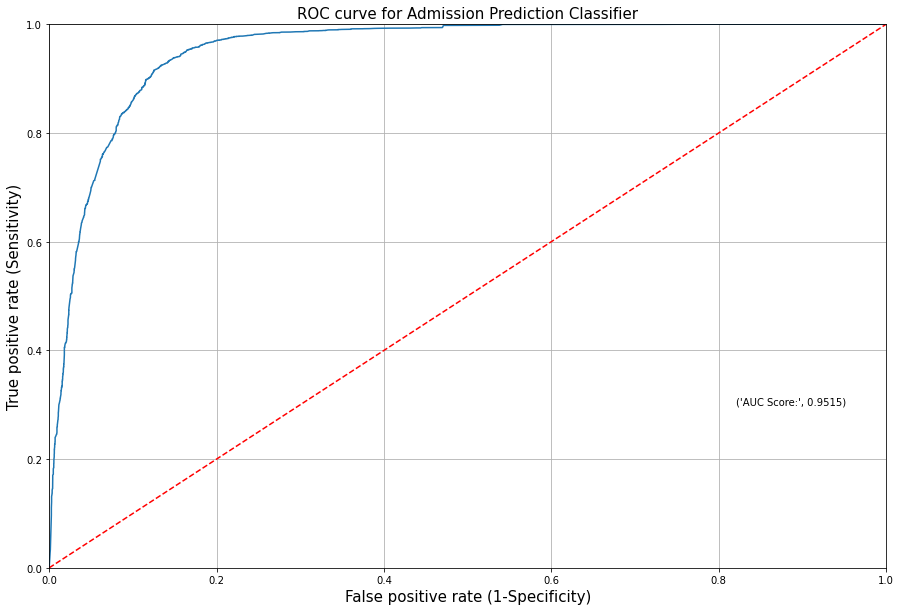

In [410]:
# call the function to plot the ROC curve
# pass the RFC model to the function
plot_roc(rf_model)

- Interpretation: The red dotted line represents the ROC curve of a purely RFC model; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the RFC model is away from the dotted line; with the AUC score 0.9515.

# Let us tune the hyperparameters to obtain the optimal values for the XGBoost model.


In [373]:
# create a dictionary with hyperparameters and its values
# learning_rate: pass the list of boosting learning rates
# max_depth: pass the range of values as the maximum tree depth for base learners
# gamma: pass the list of minimum loss reduction values required to make a further partition on a leaf node of the tree
tuning_parameters = {'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
                     'max_depth': range(3,10),
                     'gamma': [0, 1, 2, 3, 4]}

# instantiate the 'XGBClassifier' 
xgb_model = XGBClassifier()

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the XGBoost classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 3
# scoring: pass a measure to evaluate the model on test set
xgb_grid = GridSearchCV(estimator = xgb_model, param_grid = tuning_parameters, cv = 3, scoring = 'roc_auc')

# fit the model on X_train and y_train using fit()
xgb_grid.fit(x_train_smt, y_train_smt)

# get the best parameters
print('Best parameters for XGBoost classifier: ', xgb_grid.best_params_, '\n')

Best parameters for XGBoost classifier:  {'gamma': 0, 'learning_rate': 0.3, 'max_depth': 9} 



# Build the model using the tuned hyperparameters.


In [375]:
# instantiate the 'XGBClassifier'
# 'best_params_' returns the dictionary containing best parameter values and parameter name  
# 'get()' returns the value of specified parameter
xgb_grid_model = XGBClassifier(learning_rate = xgb_grid.best_params_.get('learning_rate'),
                               max_depth = xgb_grid.best_params_.get('max_depth'),
                              gamma = xgb_grid.best_params_.get('gamma'))

# use fit() to fit the model on the train set
xgb_model = xgb_grid_model.fit(x_train_smt, y_train_smt)

# print the performance measures for test set for the model with best parameters
print('Classification Report for test set:\n', get_test_report(xgb_model))

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.96      0.95      0.95      7346
           1       0.95      0.96      0.95      7274

    accuracy                           0.95     14620
   macro avg       0.95      0.95      0.95     14620
weighted avg       0.95      0.95      0.95     14620



In [403]:
XGB = (cross_val_score(xgb_model, x_train_smt, y_train_smt, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())
XGB

0.9489362668474743

In [384]:
from sklearn.metrics import roc_curve

In [389]:
from sklearn.metrics import roc_auc_score

In [390]:
def plot_roc(model):
    y_pred_prob = model.predict_proba(x_test_smt)[:,1]
    
    # the roc_curve() returns the values for false positive rate, true positive rate and threshold
    # pass the actual target values and predicted probabilities to the function
    fpr, tpr, thresholds = roc_curve(y_test_smt, y_pred_prob)

    # plot the ROC curve
    plt.plot(fpr, tpr)

    # set limits for x and y axes
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])

    # plot the straight line showing worst prediction for the model
    plt.plot([0, 1], [0, 1],'r--')

    # add plot and axes labels
    # set text size using 'fontsize'
    plt.title('ROC curve for Admission Prediction Classifier', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

    # add the AUC score to the plot
    # 'x' and 'y' gives position of the text
    # 's' is the text 
    # use round() to round-off the AUC score upto 4 digits
    plt.text(x = 0.82, y = 0.3, s = ('AUC Score:',round(roc_auc_score(y_test_smt, y_pred_prob),4)))

    # plot the grid
    plt.grid(True)

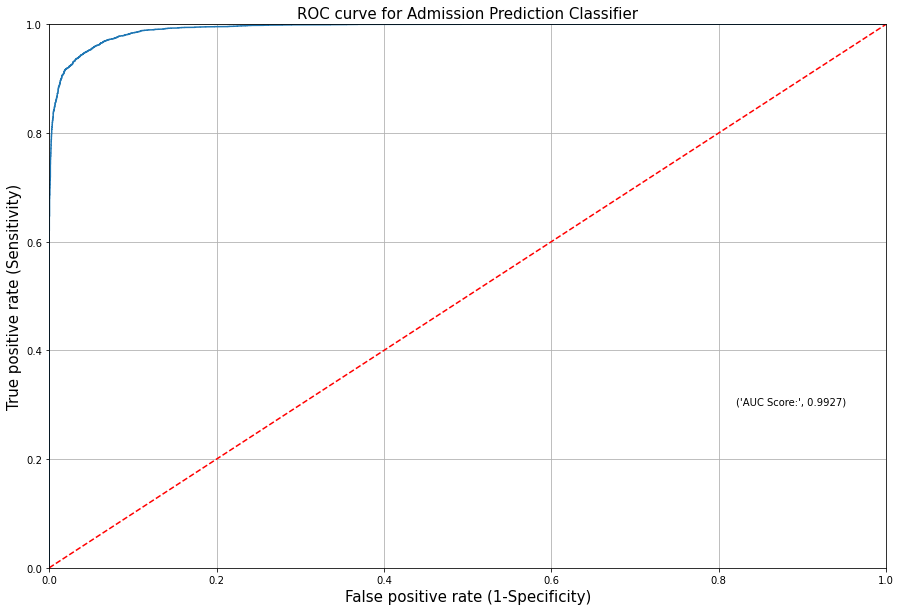

In [404]:
# call the function to plot the ROC curve
# pass the XGBoost model to the function
plot_roc(xgb_model)

- Interpretation: The red dotted line represents the ROC curve of a purely random classifier; a good classifier stays as far away from that line as possible (toward the top-left corner).
- From the above plot, we can see that the XG Boost model is away from the dotted line; with the AUC score 0.9927

## Comparing the performance of the 3 hypertuned models using accuracy as the evaluation metric 

In [407]:
models = pd.DataFrame({
                'Models': ['Random Forest Classifier', 'Decision Tree Classifier',
                           'XGBoost'],
                'Score':  [RFC, DTREE,  XGB]})

models.sort_values(by='Score', ascending=False)

,Models,Score
2,XGBoost,0.948936
0,Random Forest Classifier,0.889219
1,Decision Tree Classifier,0.780833


- From the above output we can see that hypertuned  XG Boost model & hypertuned Random Forest Classifier is having good performance .
- So we will now be performing Feature Engineering on the best selected 2 models from the above step.

# Feature Selection of XG Boost Model

**Identify the Important Features using XGBoost**

Let us create a barplot to identify the important feature in the dataset.

The method feature_importances_ returns the value corresponding to each feature which is defined as the ratio of the average gain across all the splits in which the feature is used to the total average gain of all the features.

There are different methods like weight, cover, total_gain and total_cover which returns the feature importance based on different criteria.

weight: It is the frequency of a feature used to split the data in all the trees.

cover: It is the average cover value of a feature for all the splits.

total_gain: It is the sum of gain of a feature for all the splits.

total_cover: It is the sum of a cover of a feature for all the splits.

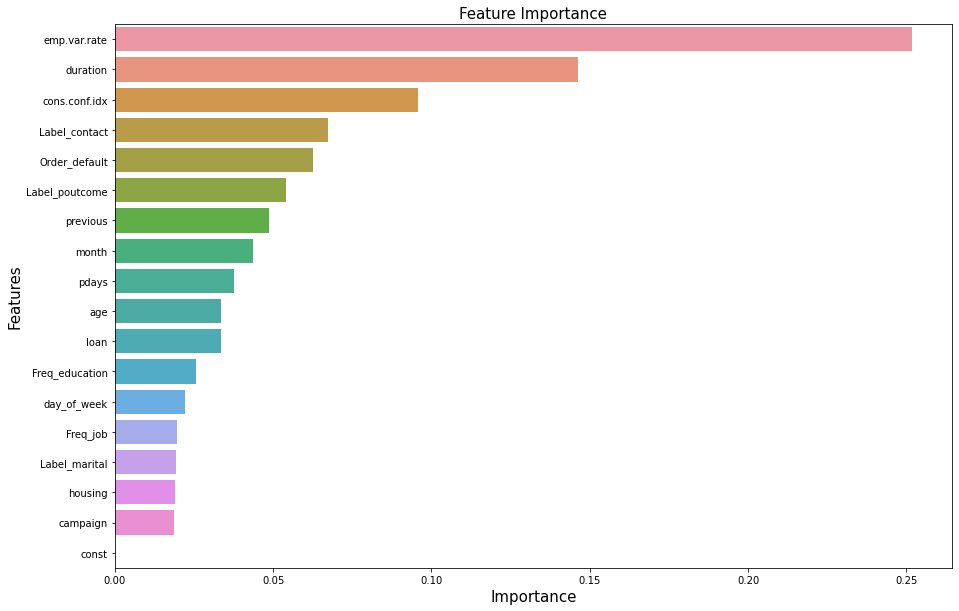

In [408]:
# create a dataframe that stores the feature names and their importance
# 'feature_importances_' returns the features based on the average gain 
important_features = pd.DataFrame({'Features': x_train_smt.columns, 
                                   'Importance': xgb_model.feature_importances_})

# sort the dataframe in the descending order according to the feature importance
important_features = important_features.sort_values('Importance', ascending = False)

# create a barplot to visualize the features based on their importance
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

# Feature Selection of Random Forest Model

# Identify the Important Features

- Let us create a barplot to identify the important feature in the dataset.

- The method feature_importances_ returns the value corresponding to each feature which is defined as the ratio of total decrease in Gini impurity across every tree in the forest where the feature is used to the total count of trees in the forest. This is also caled as, Gini Importance.

- There is another accuracy-based method. It calculates the average decrease in the accuracy calculated on the out-of-bag samples, with and without shuffling the variable across all the trees in the random forest. The out-of-bag samples are the samples in the training dataset which are not considered whild building a tree.

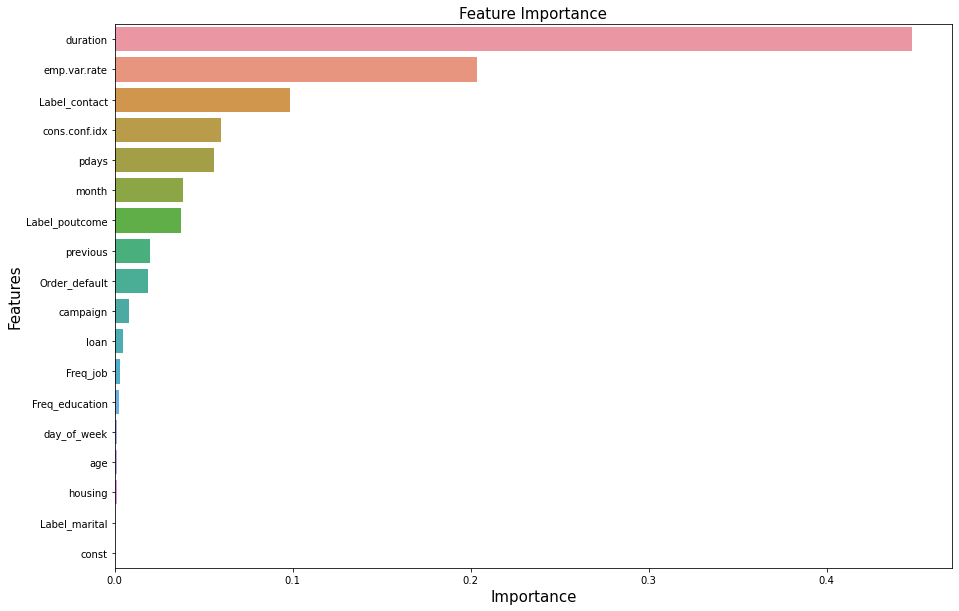

In [377]:
# create a dataframe that stores the feature names and their importance
# 'feature_importances_' returns the features based on the gini importance
important_features = pd.DataFrame({'Features': x_train_smt.columns, 
                                   'Importance': rf_model.feature_importances_})

# sort the dataframe in the descending order according to the feature importance
important_features = important_features.sort_values('Importance', ascending = False)

# create a barplot to visualize the features based on their importance
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)

plt.ylabel('Features', fontsize = 15)

# display the plot
plt.show()

## Business and EDA Insights

-From the EDA and model selection part we can clearly identify duration playing an important attribute in defining the outcome of our dataset. 

-It is absolute that the more the leads are interested in starting a deposit will have higher number of calls and the call duration will be higher than the average. 

-We also figure out that emp var rate and contacts also acts as a crucial deciding factor and influences the outcome alot.

-It is evident that as there are more number of employees in the company gradullay more number of clients can be contacted there by increasing the chances of predicting output variable.


## Further Improvements

- From EDA Analysis we got to know that the variables education and job are very significant in predicting the output variable.


- But from our Hypertuned XG Boost model we didn't get the same insights, this is beacuse we have performed frequency encoding on these two variables.


- We haven't treated any outliers in our dataset, this might also be a hindrnace for the expected output.


- Grouping on the Age column needs to be done, from EDA analysis we also got to know that age is a very significant variable
in determining the target variable.